## Load libraries

In [243]:
import pandas as pd
import numpy as np
import geopandas as gpd

# crs transformer
import pyproj
from shapely.geometry import Point

# buffer zone
from shapely.ops import unary_union

# Packages for standardising the dataset
from sklearn.preprocessing import RobustScaler

# Packages for clustering analysis
import sklearn.cluster as sklc  # for clustering
import sklearn.metrics as sklm  # for the silhouette score
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import KMeans, DBSCAN, OPTICS, AgglomerativeClustering


# plot
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap
import matplotlib.patches as mpatches
import matplotlib.lines as mlines
import plotly.express as px
from scipy.cluster.hierarchy import dendrogram, linkage # hierarchical clustering visualisation

## Read in files

Data Sources:

- borough - London Borough boundary (GLA https://data.london.gov.uk/dataset/london_boroughs )

- high_street - High Street Boundary (GLA https://data.london.gov.uk/dataset/gla-high-street-boundaries)

- 2021 England LSOA boundary (ONS Geography https://geoportal.statistics.gov.uk/datasets/766da1380a3544c5a7ca9131dfd4acb6_0/explore)

- 2011 London LSOA boundary (ONS https://data.london.gov.uk/dataset/super-output-area-population-lsoa-msoa-london)

- LSOA (2011) to LSOA (2021) to Local Authority District (2022) Lookup for England and Wales (Version 2) (ONS Geography https://geoportal.statistics.gov.uk/datasets/ons::lsoa-2011-to-lsoa-2021-to-local-authority-district-2022-lookup-for-england-and-wales-version-2/explore)

- onspd - ONS Postcode Directory (May 2023) (https://geoportal.statistics.gov.uk/datasets/bd25c421196b4546a7830e95ecdd70bc/about)

- deprivation & age - 2021 census LSOA demography and migration (Census Information Scheme https://data.london.gov.uk/dataset/2021-census-lsoa-demography-and-migration)

- occupation - 2021 census lsoa labour market (Census Information Scheme https://data.london.gov.uk/dataset/2021-census-lsoa-labour-market)

- houseprice - Median house prices by lower layer super output area: HPSSA dataset 46 (release date:21 June 2023) (ONS https://www.ons.gov.uk/peoplepopulationandcommunity/housing/datasets/medianpricepaidbylowerlayersuperoutputareahpssadataset46)

- openlocal - Commercial composition data (OpenLocal https://openlocal.uk)

In [2]:
# Geography boundaries
borough = gpd.read_file('./Data/London_Boroughs.gpkg')

high_street = gpd.read_file('./Data/GLA_High_Street_boundaries.gpkg')

lsoa11_LD = gpd.read_file('./Data/statistical-gis-boundaries-london/ESRI/LSOA_2011_London_gen_MHW.shp') 

lsoa21_ENG = gpd.read_file('./Data/LSOA_Dec_2021_Boundaries_Generalised_Clipped_EW_BGC_2022_5000101660793162025/LSOA_2021_EW_BGC.shp')

In [3]:
# Data in LSOAs level
deprivation11 = pd.read_excel('./Data/Household_deprivation.xlsx', sheet_name=2)
deprivation21 = pd.read_excel('./Data/Household_deprivation.xlsx', sheet_name=3)
deprivation_changes = pd.read_excel('./Data/Household_deprivation.xlsx', sheet_name=4) # change 2011-2021

age11 = pd.read_excel('./Data/Five_year_age_bands.xlsx', sheet_name=2)
age21 = pd.read_excel('./Data/Five_year_age_bands.xlsx', sheet_name=3)
age_changes = pd.read_excel('./Data/Five_year_age_bands.xlsx', sheet_name=4) # change 2011-2021

occupation11 = pd.read_excel('./Data/occupation.xlsx', sheet_name=2)
occupation21 = pd.read_excel('./Data/occupation.xlsx', sheet_name=3)
occupation_changes = pd.read_excel('./Data/occupation.xlsx', sheet_name=4) # change 2011-2021

houseprice = pd.read_excel('./Data/hpssadataset46medianpricepaidforresidentialpropertiesbylsoa.xls', sheet_name=5, skiprows=range(5))
# houseprice contains data of all lsoas in the england

In [4]:
# Openlocal Data
openlocal11_wf = pd.read_csv('./Data/2021-03-E09000031-waltham-forest-location-report/2011-03-E09000031-waltham-forest-location-report.csv')
openlocal21_wf = pd.read_csv('./Data/2021-03-E09000031-waltham-forest-location-report/2021-03-E09000031-waltham-forest-location-report.csv')

openlocal22_bx = pd.read_csv('./Data/2022-10-E0900004-bexley-location-report/2022-10-08-E09000004-local.csv')

In [5]:
# ONS LSOA lookup
lsoa_lookup = pd.read_csv('./Data/LSOA_(2011)_to_LSOA_(2021)_to_Local_Authority_District_(2022)_Lookup_for_England_and_Wales_(Version_2).csv', low_memory=False)

# ONS Postcode Dictionary
onspd = pd.read_csv('./Data/ONSPD_MAY_2023_UK/Data/ONSPD_MAY_2023_UK.csv', low_memory=False)

#### Preview and check the data types

In [6]:
borough.head()

,objectid,name,gss_code,hectares,nonld_area,ons_inner,sub_2011,geometry
0,1,Kingston upon Thames,E09000021,3726.117,0.000,F,South,"POLYGON ((516401.600 160201.800, 516407.300 16..."
1,2,Croydon,E09000008,8649.441,0.000,F,South,"POLYGON ((535009.200 159504.700, 535005.500 15..."
2,3,Bromley,E09000006,15013.487,0.000,F,South,"POLYGON ((540373.600 157530.400, 540361.200 15..."
3,4,Hounslow,E09000018,5658.541,60.755,F,West,"POLYGON ((509703.400 175356.600, 509712.600 17..."
4,5,Ealing,E09000009,5554.428,0.000,F,West,"POLYGON ((515647.200 178787.800, 515608.800 17..."


In [7]:
borough.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 33 entries, 0 to 32
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   objectid    33 non-null     int64   
 1   name        33 non-null     object  
 2   gss_code    33 non-null     object  
 3   hectares    33 non-null     float64 
 4   nonld_area  33 non-null     float64 
 5   ons_inner   33 non-null     object  
 6   sub_2011    33 non-null     object  
 7   geometry    33 non-null     geometry
dtypes: float64(2), geometry(1), int64(1), object(4)
memory usage: 2.2+ KB


In [8]:
borough.crs

<Derived Projected CRS: EPSG:27700>
Name: OSGB36 / British National Grid
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: United Kingdom (UK) - offshore to boundary of UKCS within 49°45'N to 61°N and 9°W to 2°E; onshore Great Britain (England, Wales and Scotland). Isle of Man onshore.
- bounds: (-9.0, 49.75, 2.01, 61.01)
Coordinate Operation:
- name: British National Grid
- method: Transverse Mercator
Datum: Ordnance Survey of Great Britain 1936
- Ellipsoid: Airy 1830
- Prime Meridian: Greenwich

In [9]:
lsoa11_LD.head()

,LSOA11CD,LSOA11NM,MSOA11CD,MSOA11NM,LAD11CD,LAD11NM,RGN11CD,RGN11NM,USUALRES,HHOLDRES,COMESTRES,POPDEN,HHOLDS,AVHHOLDSZ,geometry
0,E01000001,City of London 001A,E02000001,City of London 001,E09000001,City of London,E12000007,London,1465,1465,0,112.9,876,1.7,"POLYGON ((532105.092 182011.230, 532162.491 18..."
1,E01000002,City of London 001B,E02000001,City of London 001,E09000001,City of London,E12000007,London,1436,1436,0,62.9,830,1.7,"POLYGON ((532746.813 181786.891, 532671.688 18..."
2,E01000003,City of London 001C,E02000001,City of London 001,E09000001,City of London,E12000007,London,1346,1250,96,227.7,817,1.5,"POLYGON ((532135.145 182198.119, 532158.250 18..."
3,E01000005,City of London 001E,E02000001,City of London 001,E09000001,City of London,E12000007,London,985,985,0,52.0,467,2.1,"POLYGON ((533807.946 180767.770, 533649.063 18..."
4,E01000006,Barking and Dagenham 016A,E02000017,Barking and Dagenham 016,E09000002,Barking and Dagenham,E12000007,London,1703,1699,4,116.2,543,3.1,"POLYGON ((545122.049 184314.931, 545271.917 18..."


In [10]:
lsoa11_LD.crs

<Derived Projected CRS: PROJCS["OSGB36 / British National Grid",GEOGCS["OS ...>
Name: OSGB36 / British National Grid
Axis Info [cartesian]:
- [east]: Easting (metre)
- [north]: Northing (metre)
Area of Use:
- undefined
Coordinate Operation:
- name: unnamed
- method: Transverse Mercator
Datum: Ordnance Survey of Great Britain 1936
- Ellipsoid: Airy 1830
- Prime Meridian: Greenwich

In [11]:
lsoa21_ENG.head()

,LSOA21CD,LSOA21NM,GlobalID,geometry
0,E01000001,City of London 001A,f1865556-4e62-48e3-a025-d93a40f15e46,"POLYGON ((532105.312 182010.574, 532162.491 18..."
1,E01000002,City of London 001B,83e78aad-ee05-44a5-a8d3-077de6ed4053,"POLYGON ((532634.497 181926.016, 532619.141 18..."
2,E01000003,City of London 001C,69c457df-229e-4446-9577-95ac1c9be694,"POLYGON ((532135.138 182198.131, 532158.250 18..."
3,E01000005,City of London 001E,d537d59f-237a-45ed-a514-b0ab2a93e510,"POLYGON ((533808.018 180767.774, 533649.037 18..."
4,E01000006,Barking and Dagenham 016A,8d0081fe-69e2-48ac-aaf9-fd270d60e339,"POLYGON ((545122.049 184314.931, 545271.849 18..."


In [12]:
lsoa21_ENG.crs

<Derived Projected CRS: EPSG:27700>
Name: OSGB36 / British National Grid
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: United Kingdom (UK) - offshore to boundary of UKCS within 49°45'N to 61°N and 9°W to 2°E; onshore Great Britain (England, Wales and Scotland). Isle of Man onshore.
- bounds: (-9.0, 49.75, 2.01, 61.01)
Coordinate Operation:
- name: British National Grid
- method: Transverse Mercator
Datum: Ordnance Survey of Great Britain 1936
- Ellipsoid: Airy 1830
- Prime Meridian: Greenwich

In [13]:
high_street.head()

,objectid,highstreet_id,highstreet_name,area_ha,gdb_geomattr_data,geometry
0,1,1,"Pimlico Road, Belgravia",10.564859,None,"POLYGON ((528532.653 178503.913, 528533.610 17..."
1,2,2,"Queensway, Westbourne Grove, Bayswater",31.812834,None,"POLYGON ((525909.685 181229.993, 525902.809 18..."
2,3,3,"Carshalton Road, Carshalton.",4.462210,None,"POLYGON ((527372.837 164353.214, 527376.960 16..."
3,4,4,"Mitcham Road, Croydon.",6.936039,None,"POLYGON ((531381.957 166498.580, 531386.088 16..."
4,5,5,"Bridge Road, Chessington.",4.907169,None,"POLYGON ((518643.379 164208.685, 518642.422 16..."


In [14]:
high_street.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 638 entries, 0 to 637
Data columns (total 6 columns):
 #   Column             Non-Null Count  Dtype   
---  ------             --------------  -----   
 0   objectid           638 non-null    int64   
 1   highstreet_id      638 non-null    int64   
 2   highstreet_name    638 non-null    object  
 3   area_ha            638 non-null    float64 
 4   gdb_geomattr_data  0 non-null      object  
 5   geometry           638 non-null    geometry
dtypes: float64(1), geometry(1), int64(2), object(2)
memory usage: 30.0+ KB


In [15]:
# convert highstreet_id, objectid dtype from int64 to object
high_street['objectid'] = high_street['objectid'].astype('object')
high_street['highstreet_id'] = high_street['highstreet_id'].astype('object')

high_street.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 638 entries, 0 to 637
Data columns (total 6 columns):
 #   Column             Non-Null Count  Dtype   
---  ------             --------------  -----   
 0   objectid           638 non-null    object  
 1   highstreet_id      638 non-null    object  
 2   highstreet_name    638 non-null    object  
 3   area_ha            638 non-null    float64 
 4   gdb_geomattr_data  0 non-null      object  
 5   geometry           638 non-null    geometry
dtypes: float64(1), geometry(1), object(4)
memory usage: 30.0+ KB


In [16]:
high_street.crs

<Derived Projected CRS: EPSG:27700>
Name: OSGB36 / British National Grid
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: United Kingdom (UK) - offshore to boundary of UKCS within 49°45'N to 61°N and 9°W to 2°E; onshore Great Britain (England, Wales and Scotland). Isle of Man onshore.
- bounds: (-9.0, 49.75, 2.01, 61.01)
Coordinate Operation:
- name: British National Grid
- method: Transverse Mercator
Datum: Ordnance Survey of Great Britain 1936
- Ellipsoid: Airy 1830
- Prime Meridian: Greenwich

In [17]:
deprivation11.head()

,LSOA code,local authority name,local authority code,All Households,deprived in: no dimensions,1 dimension,2 dimensions,3 dimensions,4 dimensions
0,E01000001,City of London,E09000001,876,488,314,61,12,1
1,E01000002,City of London,E09000001,830,490,288,47,4,1
2,E01000003,City of London,E09000001,817,235,359,169,47,7
3,E01000005,City of London,E09000001,467,107,187,113,51,9
4,E01032739,City of London,E09000001,676,344,276,53,2,1


In [18]:
deprivation11.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4994 entries, 0 to 4993
Data columns (total 9 columns):
 #   Column                      Non-Null Count  Dtype 
---  ------                      --------------  ----- 
 0   LSOA code                   4994 non-null   object
 1   local authority name        4994 non-null   object
 2   local authority code        4994 non-null   object
 3   All Households              4994 non-null   int64 
 4   deprived in: no dimensions  4994 non-null   int64 
 5   1 dimension                 4994 non-null   int64 
 6   2 dimensions                4994 non-null   int64 
 7   3 dimensions                4994 non-null   int64 
 8   4 dimensions                4994 non-null   int64 
dtypes: int64(6), object(3)
memory usage: 351.3+ KB


In [19]:
deprivation21.head()

,LSOA code,local authority name,local authority code,All Households,deprived in: no dimensions,1 dimension,2 dimensions,3 dimensions,4 dimensions
0,E01000001,City of London,E09000001,838,550,253,32,3,0
1,E01000002,City of London,E09000001,824,541,254,28,1,0
2,E01000003,City of London,E09000001,1015,486,389,110,27,3
3,E01000005,City of London,E09000001,474,163,175,95,37,4
4,E01032739,City of London,E09000001,881,610,234,34,3,0


In [20]:
deprivation21.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4994 entries, 0 to 4993
Data columns (total 9 columns):
 #   Column                      Non-Null Count  Dtype 
---  ------                      --------------  ----- 
 0   LSOA code                   4994 non-null   object
 1   local authority name        4994 non-null   object
 2   local authority code        4994 non-null   object
 3   All Households              4994 non-null   int64 
 4   deprived in: no dimensions  4994 non-null   int64 
 5   1 dimension                 4994 non-null   int64 
 6   2 dimensions                4994 non-null   int64 
 7   3 dimensions                4994 non-null   int64 
 8   4 dimensions                4994 non-null   int64 
dtypes: int64(6), object(3)
memory usage: 351.3+ KB


In [21]:
age11.head()

,LSOA code,local authority code,local authority name,All usual residents,Aged 4 and under,Aged 5 to 9,Aged 10 to 14,Aged 15 to 19,Aged 20 to 24,Aged 25 to 29,...,Aged 40 to 44,Aged 45 to 49,Aged 50 to 54,Aged 55 to 59,Aged 60 to 64,Aged 65 to 69,Aged 70 to 74,Aged 75 to 79,Aged 80 to 84,Aged 85 and over
0,E01000001,E09000001,City of London,1465,50,33,26,19,63,140,...,107,119,102,138,128,72,67,60,43,26
1,E01000002,E09000001,City of London,1436,60,46,30,28,40,92,...,156,130,131,102,115,94,78,38,26,33
2,E01000003,E09000001,City of London,1346,53,22,24,72,77,144,...,112,107,79,78,74,70,44,43,58,39
3,E01000005,E09000001,City of London,985,42,60,49,48,97,122,...,80,76,56,53,43,36,43,28,9,11
4,E01032739,E09000001,City of London,1044,13,17,34,23,117,235,...,87,71,47,46,42,24,6,5,2,1


In [22]:
age11.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4994 entries, 0 to 4993
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   LSOA code             4994 non-null   object
 1   local authority code  4994 non-null   object
 2   local authority name  4994 non-null   object
 3   All usual residents   4994 non-null   int64 
 4   Aged 4 and under      4994 non-null   int64 
 5   Aged 5 to 9           4994 non-null   int64 
 6   Aged 10 to 14         4994 non-null   int64 
 7   Aged 15 to 19         4994 non-null   int64 
 8   Aged 20 to 24         4994 non-null   int64 
 9   Aged 25 to 29         4994 non-null   int64 
 10  Aged 30 to 34         4994 non-null   int64 
 11  Aged 35 to 39         4994 non-null   int64 
 12  Aged 40 to 44         4994 non-null   int64 
 13  Aged 45 to 49         4994 non-null   int64 
 14  Aged 50 to 54         4994 non-null   int64 
 15  Aged 55 to 59         4994 non-null   

In [23]:
age21.head()

,LSOA code,local authority code,local authority name,All usual residents,Aged 4 and under,Aged 5 to 9,Aged 10 to 14,Aged 15 to 19,Aged 20 to 24,Aged 25 to 29,...,Aged 40 to 44,Aged 45 to 49,Aged 50 to 54,Aged 55 to 59,Aged 60 to 64,Aged 65 to 69,Aged 70 to 74,Aged 75 to 79,Aged 80 to 84,Aged 85 and over
0,E01000001,E09000001,City of London,1484,52,35,32,23,91,160,...,114,105,89,74,84,120,101,58,57,36
1,E01000002,E09000001,City of London,1382,34,23,22,30,100,166,...,92,95,122,89,87,74,70,59,43,32
2,E01000003,E09000001,City of London,1617,40,35,33,23,95,187,...,113,111,155,118,111,85,87,50,31,34
3,E01000005,E09000001,City of London,1098,50,44,35,89,118,96,...,62,59,87,84,65,35,26,17,13,13
4,E01032739,E09000001,City of London,1613,18,17,34,24,305,326,...,101,81,104,68,54,31,14,8,7,2


In [24]:
age21.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4994 entries, 0 to 4993
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   LSOA code             4994 non-null   object
 1   local authority code  4994 non-null   object
 2   local authority name  4994 non-null   object
 3   All usual residents   4994 non-null   int64 
 4   Aged 4 and under      4994 non-null   int64 
 5   Aged 5 to 9           4994 non-null   int64 
 6   Aged 10 to 14         4994 non-null   int64 
 7   Aged 15 to 19         4994 non-null   int64 
 8   Aged 20 to 24         4994 non-null   int64 
 9   Aged 25 to 29         4994 non-null   int64 
 10  Aged 30 to 34         4994 non-null   int64 
 11  Aged 35 to 39         4994 non-null   int64 
 12  Aged 40 to 44         4994 non-null   int64 
 13  Aged 45 to 49         4994 non-null   int64 
 14  Aged 50 to 54         4994 non-null   int64 
 15  Aged 55 to 59         4994 non-null   

In [25]:
occupation11.head()

,local authority code,local authority name,LSOA code,All usual residents aged 16-74 in employment,"1. Managers, directors and senior officials",2. Professional occupations,3. Associate professional and technical occupations,4. Adminis-trative and secretarial occupations,5. Skilled trades occupations,"6. Caring, leisure and other service occupations",7. Sales and customer service occupations,"8. Process, plant and machine operatives",9. Elementary occupations
0,E09000001,City of London,E01000001,926,167,446,208,53,15,17,6,2,12
1,E09000001,City of London,E01000002,910,171,417,207,61,12,8,18,3,13
2,E09000001,City of London,E01000003,764,89,285,183,67,19,36,29,11,45
3,E09000001,City of London,E01000005,476,49,81,90,64,31,33,33,26,69
4,E09000001,City of London,E01032739,819,180,286,223,51,22,27,11,8,11


In [26]:
occupation11.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4994 entries, 0 to 4993
Data columns (total 13 columns):
 #   Column                                               Non-Null Count  Dtype 
---  ------                                               --------------  ----- 
 0   local authority code                                 4994 non-null   object
 1   local authority name                                 4994 non-null   object
 2   LSOA code                                            4994 non-null   object
 3   All usual residents aged 16-74 in employment         4994 non-null   int64 
 4   1. Managers, directors and senior officials          4994 non-null   int64 
 5   2. Professional occupations                          4994 non-null   int64 
 6   3. Associate professional and technical occupations  4994 non-null   int64 
 7   4. Adminis-trative and secretarial occupations       4994 non-null   int64 
 8   5. Skilled trades occupations                        4994 non-null   int64 
 9

In [27]:
occupation21.head()

,local authority code,local authority name,LSOA code,All usual residents aged 16 and over in employment,"1. Managers, directors and senior officials",2. Professional occupations,3. Associate professional and technical occupations,4. Adminis-trative and secretarial occupations,5. Skilled trades occupations,"6. Caring, leisure and other service occupations",7. Sales and customer service occupations,"8. Process, plant and machine operatives",9. Elementary occupations
0,E09000001,City of London,E01000001,868,194,406,184,39,5,19,11,6,4
1,E09000001,City of London,E01000002,875,218,414,187,35,3,5,3,3,7
2,E09000001,City of London,E01000003,1002,191,388,217,72,28,27,26,11,42
3,E09000001,City of London,E01000005,494,52,129,61,43,21,52,34,16,86
4,E09000001,City of London,E01032739,1184,253,540,216,48,23,37,40,6,21


In [28]:
occupation21.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4994 entries, 0 to 4993
Data columns (total 13 columns):
 #   Column                                               Non-Null Count  Dtype 
---  ------                                               --------------  ----- 
 0   local authority code                                 4994 non-null   object
 1   local authority name                                 4994 non-null   object
 2   LSOA code                                            4994 non-null   object
 3   All usual residents aged 16 and over in employment   4994 non-null   int64 
 4   1. Managers, directors and senior officials          4994 non-null   int64 
 5   2. Professional occupations                          4994 non-null   int64 
 6   3. Associate professional and technical occupations  4994 non-null   int64 
 7   4. Adminis-trative and secretarial occupations       4994 non-null   int64 
 8   5. Skilled trades occupations                        4994 non-null   int64 
 9

changes

In [29]:
deprivation_changes.head()

,LSOA code,local authority name,local authority code,All Households,deprived in: no dimensions,1 dimension,2 dimensions,3 dimensions,4 dimensions
0,E01000001,City of London,E09000001,-38,62,-61,-29,-9,-1
1,E01000002,City of London,E09000001,-6,51,-34,-19,-3,-1
2,E01000003,City of London,E09000001,198,251,30,-59,-20,-4
3,E01000005,City of London,E09000001,7,56,-12,-18,-14,-5
4,E01032739,City of London,E09000001,205,266,-42,-19,1,-1


In [30]:
deprivation_changes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4994 entries, 0 to 4993
Data columns (total 9 columns):
 #   Column                      Non-Null Count  Dtype 
---  ------                      --------------  ----- 
 0   LSOA code                   4994 non-null   object
 1   local authority name        4994 non-null   object
 2   local authority code        4994 non-null   object
 3   All Households              4994 non-null   int64 
 4   deprived in: no dimensions  4994 non-null   int64 
 5   1 dimension                 4994 non-null   int64 
 6   2 dimensions                4994 non-null   int64 
 7   3 dimensions                4994 non-null   int64 
 8   4 dimensions                4994 non-null   int64 
dtypes: int64(6), object(3)
memory usage: 351.3+ KB


In [31]:
age_changes.head()

,LSOA code,local authority code,local authority name,All usual residents,Aged 4 and under,Aged 5 to 9,Aged 10 to 14,Aged 15 to 19,Aged 20 to 24,Aged 25 to 29,...,Aged 40 to 44,Aged 45 to 49,Aged 50 to 54,Aged 55 to 59,Aged 60 to 64,Aged 65 to 69,Aged 70 to 74,Aged 75 to 79,Aged 80 to 84,Aged 85 and over
0,E01000001,E09000001,City of London,19,2,2,6,4,28,20,...,7,-14,-13,-64,-44,48,34,-2,14,10
1,E01000002,E09000001,City of London,-54,-26,-23,-8,2,60,74,...,-64,-35,-9,-13,-28,-20,-8,21,17,-1
2,E01000003,E09000001,City of London,271,-13,13,9,-49,18,43,...,1,4,76,40,37,15,43,7,-27,-5
3,E01000005,E09000001,City of London,113,8,-16,-14,41,21,-26,...,-18,-17,31,31,22,-1,-17,-11,4,2
4,E01032739,E09000001,City of London,569,5,0,0,1,188,91,...,14,10,57,22,12,7,8,3,5,1


In [32]:
age_changes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4994 entries, 0 to 4993
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   LSOA code             4994 non-null   object
 1   local authority code  4994 non-null   object
 2   local authority name  4994 non-null   object
 3   All usual residents   4994 non-null   int64 
 4   Aged 4 and under      4994 non-null   int64 
 5   Aged 5 to 9           4994 non-null   int64 
 6   Aged 10 to 14         4994 non-null   int64 
 7   Aged 15 to 19         4994 non-null   int64 
 8   Aged 20 to 24         4994 non-null   int64 
 9   Aged 25 to 29         4994 non-null   int64 
 10  Aged 30 to 34         4994 non-null   int64 
 11  Aged 35 to 39         4994 non-null   int64 
 12  Aged 40 to 44         4994 non-null   int64 
 13  Aged 45 to 49         4994 non-null   int64 
 14  Aged 50 to 54         4994 non-null   int64 
 15  Aged 55 to 59         4994 non-null   

In [33]:
occupation_changes.head()

,local authority code,local authority name,LSOA code,All usual residents aged 16 -74/16+ in employment,Usual residents in employment,"1. Managers, directors and senior officials",2. Professional occupations,3. Associate professional and technical occupations,4. Adminis-trative and secretarial occupations,5. Skilled trades occupations,"6. Caring, leisure and other service occupations",7. Sales and customer service occupations,"8. Process, plant and machine operatives"
0,E09000001,City of London,E01000001,-58.0,27.0,-40.0,-24.0,-14.0,-10.0,2.0,5.0,4.0,-8.0
1,E09000001,City of London,E01000002,-35.0,47.0,-3.0,-20.0,-26.0,-9.0,-3.0,-15.0,0.0,-6.0
2,E09000001,City of London,E01000003,238.0,102.0,103.0,34.0,5.0,9.0,-9.0,-3.0,0.0,-3.0
3,E09000001,City of London,E01000005,18.0,3.0,48.0,-29.0,-21.0,-10.0,19.0,1.0,-10.0,17.0
4,E09000001,City of London,E01032739,365.0,73.0,254.0,-7.0,-3.0,1.0,10.0,29.0,-2.0,10.0


In [34]:
occupation_changes.info()
# 4997 entries, do not match the entries of deprivation and age data

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4997 entries, 0 to 4996
Data columns (total 13 columns):
 #   Column                                               Non-Null Count  Dtype  
---  ------                                               --------------  -----  
 0   local authority code                                 4994 non-null   object 
 1   local authority name                                 4994 non-null   object 
 2   LSOA code                                            4994 non-null   object 
 3   All usual residents aged 16 -74/16+ in employment    4995 non-null   float64
 4   Usual residents in employment                        4995 non-null   float64
 5   1. Managers, directors and senior officials          4995 non-null   float64
 6   2. Professional occupations                          4995 non-null   float64
 7   3. Associate professional and technical occupations  4995 non-null   float64
 8   4. Adminis-trative and secretarial occupations       4995 non-null  

In [35]:
# check the tail
occupation_changes.tail()

,local authority code,local authority name,LSOA code,All usual residents aged 16 -74/16+ in employment,Usual residents in employment,"1. Managers, directors and senior officials",2. Professional occupations,3. Associate professional and technical occupations,4. Adminis-trative and secretarial occupations,5. Skilled trades occupations,"6. Caring, leisure and other service occupations",7. Sales and customer service occupations,"8. Process, plant and machine operatives"
4992,E09000033,Westminster,E01035721,-335.0,20.0,-14.0,-110.0,-82.0,-38.0,-13.0,-40.0,3.0,-61.0
4993,E09000033,Westminster,E01035722,-557.0,-80.0,-110.0,-228.0,-85.0,11.0,-20.0,-30.0,0.0,-15.0
4994,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4995,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4996,NaN,NaN,NaN,361453.0,170255.0,225519.0,17682.0,-96012.0,-4689.0,22090.0,-22249.0,30182.0,18675.0


In [36]:
# drop the last 3 rows
occupation_changes_new = occupation_changes.drop(occupation_changes.index[-3:], axis=0)

occupation_changes_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4994 entries, 0 to 4993
Data columns (total 13 columns):
 #   Column                                               Non-Null Count  Dtype  
---  ------                                               --------------  -----  
 0   local authority code                                 4994 non-null   object 
 1   local authority name                                 4994 non-null   object 
 2   LSOA code                                            4994 non-null   object 
 3   All usual residents aged 16 -74/16+ in employment    4994 non-null   float64
 4   Usual residents in employment                        4994 non-null   float64
 5   1. Managers, directors and senior officials          4994 non-null   float64
 6   2. Professional occupations                          4994 non-null   float64
 7   3. Associate professional and technical occupations  4994 non-null   float64
 8   4. Adminis-trative and secretarial occupations       4994 non-null  

House Price

In [37]:
houseprice.head()

,Local authority code,Local authority name,LSOA code,LSOA name,Year ending Dec 1995,Year ending Mar 1996,Year ending Jun 1996,Year ending Sep 1996,Year ending Dec 1996,Year ending Mar 1997,...,Year ending Sep 2020,Year ending Dec 2020,Year ending Mar 2021,Year ending Jun 2021,Year ending Sep 2021,Year ending Dec 2021,Year ending Mar 2022,Year ending Jun 2022,Year ending Sep 2022,Year ending Dec 2022
0,E06000001,Hartlepool,E01011949,Hartlepool 009A,34750,34500,30500,30000,29950,29000,...,88000,88000,81500,80500,85500,100750,92000,113000,100000,102500
1,E06000001,Hartlepool,E01011950,Hartlepool 008A,25000,25000,25300,25625,25000,24800,...,28500,30000,33000,47000,50079,50159,50159,47879,41749.5,41000
2,E06000001,Hartlepool,E01011951,Hartlepool 007A,27000,27000,27250,28950,28500,28950,...,30000,50000,51500,53000,58573.5,60000,61499.5,60000,60000,64000
3,E06000001,Hartlepool,E01011952,Hartlepool 002A,44500,44500,30000,26675,26000,25500,...,85000,85000,:,83500,83000,80000,76000,75000,75000,70000
4,E06000001,Hartlepool,E01011953,Hartlepool 002B,22000,27000,27000,20600,20000,19500,...,:,:,:,:,95000,92500,95000,95000,92500,93750


In [38]:
houseprice.info() # object data types, to be converted into int

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34753 entries, 0 to 34752
Columns: 113 entries, Local authority code to Year ending Dec 2022
dtypes: object(113)
memory usage: 30.0+ MB


In [39]:
onspd.head()

,pcd,pcd2,pcds,dointr,doterm,oscty,ced,oslaua,osward,parish,...,long,lep1,lep2,pfa,imd,calncv,icb,oa21,lsoa21,msoa21
0,AB1 0AA,AB1 0AA,AB1 0AA,198001,199606.0,S99999999,S99999999,S12000033,S13002843,S99999999,...,-2.242851,S99999999,NaN,S23000009,6715,S99999999,S99999999,NaN,NaN,NaN
1,AB1 0AB,AB1 0AB,AB1 0AB,198001,199606.0,S99999999,S99999999,S12000033,S13002843,S99999999,...,-2.246308,S99999999,NaN,S23000009,6715,S99999999,S99999999,NaN,NaN,NaN
2,AB1 0AD,AB1 0AD,AB1 0AD,198001,199606.0,S99999999,S99999999,S12000033,S13002843,S99999999,...,-2.248342,S99999999,NaN,S23000009,6715,S99999999,S99999999,NaN,NaN,NaN
3,AB1 0AE,AB1 0AE,AB1 0AE,199402,199606.0,S99999999,S99999999,S12000034,S13002864,S99999999,...,-2.255708,S99999999,NaN,S23000009,5069,S99999999,S99999999,NaN,NaN,NaN
4,AB1 0AF,AB1 0AF,AB1 0AF,199012,199207.0,S99999999,S99999999,S12000033,S13002843,S99999999,...,-2.258102,S99999999,NaN,S23000009,6253,S99999999,S99999999,NaN,NaN,NaN


In [40]:
lsoa_lookup.head()

,LSOA11CD,LSOA11NM,LSOA21CD,LSOA21NM,CHGIND,LAD22CD,LAD22NM,LAD22NMW,ObjectId
0,E01000001,City of London 001A,E01000001,City of London 001A,U,E09000001,City of London,NaN,1
1,E01000002,City of London 001B,E01000002,City of London 001B,U,E09000001,City of London,NaN,2
2,E01000003,City of London 001C,E01000003,City of London 001C,U,E09000001,City of London,NaN,3
3,E01000005,City of London 001E,E01000005,City of London 001E,U,E09000001,City of London,NaN,4
4,E01000006,Barking and Dagenham 016A,E01000006,Barking and Dagenham 016A,U,E09000002,Barking and Dagenham,NaN,5


Indicators:

- **deprivation**: Removing households deprived in no dimensions, and the remainings account for the proportions of deprivation, The higher the value, the higher the degree of deprivation;

- **age**: Grouped in 5 groups, 19 and under (Youth), 20 - 34 (Young Adults), 35 - 49 (Middle-aged Adults), 50 - 64 (Mature Adults), 65 and above (Seniors);

- **professions**: Using the three most affluent occupational classes of residents: Managers, Professionals and Associate Professionals；

- **houseprice**: Calculating the average value of the annual quarterly house price that is not 0 as the representative house price. 

## Data preprocessing

- Filter out 2021 LSOA codes for London

- Put all LSOAs level data in one dataframe

- Filter out the high streets and lsoas of the borough we studied, and the same for the control group

- Add geographic information to openlocal data, and filter data (Waltham Forest)

- Extract commercial points and LSOAs within the radiation range of the high street (Waltham Forest)

### Filter out 2021 LSOA codes for London

1. Filter out the LSOA code in London in 2021 through the two dataframes of LSOA code and lookup in London in 2011;
2. Then screen out the geography boundary of LSOA in 2021.

#### 1. Filter out the LSOA code in London in 2021 through the two dataframes of LSOA code and lookup in London in 2011;

lsoa11_LD, lsoa_lookup

In [41]:
lsoa21cd = lsoa11_LD.merge(lsoa_lookup, on='LSOA11CD', how='inner', suffixes=('', '+'))

lsoa21cd = lsoa21cd[['LSOA11CD', 'LSOA11NM', 'LSOA21CD', 'LSOA21NM']]

lsoa21cd.head()

,LSOA11CD,LSOA11NM,LSOA21CD,LSOA21NM
0,E01000001,City of London 001A,E01000001,City of London 001A
1,E01000002,City of London 001B,E01000002,City of London 001B
2,E01000003,City of London 001C,E01000003,City of London 001C
3,E01000005,City of London 001E,E01000005,City of London 001E
4,E01000006,Barking and Dagenham 016A,E01000006,Barking and Dagenham 016A


#### 2. Then screen out the geography boundary of LSOA in 2021

lsoa21cd, lsoa21_ENG

In [42]:
lsoa21_LD = lsoa21cd.merge(lsoa21_ENG, on='LSOA21CD', how='inner', suffixes=('', '+'))

lsoa21_LD = lsoa21_LD[['LSOA21CD', 'LSOA21NM', 'geometry']]

lsoa21_LD.head()

,LSOA21CD,LSOA21NM,geometry
0,E01000001,City of London 001A,"POLYGON ((532105.312 182010.574, 532162.491 18..."
1,E01000002,City of London 001B,"POLYGON ((532634.497 181926.016, 532619.141 18..."
2,E01000003,City of London 001C,"POLYGON ((532135.138 182198.131, 532158.250 18..."
3,E01000005,City of London 001E,"POLYGON ((533808.018 180767.774, 533649.037 18..."
4,E01000006,Barking and Dagenham 016A,"POLYGON ((545122.049 184314.931, 545271.849 18..."


In [43]:
lsoa21_LD.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5016 entries, 0 to 5015
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   LSOA21CD  5016 non-null   object  
 1   LSOA21NM  5016 non-null   object  
 2   geometry  5016 non-null   geometry
dtypes: geometry(1), object(2)
memory usage: 156.8+ KB


In [44]:
# transform df to gdf
lsoa21 = gpd.GeoDataFrame(lsoa21_LD, geometry='geometry', crs='EPSG:27700')

lsoa21.crs

<Derived Projected CRS: EPSG:27700>
Name: OSGB36 / British National Grid
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: United Kingdom (UK) - offshore to boundary of UKCS within 49°45'N to 61°N and 9°W to 2°E; onshore Great Britain (England, Wales and Scotland). Isle of Man onshore.
- bounds: (-9.0, 49.75, 2.01, 61.01)
Coordinate Operation:
- name: British National Grid
- method: Transverse Mercator
Datum: Ordnance Survey of Great Britain 1936
- Ellipsoid: Airy 1830
- Prime Meridian: Greenwich

In [45]:
lsoa21.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 5016 entries, 0 to 5015
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   LSOA21CD  5016 non-null   object  
 1   LSOA21NM  5016 non-null   object  
 2   geometry  5016 non-null   geometry
dtypes: geometry(1), object(2)
memory usage: 156.8+ KB


***the number of code does not match the number of code in ONS data***

In [46]:
# check if there are duplicated items
duplicates_count = lsoa21['LSOA21CD'].duplicated().sum()

print("Number of duplicated items：", duplicates_count)

Number of duplicated items： 22


In [47]:
# drop duplicates
lsoa21_new = lsoa21.drop_duplicates()

lsoa21_new.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 4994 entries, 0 to 5015
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   LSOA21CD  4994 non-null   object  
 1   LSOA21NM  4994 non-null   object  
 2   geometry  4994 non-null   geometry
dtypes: geometry(1), object(2)
memory usage: 156.1+ KB


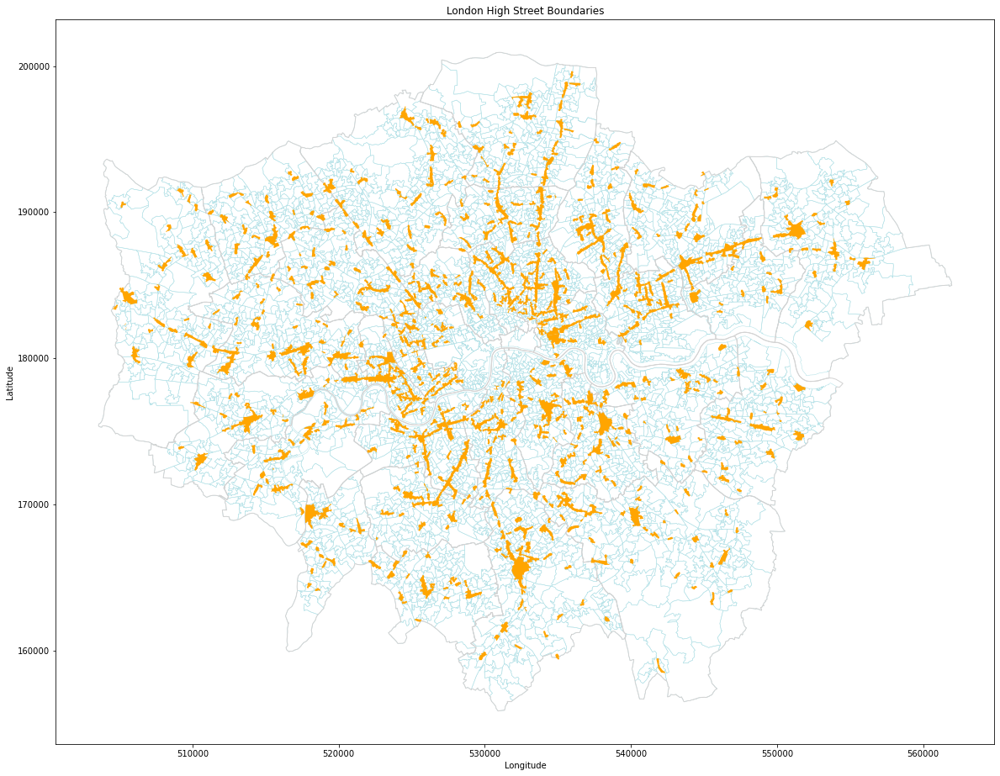

In [48]:
# plot and check
# plot and check
fig, ax = plt.subplots(figsize=(20, 20))

lsoa21.plot(ax=ax, facecolor='none', edgecolor='powderblue', linewidth=0.5)

borough.plot(ax=ax, facecolor='none', edgecolor='lightgrey')

high_street.plot(ax=ax, linewidth=0.5, color='orange')

ax.set_title('London High Street Boundaries')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

plt.show()

### Put all LSOAs level data in one dataframe

1. Filter out columns we needed for deprivation and occupation;
2. Integrate the columns of age data into the groups we need;
3. Filter out the house prices in London, then calculate the average house prices for each LSOA in 2011 and 2021 (calculating the quarters that are not 0);
4. Merge these data with the lsoa geography dataframe.

#### 1. Filter out columns we needed for deprivation and occupation

In [49]:
# select lsoas codes and names
deprivation = deprivation_changes.iloc[:, :4]

# calculate the deprived households
deprivation['deprivation'] = deprivation_changes['All Households'] - deprivation_changes['deprived in: no dimensions']
# check the df
deprivation.head()

,LSOA code,local authority name,local authority code,All Households,deprivation
0,E01000001,City of London,E09000001,-38,-100
1,E01000002,City of London,E09000001,-6,-57
2,E01000003,City of London,E09000001,198,-53
3,E01000005,City of London,E09000001,7,-49
4,E01032739,City of London,E09000001,205,-61


In [50]:
deprivation.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4994 entries, 0 to 4993
Data columns (total 5 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   LSOA code             4994 non-null   object
 1   local authority name  4994 non-null   object
 2   local authority code  4994 non-null   object
 3   All Households        4994 non-null   int64 
 4   deprivation           4994 non-null   int64 
dtypes: int64(2), object(3)
memory usage: 195.2+ KB


In [51]:
# Check for NaN values
nan_locations1 = deprivation.isna()
nan_rows1 = deprivation[nan_locations1.any(axis=1)]

print("Rows with NaN values:")
print(nan_rows1)

Rows with NaN values:
Empty DataFrame
Columns: [LSOA code, local authority name, local authority code, All Households, deprivation]
Index: []


In [52]:
# select lsoas codes and names
professions = occupation_changes_new.iloc[:, :4]

# calculate the proportions
professions['professions'] = occupation_changes_new.iloc[:, 4:7].sum(axis=1)

# check the df
professions.head()

,local authority code,local authority name,LSOA code,All usual residents aged 16 -74/16+ in employment,professions
0,E09000001,City of London,E01000001,-58.0,-37.0
1,E09000001,City of London,E01000002,-35.0,24.0
2,E09000001,City of London,E01000003,238.0,239.0
3,E09000001,City of London,E01000005,18.0,22.0
4,E09000001,City of London,E01032739,365.0,320.0


In [53]:
professions.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4994 entries, 0 to 4993
Data columns (total 5 columns):
 #   Column                                             Non-Null Count  Dtype  
---  ------                                             --------------  -----  
 0   local authority code                               4994 non-null   object 
 1   local authority name                               4994 non-null   object 
 2   LSOA code                                          4994 non-null   object 
 3   All usual residents aged 16 -74/16+ in employment  4994 non-null   float64
 4   professions                                        4994 non-null   float64
dtypes: float64(2), object(3)
memory usage: 195.2+ KB


In [54]:
# Check for NaN values
nan_locations2 = professions.isna()
nan_rows2 = professions[nan_locations2.any(axis=1)]

print("Rows with NaN values:")
print(nan_rows2)

Rows with NaN values:
Empty DataFrame
Columns: [local authority code, local authority name, LSOA code, All usual residents aged 16 -74/16+ in employment, professions]
Index: []


#### 2. Integrate the columns of age data into the groups we need

In [55]:
# select lsoas codes and names
age = age_changes.iloc[:, :4]

# divide into 5 groups
age['youth'] = age_changes.iloc[:, 4:8].sum(axis=1)
age['young_adults'] = age_changes.iloc[:, 8:11].sum(axis=1)
age['middle_aged_adults'] = age_changes.iloc[:, 11:14].sum(axis=1)
age['mature_adults'] = age_changes.iloc[:, 14:17].sum(axis=1)
age['seniors'] = age_changes.iloc[:, 17:22].sum(axis=1)

# check the df
age.head()

,LSOA code,local authority code,local authority name,All usual residents,youth,young_adults,middle_aged_adults,mature_adults,seniors
0,E01000001,E09000001,City of London,19,14,29,-7,-121,104
1,E01000002,E09000001,City of London,-54,-55,156,-114,-50,9
2,E01000003,E09000001,City of London,271,-40,92,33,153,33
3,E01000005,E09000001,City of London,113,19,33,0,84,-23
4,E01032739,E09000001,City of London,569,6,371,77,91,24


In [56]:
# Check for NaN values
nan_locations3 = age.isna()
nan_rows3 = age[nan_locations3.any(axis=1)]

print("Rows with NaN values:")
print(nan_rows3)

Rows with NaN values:
Empty DataFrame
Columns: [LSOA code, local authority code, local authority name, All usual residents, youth, young_adults, middle_aged_adults, mature_adults, seniors]
Index: []


#### 3. Filter out the house prices in London, then calculate the average house prices for each LSOA in 2011 and 2021 (calculating the quarters that are not 0)

In [57]:
# filter out the data only in London
houseprice_LD = houseprice[houseprice['LSOA code'].isin(lsoa21['LSOA21CD'])]
houseprice_LD.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4659 entries, 28009 to 32840
Columns: 113 entries, Local authority code to Year ending Dec 2022
dtypes: object(113)
memory usage: 4.1+ MB


In [58]:
# get the indexes for columns we need
year_ending_mar_2011_index = houseprice_LD.columns.get_loc('Year ending Mar 2011')
year_ending_dec_2011_index = houseprice_LD.columns.get_loc('Year ending Dec 2011')
year_ending_mar_2021_index = houseprice_LD.columns.get_loc('Year ending Mar 2021')
year_ending_dec_2021_index = houseprice_LD.columns.get_loc('Year ending Dec 2021')

print(year_ending_mar_2011_index, year_ending_dec_2011_index, year_ending_mar_2021_index, year_ending_dec_2021_index)

65 68 105 108


In [59]:
# Replace ":" with 0
houseprice_copy = houseprice_LD.copy()
houseprice_copy.replace(':', 0, inplace=True)

# first select lsoas codes, names and prices in 2011 and 2021
selcted_houseprice = houseprice_copy.iloc[:, list(range(4)) + list(range(65, 69)) + list(range(105, 109))]

# check the df
selcted_houseprice.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4659 entries, 28009 to 32840
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Local authority code  4659 non-null   object 
 1   Local authority name  4659 non-null   object 
 2   LSOA code             4659 non-null   object 
 3   LSOA name             4659 non-null   object 
 4   Year ending Mar 2011  4659 non-null   float64
 5   Year ending Jun 2011  4659 non-null   float64
 6   Year ending Sep 2011  4659 non-null   float64
 7   Year ending Dec 2011  4659 non-null   float64
 8   Year ending Mar 2021  4659 non-null   float64
 9   Year ending Jun 2021  4659 non-null   float64
 10  Year ending Sep 2021  4659 non-null   float64
 11  Year ending Dec 2021  4659 non-null   float64
dtypes: float64(8), object(4)
memory usage: 473.2+ KB


In [60]:
# dtype float64 shoule be int64
columns_to_convert = selcted_houseprice.columns[4:12]
selcted_houseprice.loc[:, columns_to_convert] = selcted_houseprice.loc[:, columns_to_convert].astype(int)

selcted_houseprice.head()

/tmp/ipykernel_4781/1399194943.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  selcted_houseprice.loc[:, columns_to_convert] = selcted_houseprice.loc[:, columns_to_convert].astype(int)


,Local authority code,Local authority name,LSOA code,LSOA name,Year ending Mar 2011,Year ending Jun 2011,Year ending Sep 2011,Year ending Dec 2011,Year ending Mar 2021,Year ending Jun 2021,Year ending Sep 2021,Year ending Dec 2021
28009,E09000001,City of London,E01000001,City of London 001A,497000,499000,518750,504999,800000,817500,820000,840000
28010,E09000001,City of London,E01000002,City of London 001B,528750,530000,500000,527500,808500,807500,822500,817500
28011,E09000001,City of London,E01000003,City of London 001C,335000,350000,431000,425150,639500,574250,545000,540000
28012,E09000001,City of London,E01000005,City of London 001E,300000,310000,305000,300000,0,0,0,0
28013,E09000001,City of London,E01032739,City of London 001F,402500,423000,423000,445000,722250,711000,652500,670000


In [61]:
# select lsoas codes and names
mean_houseprice = selcted_houseprice.iloc[:, :4]

# calculate the mean house price for each year in each lsoa
# Quarters with a value of zero are excluded
mean_houseprice['houseprice11'] = selcted_houseprice.iloc[:, 4:8][selcted_houseprice.iloc[:, 4:8] != 0].mean(axis=1).round(1)
mean_houseprice['houseprice21'] = selcted_houseprice.iloc[:, 8:12][selcted_houseprice.iloc[:, 8:12] != 0].mean(axis=1).round(1)

# change the column names to match other dataframes we get above
# mean_houseprice = mean_houseprice.rename(columns={'Local authority code': 'local authority code', 'Local authority name': 'local authority name'}, inplace=True)
mean_houseprice.columns = [col.lower() if i < 2 else col for i, col in enumerate(mean_houseprice.columns)]

# check the df
mean_houseprice.head()

,local authority code,local authority name,LSOA code,LSOA name,houseprice11,houseprice21
28009,E09000001,City of London,E01000001,City of London 001A,504937.2,819375.0
28010,E09000001,City of London,E01000002,City of London 001B,521562.5,814000.0
28011,E09000001,City of London,E01000003,City of London 001C,385287.5,574687.5
28012,E09000001,City of London,E01000005,City of London 001E,303750.0,NaN
28013,E09000001,City of London,E01032739,City of London 001F,423375.0,688937.5


In [62]:
mean_houseprice.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4659 entries, 28009 to 32840
Data columns (total 6 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   local authority code  4659 non-null   object 
 1   local authority name  4659 non-null   object 
 2   LSOA code             4659 non-null   object 
 3   LSOA name             4659 non-null   object 
 4   houseprice11          4545 non-null   float64
 5   houseprice21          4543 non-null   float64
dtypes: float64(2), object(4)
memory usage: 254.8+ KB


In [63]:
mean_houseprice_changes = mean_houseprice.iloc[:, :4]
mean_houseprice_changes['houseprice'] = mean_houseprice['houseprice21'] - mean_houseprice['houseprice11']
mean_houseprice_changes.head()

,local authority code,local authority name,LSOA code,LSOA name,houseprice
28009,E09000001,City of London,E01000001,City of London 001A,314437.8
28010,E09000001,City of London,E01000002,City of London 001B,292437.5
28011,E09000001,City of London,E01000003,City of London 001C,189400.0
28012,E09000001,City of London,E01000005,City of London 001E,NaN
28013,E09000001,City of London,E01032739,City of London 001F,265562.5


In [64]:
# Check if there are nan values, such as items with missing house price data for the whole year
rows_with_nan = mean_houseprice[mean_houseprice_changes.isna().any(axis=1)]
print(rows_with_nan)

      local authority code  local authority name  LSOA code  \
28012            E09000001        City of London  E01000005   
28016            E09000002  Barking and Dagenham  E01000007   
28056            E09000002  Barking and Dagenham  E01000049   
28058            E09000002  Barking and Dagenham  E01000051   
28068            E09000002  Barking and Dagenham  E01000061   
...                    ...                   ...        ...   
32738            E09000033           Westminster  E01004670   
32795            E09000033           Westminster  E01004732   
32817            E09000033           Westminster  E01004754   
32827            E09000033           Westminster  E01032513   
32839            E09000033           Westminster  E01033604   

                       LSOA name  houseprice11  houseprice21  
28012        City of London 001E      303750.0           NaN  
28016  Barking and Dagenham 015A           NaN      328750.0  
28056  Barking and Dagenham 021C      135000.0        

#### 4. Merge these data with the lsoa geography dataframe

In [65]:
merged_df1 = deprivation.merge(professions, on='LSOA code', how='outer', suffixes=('', '*'))
merged_df1 = merged_df1.filter(regex='^[^*]*$')

# change column order
merged_df1.insert(4, 'All usual residents aged 16 -74/16+ in employment', merged_df1.pop('All usual residents aged 16 -74/16+ in employment'))

merged_df1.head()

,LSOA code,local authority name,local authority code,All Households,All usual residents aged 16 -74/16+ in employment,deprivation,professions
0,E01000001,City of London,E09000001,-38,-58.0,-100,-37.0
1,E01000002,City of London,E09000001,-6,-35.0,-57,24.0
2,E01000003,City of London,E09000001,198,238.0,-53,239.0
3,E01000005,City of London,E09000001,7,18.0,-49,22.0
4,E01032739,City of London,E09000001,205,365.0,-61,320.0


In [66]:
merged_df1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4994 entries, 0 to 4993
Data columns (total 7 columns):
 #   Column                                             Non-Null Count  Dtype  
---  ------                                             --------------  -----  
 0   LSOA code                                          4994 non-null   object 
 1   local authority name                               4994 non-null   object 
 2   local authority code                               4994 non-null   object 
 3   All Households                                     4994 non-null   int64  
 4   All usual residents aged 16 -74/16+ in employment  4994 non-null   float64
 5   deprivation                                        4994 non-null   int64  
 6   professions                                        4994 non-null   float64
dtypes: float64(2), int64(2), object(3)
memory usage: 312.1+ KB


In [67]:
merged_df2 = merged_df1.merge(age, on='LSOA code', how='outer', suffixes=('', '*'))
merged_df2 = merged_df2.filter(regex='^[^*]*$')

# change column order
merged_df2.insert(4, 'All usual residents', merged_df2.pop('All usual residents'))

merged_df3 = pd.merge(merged_df2, mean_houseprice_changes, on='LSOA code', how='left', suffixes=('', '*')) # to select the houseprices of London only
merged_df3 = merged_df3.filter(regex='^[^*]*$')

merged_df3 = merged_df3.drop(columns=['LSOA name'])

merged_df3.head()

,LSOA code,local authority name,local authority code,All Households,All usual residents,All usual residents aged 16 -74/16+ in employment,deprivation,professions,youth,young_adults,middle_aged_adults,mature_adults,seniors,houseprice
0,E01000001,City of London,E09000001,-38,19,-58.0,-100,-37.0,14,29,-7,-121,104,314437.8
1,E01000002,City of London,E09000001,-6,-54,-35.0,-57,24.0,-55,156,-114,-50,9,292437.5
2,E01000003,City of London,E09000001,198,271,238.0,-53,239.0,-40,92,33,153,33,189400.0
3,E01000005,City of London,E09000001,7,113,18.0,-49,22.0,19,33,0,84,-23,NaN
4,E01032739,City of London,E09000001,205,569,365.0,-61,320.0,6,371,77,91,24,265562.5


In [68]:
# change the column names to match the ones of 'lsoa' dataframe
merged_df3 = merged_df3.rename(columns={'LSOA code': 'LSOA21CD'})
merged_df3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4994 entries, 0 to 4993
Data columns (total 14 columns):
 #   Column                                             Non-Null Count  Dtype  
---  ------                                             --------------  -----  
 0   LSOA21CD                                           4994 non-null   object 
 1   local authority name                               4994 non-null   object 
 2   local authority code                               4994 non-null   object 
 3   All Households                                     4994 non-null   int64  
 4   All usual residents                                4994 non-null   int64  
 5   All usual residents aged 16 -74/16+ in employment  4994 non-null   float64
 6   deprivation                                        4994 non-null   int64  
 7   professions                                        4994 non-null   float64
 8   youth                                              4994 non-null   int64  
 9   young_ad

In [69]:
lsoa_merged = pd.merge(merged_df3, lsoa21_new, on='LSOA21CD', how='left')

# adjust the column order
lsoa_merged.insert(1, 'LSOA21NM', lsoa_merged.pop('LSOA21NM'))

lsoa_merged.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4994 entries, 0 to 4993
Data columns (total 16 columns):
 #   Column                                             Non-Null Count  Dtype   
---  ------                                             --------------  -----   
 0   LSOA21CD                                           4994 non-null   object  
 1   LSOA21NM                                           4994 non-null   object  
 2   local authority name                               4994 non-null   object  
 3   local authority code                               4994 non-null   object  
 4   All Households                                     4994 non-null   int64   
 5   All usual residents                                4994 non-null   int64   
 6   All usual residents aged 16 -74/16+ in employment  4994 non-null   float64 
 7   deprivation                                        4994 non-null   int64   
 8   professions                                        4994 non-null   float64 
 9

In [70]:
# convert df to gdf
gdf_lsoa_merged = gpd.GeoDataFrame(lsoa_merged, geometry='geometry', crs='EPSG:27700')

gdf_lsoa_merged.crs

<Derived Projected CRS: EPSG:27700>
Name: OSGB36 / British National Grid
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: United Kingdom (UK) - offshore to boundary of UKCS within 49°45'N to 61°N and 9°W to 2°E; onshore Great Britain (England, Wales and Scotland). Isle of Man onshore.
- bounds: (-9.0, 49.75, 2.01, 61.01)
Coordinate Operation:
- name: British National Grid
- method: Transverse Mercator
Datum: Ordnance Survey of Great Britain 1936
- Ellipsoid: Airy 1830
- Prime Meridian: Greenwich

In [71]:
gdf_lsoa_merged.head()

,LSOA21CD,LSOA21NM,local authority name,local authority code,All Households,All usual residents,All usual residents aged 16 -74/16+ in employment,deprivation,professions,youth,young_adults,middle_aged_adults,mature_adults,seniors,houseprice,geometry
0,E01000001,City of London 001A,City of London,E09000001,-38,19,-58.0,-100,-37.0,14,29,-7,-121,104,314437.8,"POLYGON ((532105.312 182010.574, 532162.491 18..."
1,E01000002,City of London 001B,City of London,E09000001,-6,-54,-35.0,-57,24.0,-55,156,-114,-50,9,292437.5,"POLYGON ((532634.497 181926.016, 532619.141 18..."
2,E01000003,City of London 001C,City of London,E09000001,198,271,238.0,-53,239.0,-40,92,33,153,33,189400.0,"POLYGON ((532135.138 182198.131, 532158.250 18..."
3,E01000005,City of London 001E,City of London,E09000001,7,113,18.0,-49,22.0,19,33,0,84,-23,NaN,"POLYGON ((533808.018 180767.774, 533649.037 18..."
4,E01032739,City of London 001F,City of London,E09000001,205,569,365.0,-61,320.0,6,371,77,91,24,265562.5,"POLYGON ((533410.692 182037.874, 533352.014 18..."


In [72]:
gdf_lsoa_merged.tail()

,LSOA21CD,LSOA21NM,local authority name,local authority code,All Households,All usual residents,All usual residents aged 16 -74/16+ in employment,deprivation,professions,youth,young_adults,middle_aged_adults,mature_adults,seniors,houseprice,geometry
4989,E01035718,Westminster 019G,Westminster,E09000033,-264,-557,-251.0,-130,-152.0,-154,-261,-107,-6,-29,NaN,"POLYGON ((528427.719 180115.109, 528410.126 17..."
4990,E01035719,Westminster 021F,Westminster,E09000033,63,271,96.0,-30,65.0,93,113,47,55,-37,NaN,"POLYGON ((530276.465 178962.701, 530238.780 17..."
4991,E01035720,Westminster 021G,Westminster,E09000033,30,111,54.0,-21,1.0,0,90,-42,50,13,NaN,"POLYGON ((529867.785 178609.306, 529892.537 17..."
4992,E01035721,Westminster 023H,Westminster,E09000033,-175,-380,-335.0,-297,-104.0,-47,-200,-63,32,-102,NaN,"POLYGON ((528674.775 178693.078, 528612.868 17..."
4993,E01035722,Westminster 024G,Westminster,E09000033,-491,-676,-557.0,-379,-418.0,-32,-272,-244,-52,-76,NaN,"POLYGON ((529651.808 178210.675, 529692.695 17..."


##### plot to check

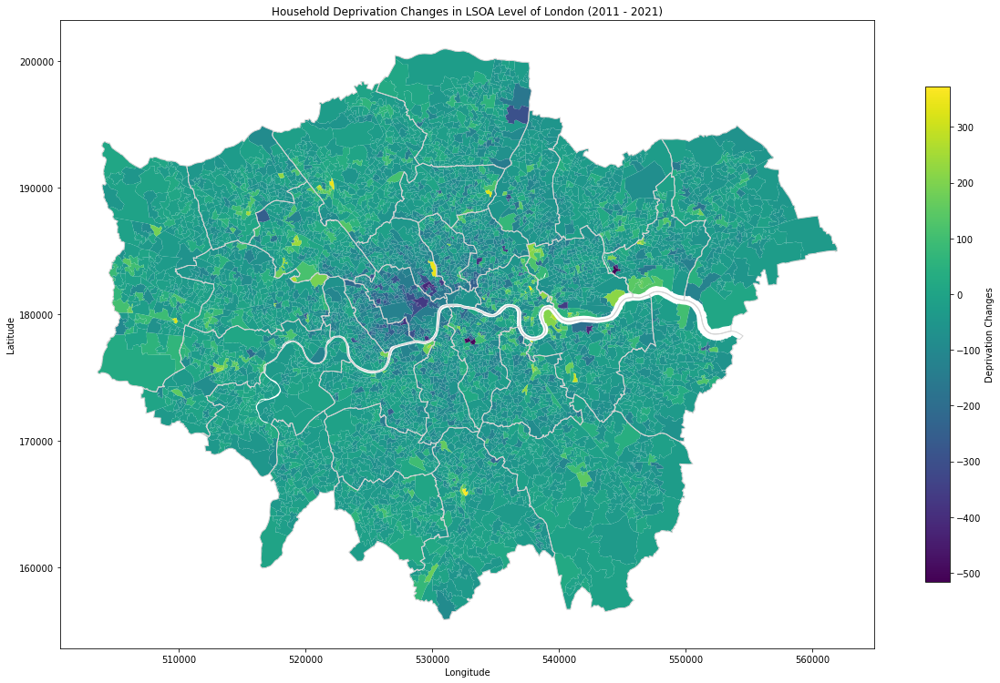

In [73]:
# plot and check
fig, ax = plt.subplots(figsize=(20, 20))

gdf_lsoa_merged.plot(ax=ax, column='deprivation',  cmap='viridis', legend=True, legend_kwds = {'label':'Deprivation Changes','shrink': 0.5})

borough.plot(ax=ax, facecolor='none', edgecolor='lightgray', linewidth=1)

ax.set_title('Household Deprivation Changes in LSOA Level of London (2011 - 2021)')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')


plt.show()

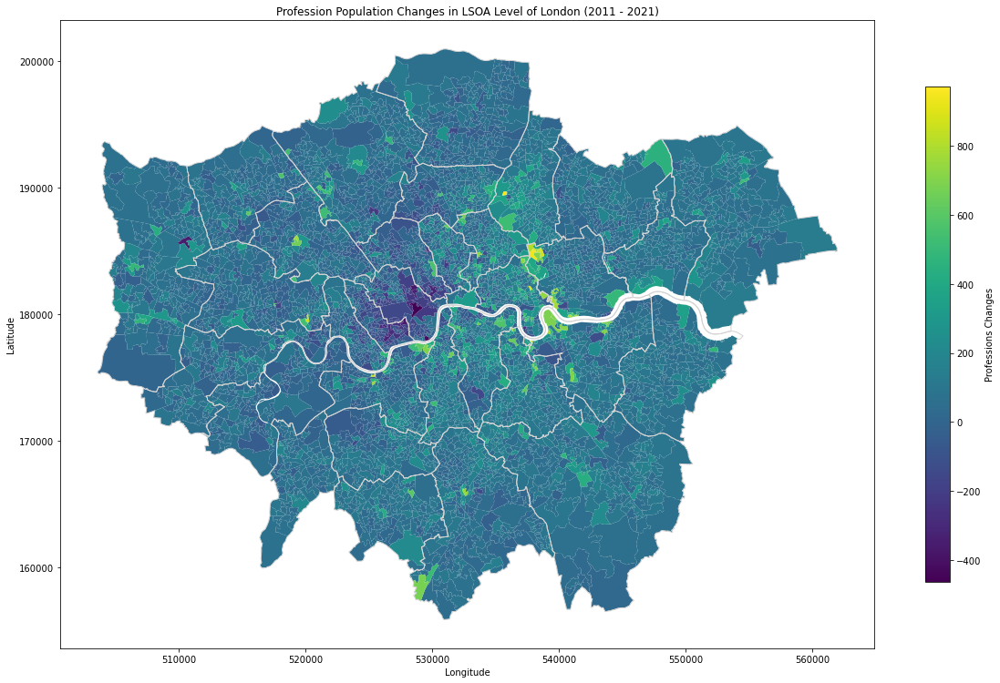

In [74]:
# plot and check
fig, ax = plt.subplots(figsize=(20, 20))

gdf_lsoa_merged.plot(ax=ax, column='professions',  cmap='viridis', legend=True, legend_kwds = {'label':'Professions Changes','shrink': 0.5})

borough.plot(ax=ax, facecolor='none', edgecolor='lightgray', linewidth=1)

ax.set_title('Profession Population Changes in LSOA Level of London (2011 - 2021)')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')


plt.show()

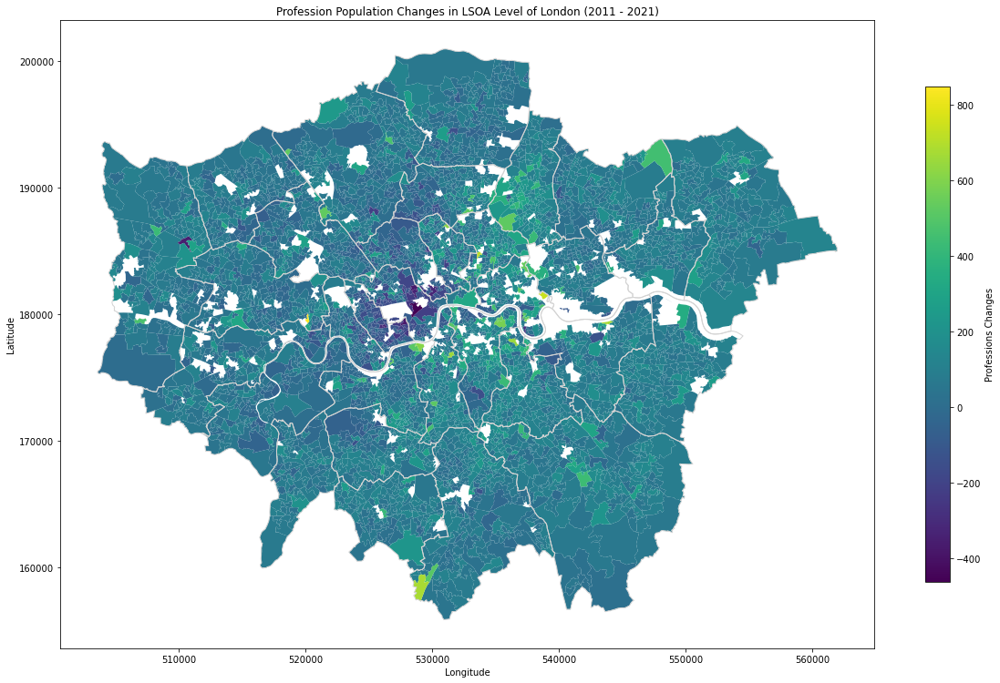

In [75]:
# plot and check
fig, ax = plt.subplots(figsize=(20, 20))

gdf_lsoa_merged_copy = gdf_lsoa_merged.copy()
gdf_lsoa_merged_copy.dropna(subset=['houseprice']).plot(ax=ax, column='professions',  cmap='viridis', legend=True, legend_kwds = {'label':'Professions Changes','shrink': 0.5})

borough.plot(ax=ax, facecolor='none', edgecolor='lightgray', linewidth=1)

ax.set_title('Profession Population Changes in LSOA Level of London (2011 - 2021)')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')


plt.show()

### Filter out the high streets and lsoas of the borough we studied, and the same for the control group

1. Waltham Forest;

2. Bexley.

#### 1. Waltham Forest

In [76]:
# join the hs boundary with selected borough
wf_highstreet = gpd.sjoin(high_street, borough[borough['name'].str.contains('Waltham Forest')], predicate='within')

# select columns we need and rename them
wf_highstreet = wf_highstreet[['highstreet_id', 'highstreet_name', 'area_ha', 'gdb_geomattr_data', 'name', 'gss_code', 'geometry']]
wf_highstreet = wf_highstreet.rename(columns={'gss_code': 'LAD11CD', 'name': 'BoroughNM'})

wf_highstreet.head()

,highstreet_id,highstreet_name,area_ha,gdb_geomattr_data,BoroughNM,LAD11CD,geometry
242,237,"Billet Road, Walthamstow.",4.395863,None,Waltham Forest,E09000031,"POLYGON ((536538.954 190900.525, 536542.912 19..."
250,244,"Forest Road (Pembar Avenue), Blackhorse Road",5.781402,None,Waltham Forest,E09000031,"POLYGON ((536387.113 189539.524, 536388.069 18..."
255,249,"Burnside Avenue, Walthamstow.",7.221877,None,Waltham Forest,E09000031,"POLYGON ((537128.872 191807.945, 537130.364 19..."
256,250,"Chingford Mount Road, Walthamstow.",9.698066,None,Waltham Forest,E09000031,"POLYGON ((537509.991 191894.780, 537509.035 19..."
258,252,"Old Church Road, Chingford.",13.973184,None,Waltham Forest,E09000031,"POLYGON ((537451.583 192633.269, 537451.715 19..."


In [77]:
wf_lsoa = gdf_lsoa_merged[gdf_lsoa_merged['LSOA21NM'].str.contains('Waltham Forest')]

wf_lsoa.head()

,LSOA21CD,LSOA21NM,local authority name,local authority code,All Households,All usual residents,All usual residents aged 16 -74/16+ in employment,deprivation,professions,youth,young_adults,middle_aged_adults,mature_adults,seniors,houseprice,geometry
4539,E01004327,Waltham Forest 028A,Waltham Forest,E09000031,6,287,144.0,-43,136.0,140,-68,125,94,-4,297812.5,"POLYGON ((539738.262 186535.091, 539762.948 18..."
4540,E01004328,Waltham Forest 028B,Waltham Forest,E09000031,-13,26,39.0,-65,106.0,32,-226,119,70,31,317144.8,"POLYGON ((539425.622 186339.169, 539416.149 18..."
4541,E01004329,Waltham Forest 028C,Waltham Forest,E09000031,-32,-116,83.0,-107,138.0,-56,-210,53,64,33,313750.0,"POLYGON ((539906.047 186314.947, 539940.976 18..."
4542,E01004330,Waltham Forest 028D,Waltham Forest,E09000031,-17,-154,-3.0,-77,147.0,-63,-248,91,31,35,332356.2,"POLYGON ((539455.978 186230.423, 539496.056 18..."
4543,E01004331,Waltham Forest 028E,Waltham Forest,E09000031,-72,-196,3.0,-133,132.0,-64,-194,29,11,22,312150.0,"POLYGON ((540216.570 185919.303, 540149.151 18..."


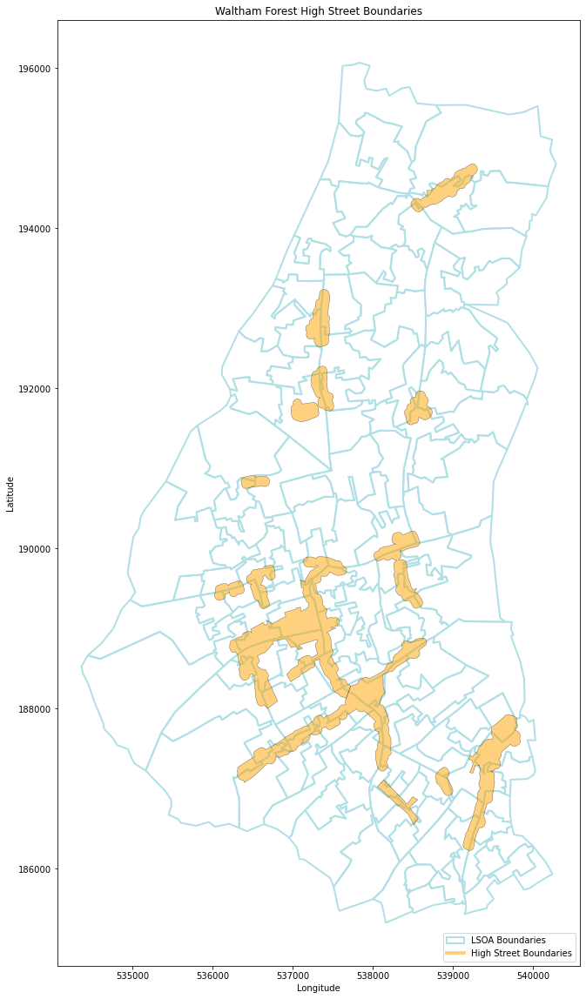

In [78]:
# plot and check
fig, ax = plt.subplots(figsize=(20, 20))

wf_lsoa.plot(ax=ax, facecolor='none', edgecolor='powderblue', linewidth=2)
wf_highstreet.plot(ax=ax, linewidth=0.5, facecolor='orange', edgecolor = 'black', alpha=0.5)

ax.set_title('Waltham Forest High Street Boundaries')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# create legend
lsoa_patch = mpatches.Patch(facecolor='none', edgecolor='powderblue', linewidth=2, label='LSOA Boundaries')
highstreet_line = mlines.Line2D([], [], color='orange', linewidth=4, alpha=0.5, label='High Street Boundaries')

# add legend
ax.legend(handles=[lsoa_patch, highstreet_line], loc='lower right', bbox_to_anchor=(1, 0))

plt.show()

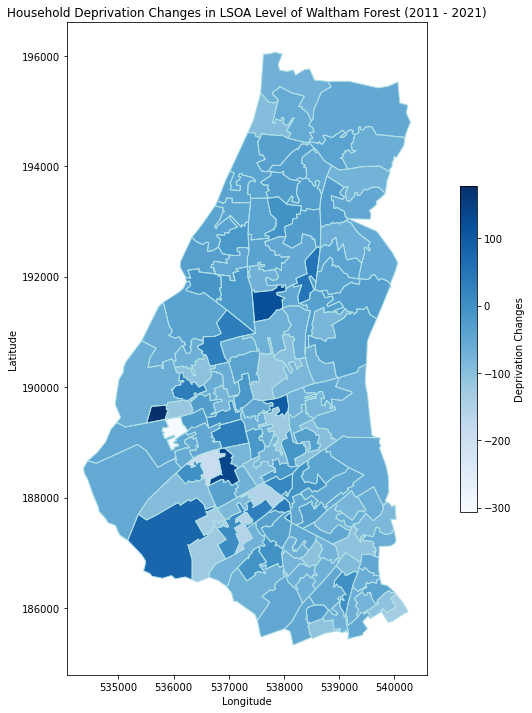

In [79]:
# plot and check
fig, ax = plt.subplots(figsize=(12, 12))

wf_lsoa.plot(ax=ax, column='deprivation',  cmap='Blues', legend=True, legend_kwds = {'label':'Deprivation Changes','shrink': 0.5})

wf_lsoa.plot(ax=ax, facecolor='none', edgecolor='powderblue', linewidth=1)

ax.set_title('Household Deprivation Changes in LSOA Level of Waltham Forest (2011 - 2021)')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')


plt.show()

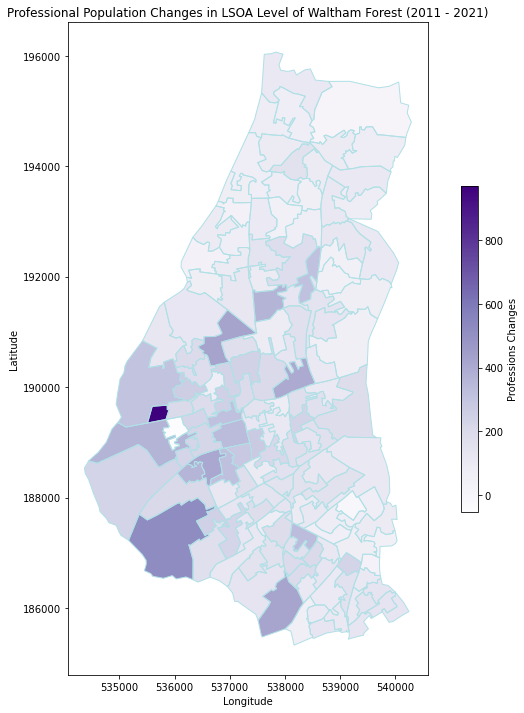

In [80]:
# plot and check
fig, ax = plt.subplots(figsize=(12, 12))

wf_lsoa.plot(ax=ax, column='professions',  cmap='Purples', legend=True, legend_kwds = {'label':'Professions Changes','shrink': 0.5})

wf_lsoa.plot(ax=ax, facecolor='none', edgecolor='powderblue', linewidth=1)

ax.set_title('Professional Population Changes in LSOA Level of Waltham Forest (2011 - 2021)')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')


plt.show()

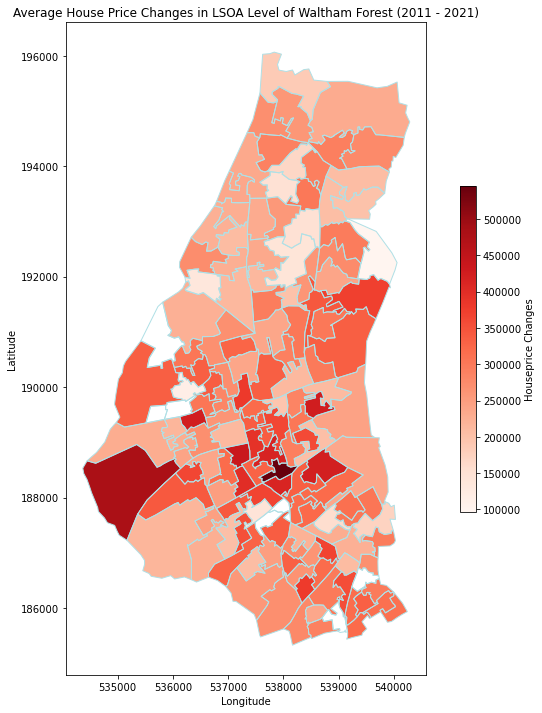

In [81]:
# plot and check
fig, ax = plt.subplots(figsize=(12, 12))

wf_lsoa.plot(ax=ax, column='houseprice',  cmap='Reds', legend=True, legend_kwds = {'label':'Houseprice Changes','shrink': 0.5})

wf_lsoa.plot(ax=ax, facecolor='none', edgecolor='powderblue', linewidth=1)

ax.set_title('Average House Price Changes in LSOA Level of Waltham Forest (2011 - 2021)')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')


plt.show()

In [82]:
wf_lsoa.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 146 entries, 4539 to 4684
Data columns (total 16 columns):
 #   Column                                             Non-Null Count  Dtype   
---  ------                                             --------------  -----   
 0   LSOA21CD                                           146 non-null    object  
 1   LSOA21NM                                           146 non-null    object  
 2   local authority name                               146 non-null    object  
 3   local authority code                               146 non-null    object  
 4   All Households                                     146 non-null    int64   
 5   All usual residents                                146 non-null    int64   
 6   All usual residents aged 16 -74/16+ in employment  146 non-null    float64 
 7   deprivation                                        146 non-null    int64   
 8   professions                                        146 non-null    f

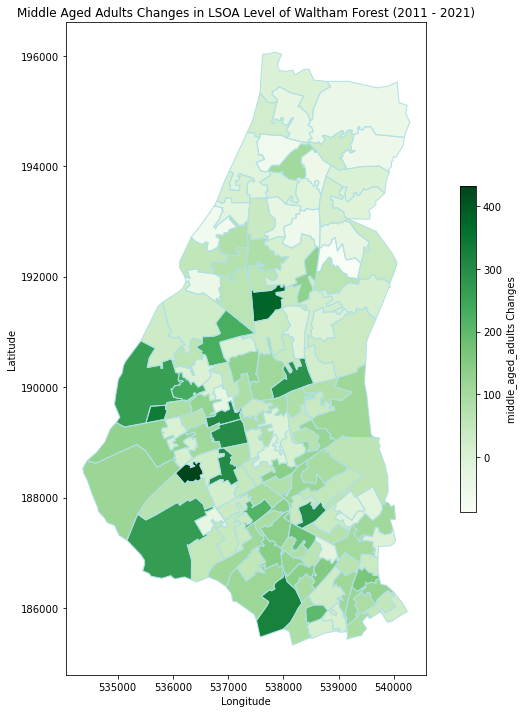

In [83]:
# plot and check
fig, ax = plt.subplots(figsize=(12, 12))

wf_lsoa.plot(ax=ax, column='middle_aged_adults',  cmap='Greens', legend=True, legend_kwds = {'label':'middle_aged_adults Changes','shrink': 0.5})

wf_lsoa.plot(ax=ax, facecolor='none', edgecolor='powderblue', linewidth=1)

ax.set_title('Middle Aged Adults Changes in LSOA Level of Waltham Forest (2011 - 2021)')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')


plt.show()

#### 2. Bexley

In [84]:
# join the hs boundary with selected borough
bx_highstreet = gpd.sjoin(high_street, borough[borough['name'].str.contains('Bexley')], predicate='within')

# select columns we need and rename them
bx_highstreet = bx_highstreet[['highstreet_id', 'highstreet_name', 'area_ha', 'gdb_geomattr_data', 'name', 'gss_code', 'geometry']]
bx_highstreet = bx_highstreet.rename(columns={'gss_code': 'LAD11CD', 'name': 'BoroughNM'})

bx_highstreet.head()

,highstreet_id,highstreet_name,area_ha,gdb_geomattr_data,BoroughNM,LAD11CD,geometry
170,167,"Blackfen Road, Bexley.",12.499476,None,Bexley,E09000004,"POLYGON ((546255.173 174690.145, 546260.269 17..."
187,183,"Nuxley Road, Belvedere.",11.423147,None,Bexley,E09000004,"POLYGON ((549173.034 178330.293, 549179.078 17..."
201,196,"Barnehurst Road, Bexleyheath",3.121981,None,Bexley,E09000004,"POLYGON ((550131.714 176149.598, 550012.651 17..."
202,197,"Midfield Parade, Bexleyheath",1.762517,None,Bexley,E09000004,"POLYGON ((550325.150 175717.301, 550295.143 17..."
203,198,"Long Lane & Heversham Road, Bexleyheath",2.098182,None,Bexley,E09000004,"POLYGON ((549149.283 176364.842, 549309.175 17..."


In [85]:
bx_lsoa = gdf_lsoa_merged[gdf_lsoa_merged['LSOA21NM'].str.contains('Bexley')]

bx_lsoa.head()

,LSOA21CD,LSOA21NM,local authority name,local authority code,All Households,All usual residents,All usual residents aged 16 -74/16+ in employment,deprivation,professions,youth,young_adults,middle_aged_adults,mature_adults,seniors,houseprice,geometry
341,E01000325,Bexley 014A,Bexley,E09000004,3,37,-38.0,-47,76.0,-22,20,-36,17,58,237813.2,"POLYGON ((550629.000 176094.000, 550592.211 17..."
342,E01000326,Bexley 014B,Bexley,E09000004,-2,88,-21.0,-9,43.0,40,-12,23,8,29,130375.0,"POLYGON ((551015.037 176171.116, 551171.130 17..."
343,E01000327,Bexley 017A,Bexley,E09000004,23,77,1.0,-29,89.0,12,-19,-11,48,47,252121.8,"POLYGON ((550023.469 176217.762, 550092.000 17..."
344,E01000328,Bexley 017B,Bexley,E09000004,15,159,20.0,-15,81.0,50,28,-6,-9,96,166500.0,"POLYGON ((551013.274 175920.581, 551392.937 17..."
345,E01000329,Bexley 017C,Bexley,E09000004,142,377,176.0,11,146.0,128,80,65,86,18,177525.0,"POLYGON ((549936.495 175514.089, 549930.620 17..."


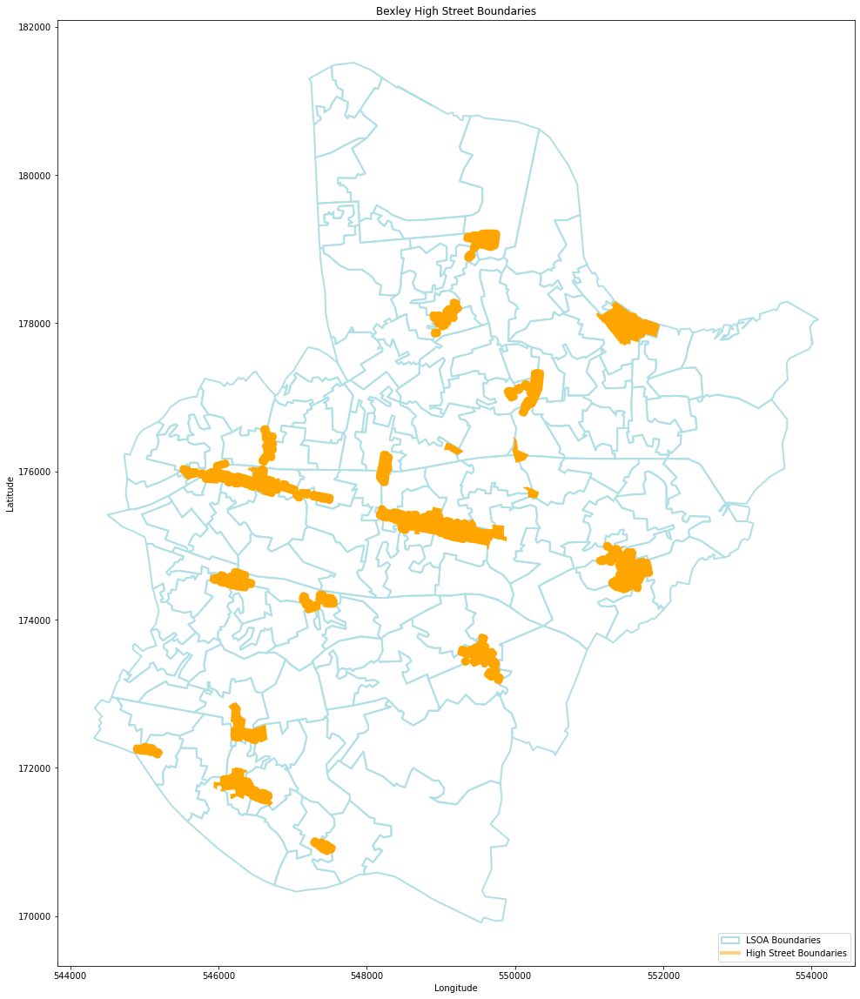

In [86]:
# plot and check
fig, ax = plt.subplots(figsize=(20, 20))

bx_lsoa.plot(ax=ax, facecolor='none', edgecolor='powderblue', linewidth=2)
bx_highstreet.plot(ax=ax, linewidth=0.5, color='orange')

ax.set_title('Bexley High Street Boundaries')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# create legend
# lsoa_patch = mpatches.Patch(facecolor='none', edgecolor='powderblue', linewidth=2, label='LSOA Boundaries')
# highstreet_line = mlines.Line2D([], [], color='orange', linewidth=4, label='High Street Boundaries')

# add legend
ax.legend(handles=[lsoa_patch, highstreet_line], loc='lower right', bbox_to_anchor=(1, 0))

plt.show()

### Add geographic information to openlocal data, and filter data for Waltham Forest

1. Match openlocal's postcode with ons postcode dictionary;

2. Get the composition of category (overview).

#### check the files first

In [87]:
openlocal11_wf.head()

,rates_code,rates_authority_id,rates_authority,region,location_code,address_no,address_street,address_town,pc__pcs,use_category,...,valuation_date,revaluation_year,period,rates_expected,name,rates_paid,status,status_date,status_duration,ratepayers_published
0,00000000510140,E09000031,Waltham Forest,Outer London - East and North East,8745032000,14,LEYTON GRANGE ESTATE,LONDON,E10 5HN,Offices (Inc Computer Centres),...,2010-04-29 00:00:00+00:00,2010,2011-03,1221.00,NaN,NaN,True,2010-04-29,NaN,True
1,00000001023335,E09000031,Waltham Forest,Outer London - East and North East,2977620000,UNIT 5 THE FOREST BUSINESS PARK,ARGALL AVENUE,LONDON,E10 7FB,"Factories, Workshops and Warehouses (Incl Bake...",...,2010-04-01 00:00:00+00:00,2010,2011-03,11599.50,NaN,NaN,True,2010-04-01,NaN,True
2,0000000102334A,E09000031,Waltham Forest,Outer London - East and North East,2976536000,UNIT 6 THE FOREST BUSINESS PARK,ARGALL AVENUE,LONDON,E10 7FB,"Factories, Workshops and Warehouses (Incl Bake...",...,2010-04-01 00:00:00+00:00,2010,2011-03,11904.75,CAPITAL TSHIRTS LIMITED,14607.25,True,1997-05-01,5083.0,True
3,00000001023354,E09000031,Waltham Forest,Outer London - East and North East,2975207000,UNIT 7 THE FOREST BUSINESS PARK,ARGALL AVENUE,LONDON,E10 7FB,"Factories, Workshops and Warehouses (Incl Bake...",...,2010-04-01 00:00:00+00:00,2010,2011-03,10683.75,NaN,NaN,True,2010-04-01,NaN,True
4,00000001023369,E09000031,Waltham Forest,Outer London - East and North East,2975617000,UNIT 8 THE FOREST BUSINESS PARK,ARGALL AVENUE,LONDON,E10 7FB,"Factories, Workshops and Warehouses (Incl Bake...",...,2010-04-01 00:00:00+00:00,2010,2011-03,10887.25,THE TEXTILE CENTRE LTD,13257.00,True,2007-09-12,1297.0,True


In [88]:
openlocal11_wf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4582 entries, 0 to 4581
Data columns (total 25 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   rates_code            4582 non-null   object 
 1   rates_authority_id    4582 non-null   object 
 2   rates_authority       4582 non-null   object 
 3   region                4582 non-null   object 
 4   location_code         4582 non-null   int64  
 5   address_no            4582 non-null   object 
 6   address_street        4546 non-null   object 
 7   address_town          4582 non-null   object 
 8   pc__pcs               4582 non-null   object 
 9   use_category          4582 non-null   object 
 10  scat_code             4582 non-null   int64  
 11  sub_category          4582 non-null   object 
 12  category              4283 non-null   object 
 13  floor_area            4582 non-null   float64
 14  rental_valuation      4582 non-null   float64
 15  valuation_date       

In [89]:
# some dtypes need to be changed

# scat_code, location_code should be object not numbers
openlocal11_wf['scat_code'] = openlocal11_wf['scat_code'].astype('object')
openlocal11_wf['location_code'] = openlocal11_wf['location_code'].astype('object')

# Convert object dtype to datetime type
openlocal11_wf['status_date'] = pd.to_datetime(openlocal11_wf['status_date'])
openlocal11_wf['period'] = pd.to_datetime(openlocal11_wf['period'])

openlocal11_wf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4582 entries, 0 to 4581
Data columns (total 25 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   rates_code            4582 non-null   object        
 1   rates_authority_id    4582 non-null   object        
 2   rates_authority       4582 non-null   object        
 3   region                4582 non-null   object        
 4   location_code         4582 non-null   object        
 5   address_no            4582 non-null   object        
 6   address_street        4546 non-null   object        
 7   address_town          4582 non-null   object        
 8   pc__pcs               4582 non-null   object        
 9   use_category          4582 non-null   object        
 10  scat_code             4582 non-null   object        
 11  sub_category          4582 non-null   object        
 12  category              4283 non-null   object        
 13  floor_area        

In [90]:
openlocal21_wf.head()

,rates_code,rates_authority_id,rates_authority,region,location_code,address_no,address_street,address_town,pc__pcs,use_category,...,valuation_date,revaluation_year,period,rates_expected,name,rates_paid,status,status_date,status_duration,ratepayers_published
0,0000000022016166,E09000031,Waltham Forest,Outer London - East and North East,11244514000,BUXTON SCHOOL,CANN HALL ROAD,LONDON,E11 3NN,Local Authority Schools (National Scheme),...,2017-12-20 00:00:00+00:00,2017,2021-03,212480.00,NaN,NaN,True,2017-12-20,NaN,True
1,00000000510140,E09000031,Waltham Forest,Outer London - East and North East,8745032000,14,LEYTON GRANGE ESTATE,LONDON,E10 5HN,Offices (Inc Computer Centres),...,2017-04-01 00:00:00+00:00,2017,2021-03,2195.60,NaN,NaN,True,2017-04-01,NaN,True
2,0000000101,E09000031,Waltham Forest,Outer London - East and North East,12549805000,SUITE 101 GND FLR OCEANAIR HOUSE 750-760,HIGH ROAD LEYTONSTONE,LONDON,E11 3AW,Offices (Inc Computer Centres),...,2019-04-01 00:00:00+00:00,2017,2021-03,3243.50,NaN,NaN,True,2019-04-01,NaN,True
3,0000000102,E09000031,Waltham Forest,Outer London - East and North East,12549819000,SUITE 102 GND FLR OCEANAIR HSE 750-760,HIGH ROAD LEYTONSTONE,LONDON,E11 3AW,Offices (Inc Computer Centres),...,2019-04-01 00:00:00+00:00,2017,2021-03,2070.85,NaN,NaN,True,2019-04-01,NaN,True
4,00000001023335,E09000031,Waltham Forest,Outer London - East and North East,2977620000,UNIT 5 THE FOREST BUSINESS PARK,ARGALL AVENUE,LONDON,E10 7FB,"Factories, Workshops and Warehouses (Incl Bake...",...,2017-04-01 00:00:00+00:00,2017,2021-03,14471.00,NaN,NaN,True,2017-04-01,NaN,True


In [91]:
openlocal21_wf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6968 entries, 0 to 6967
Data columns (total 25 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   rates_code            6968 non-null   object 
 1   rates_authority_id    6968 non-null   object 
 2   rates_authority       6968 non-null   object 
 3   region                6968 non-null   object 
 4   location_code         6968 non-null   int64  
 5   address_no            6968 non-null   object 
 6   address_street        6922 non-null   object 
 7   address_town          6968 non-null   object 
 8   pc__pcs               6968 non-null   object 
 9   use_category          6968 non-null   object 
 10  scat_code             6968 non-null   int64  
 11  sub_category          6968 non-null   object 
 12  category              6282 non-null   object 
 13  floor_area            6968 non-null   float64
 14  rental_valuation      6968 non-null   float64
 15  valuation_date       

In [92]:
# some dtypes need to be changed

# scat_code, location_code should be object not numbers
openlocal21_wf['scat_code'] = openlocal21_wf['scat_code'].astype('object')
openlocal21_wf['location_code'] = openlocal21_wf['location_code'].astype('object')

# Convert object dtype to datetime type
openlocal21_wf['status_date'] = pd.to_datetime(openlocal21_wf['status_date'])
openlocal21_wf['period'] = pd.to_datetime(openlocal21_wf['period'])

openlocal21_wf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6968 entries, 0 to 6967
Data columns (total 25 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   rates_code            6968 non-null   object        
 1   rates_authority_id    6968 non-null   object        
 2   rates_authority       6968 non-null   object        
 3   region                6968 non-null   object        
 4   location_code         6968 non-null   object        
 5   address_no            6968 non-null   object        
 6   address_street        6922 non-null   object        
 7   address_town          6968 non-null   object        
 8   pc__pcs               6968 non-null   object        
 9   use_category          6968 non-null   object        
 10  scat_code             6968 non-null   object        
 11  sub_category          6968 non-null   object        
 12  category              6282 non-null   object        
 13  floor_area        

***Datatypes of 'period' and 'status_date' need to be converted to datetime for duration calculation later***

In [93]:
onspd.head()

,pcd,pcd2,pcds,dointr,doterm,oscty,ced,oslaua,osward,parish,...,long,lep1,lep2,pfa,imd,calncv,icb,oa21,lsoa21,msoa21
0,AB1 0AA,AB1 0AA,AB1 0AA,198001,199606.0,S99999999,S99999999,S12000033,S13002843,S99999999,...,-2.242851,S99999999,NaN,S23000009,6715,S99999999,S99999999,NaN,NaN,NaN
1,AB1 0AB,AB1 0AB,AB1 0AB,198001,199606.0,S99999999,S99999999,S12000033,S13002843,S99999999,...,-2.246308,S99999999,NaN,S23000009,6715,S99999999,S99999999,NaN,NaN,NaN
2,AB1 0AD,AB1 0AD,AB1 0AD,198001,199606.0,S99999999,S99999999,S12000033,S13002843,S99999999,...,-2.248342,S99999999,NaN,S23000009,6715,S99999999,S99999999,NaN,NaN,NaN
3,AB1 0AE,AB1 0AE,AB1 0AE,199402,199606.0,S99999999,S99999999,S12000034,S13002864,S99999999,...,-2.255708,S99999999,NaN,S23000009,5069,S99999999,S99999999,NaN,NaN,NaN
4,AB1 0AF,AB1 0AF,AB1 0AF,199012,199207.0,S99999999,S99999999,S12000033,S13002843,S99999999,...,-2.258102,S99999999,NaN,S23000009,6253,S99999999,S99999999,NaN,NaN,NaN


In [94]:
onspd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2690851 entries, 0 to 2690850
Data columns (total 53 columns):
 #   Column     Dtype  
---  ------     -----  
 0   pcd        object 
 1   pcd2       object 
 2   pcds       object 
 3   dointr     int64  
 4   doterm     float64
 5   oscty      object 
 6   ced        object 
 7   oslaua     object 
 8   osward     object 
 9   parish     object 
 10  usertype   int64  
 11  oseast1m   float64
 12  osnrth1m   float64
 13  osgrdind   int64  
 14  oshlthau   object 
 15  nhser      object 
 16  ctry       object 
 17  rgn        object 
 18  streg      object 
 19  pcon       object 
 20  eer        object 
 21  teclec     object 
 22  ttwa       object 
 23  pct        object 
 24  itl        object 
 25  statsward  object 
 26  oa01       object 
 27  casward    object 
 28  park       object 
 29  lsoa01     object 
 30  msoa01     object 
 31  ur01ind    object 
 32  oac01      object 
 33  oa11       object 
 34  lsoa11     object 

#### 1. Match openlocal's postcode with ons postcode dictionary

In [95]:
onspd_selected = onspd[['pcds', 'lat', 'long']]

onspd_selected.head()

,pcds,lat,long
0,AB1 0AA,57.101474,-2.242851
1,AB1 0AB,57.102554,-2.246308
2,AB1 0AD,57.100556,-2.248342
3,AB1 0AE,57.084444,-2.255708
4,AB1 0AF,57.096656,-2.258102


Match pcd with coordinates for 2011 Waltham Forest data

In [96]:
openlocal11_wf_coor = pd.merge(openlocal11_wf, onspd_selected, left_on='pc__pcs', right_on='pcds')

# WGS84 coordinates (long, lat)

geometry11_wf = [Point(xy) for xy in zip(openlocal11_wf_coor['long'], openlocal11_wf_coor['lat'])]

geo_openlocal11_wf = gpd.GeoDataFrame(openlocal11_wf_coor, geometry=geometry11_wf)

geo_openlocal11_wf.head()

,rates_code,rates_authority_id,rates_authority,region,location_code,address_no,address_street,address_town,pc__pcs,use_category,...,name,rates_paid,status,status_date,status_duration,ratepayers_published,pcds,lat,long,geometry
0,00000000510140,E09000031,Waltham Forest,Outer London - East and North East,8745032000,14,LEYTON GRANGE ESTATE,LONDON,E10 5HN,Offices (Inc Computer Centres),...,NaN,NaN,True,2010-04-29,NaN,True,E10 5HN,51.564894,-0.019575,POINT (-0.01957 51.56489)
1,00000001023335,E09000031,Waltham Forest,Outer London - East and North East,2977620000,UNIT 5 THE FOREST BUSINESS PARK,ARGALL AVENUE,LONDON,E10 7FB,"Factories, Workshops and Warehouses (Incl Bake...",...,NaN,NaN,True,2010-04-01,NaN,True,E10 7FB,51.572346,-0.041360,POINT (-0.04136 51.57235)
2,0000000102334A,E09000031,Waltham Forest,Outer London - East and North East,2976536000,UNIT 6 THE FOREST BUSINESS PARK,ARGALL AVENUE,LONDON,E10 7FB,"Factories, Workshops and Warehouses (Incl Bake...",...,CAPITAL TSHIRTS LIMITED,14607.25,True,1997-05-01,5083.0,True,E10 7FB,51.572346,-0.041360,POINT (-0.04136 51.57235)
3,00000001023354,E09000031,Waltham Forest,Outer London - East and North East,2975207000,UNIT 7 THE FOREST BUSINESS PARK,ARGALL AVENUE,LONDON,E10 7FB,"Factories, Workshops and Warehouses (Incl Bake...",...,NaN,NaN,True,2010-04-01,NaN,True,E10 7FB,51.572346,-0.041360,POINT (-0.04136 51.57235)
4,00000001023369,E09000031,Waltham Forest,Outer London - East and North East,2975617000,UNIT 8 THE FOREST BUSINESS PARK,ARGALL AVENUE,LONDON,E10 7FB,"Factories, Workshops and Warehouses (Incl Bake...",...,THE TEXTILE CENTRE LTD,13257.00,True,2007-09-12,1297.0,True,E10 7FB,51.572346,-0.041360,POINT (-0.04136 51.57235)


In [97]:
# set CRS for geo_openlocal11_wf, the CRS is WGS 84

geo_openlocal11_wf = geo_openlocal11_wf.set_crs('EPSG:4326')

# define transformer: crs4326 to crs27700
crs_4326 = pyproj.CRS('EPSG:4326')
crs_27700 = pyproj.CRS('EPSG:27700')
transformer = pyproj.Transformer.from_crs(crs_4326, crs_27700)


# transform to crs27700
geo_openlocal11_wf['geometry'] = geo_openlocal11_wf['geometry'].to_crs(crs_27700)

geo_openlocal11_wf.head()

,rates_code,rates_authority_id,rates_authority,region,location_code,address_no,address_street,address_town,pc__pcs,use_category,...,name,rates_paid,status,status_date,status_duration,ratepayers_published,pcds,lat,long,geometry
0,00000000510140,E09000031,Waltham Forest,Outer London - East and North East,8745032000,14,LEYTON GRANGE ESTATE,LONDON,E10 5HN,Offices (Inc Computer Centres),...,NaN,NaN,True,2010-04-29,NaN,True,E10 5HN,51.564894,-0.019575,POINT (537365.912 186971.234)
1,00000001023335,E09000031,Waltham Forest,Outer London - East and North East,2977620000,UNIT 5 THE FOREST BUSINESS PARK,ARGALL AVENUE,LONDON,E10 7FB,"Factories, Workshops and Warehouses (Incl Bake...",...,NaN,NaN,True,2010-04-01,NaN,True,E10 7FB,51.572346,-0.041360,POINT (535833.865 187759.255)
2,0000000102334A,E09000031,Waltham Forest,Outer London - East and North East,2976536000,UNIT 6 THE FOREST BUSINESS PARK,ARGALL AVENUE,LONDON,E10 7FB,"Factories, Workshops and Warehouses (Incl Bake...",...,CAPITAL TSHIRTS LIMITED,14607.25,True,1997-05-01,5083.0,True,E10 7FB,51.572346,-0.041360,POINT (535833.865 187759.255)
3,00000001023354,E09000031,Waltham Forest,Outer London - East and North East,2975207000,UNIT 7 THE FOREST BUSINESS PARK,ARGALL AVENUE,LONDON,E10 7FB,"Factories, Workshops and Warehouses (Incl Bake...",...,NaN,NaN,True,2010-04-01,NaN,True,E10 7FB,51.572346,-0.041360,POINT (535833.865 187759.255)
4,00000001023369,E09000031,Waltham Forest,Outer London - East and North East,2975617000,UNIT 8 THE FOREST BUSINESS PARK,ARGALL AVENUE,LONDON,E10 7FB,"Factories, Workshops and Warehouses (Incl Bake...",...,THE TEXTILE CENTRE LTD,13257.00,True,2007-09-12,1297.0,True,E10 7FB,51.572346,-0.041360,POINT (535833.865 187759.255)


In [98]:
geo_openlocal11_wf.crs

<Derived Projected CRS: EPSG:27700>
Name: OSGB36 / British National Grid
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: United Kingdom (UK) - offshore to boundary of UKCS within 49°45'N to 61°N and 9°W to 2°E; onshore Great Britain (England, Wales and Scotland). Isle of Man onshore.
- bounds: (-9.0, 49.75, 2.01, 61.01)
Coordinate Operation:
- name: British National Grid
- method: Transverse Mercator
Datum: Ordnance Survey of Great Britain 1936
- Ellipsoid: Airy 1830
- Prime Meridian: Greenwich

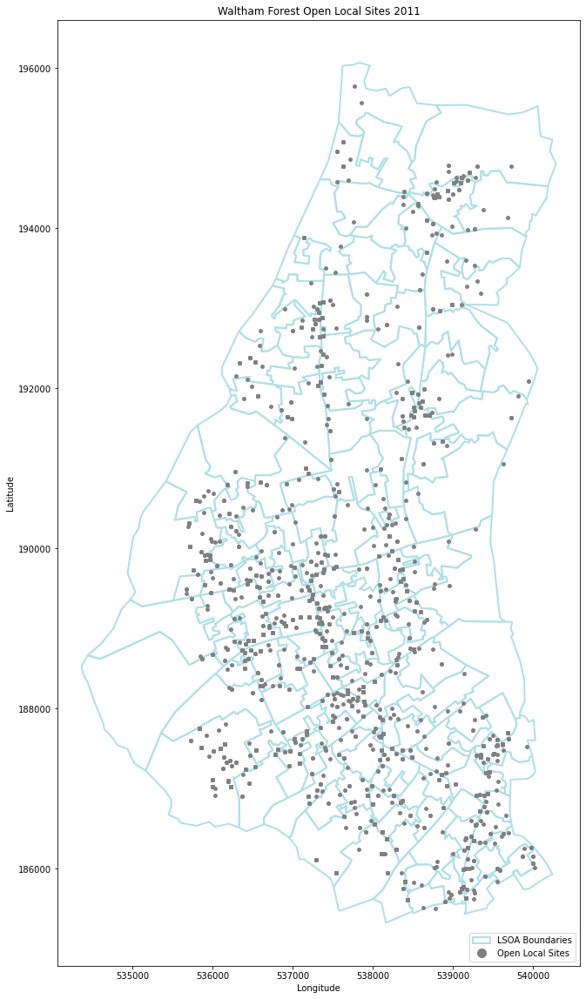

In [99]:
# plot for preview

fig, ax = plt.subplots(figsize=(20, 20))

wf_lsoa.plot(ax=ax, facecolor='none', edgecolor='powderblue', linewidth=2)

geo_openlocal11_wf.plot(ax=ax, color='grey', markersize=15)

ax.set_title('Waltham Forest Open Local Sites 2011')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# create legend
# lsoa_patch = mpatches.Patch(facecolor='none', edgecolor='powderblue', linewidth=2, label='LSOA Boundaries')
openlocal_patch = plt.Line2D([0], [0], marker='o', color='grey', label='Open Local Sites', markersize=10, linestyle='None')

# add legend
ax.legend(handles=[lsoa_patch, openlocal_patch], loc='lower right', bbox_to_anchor=(1, 0))


plt.show()

Match pcd with coordinates for 2021 Waltham Forest data

In [100]:
openlocal21_wf_coor = pd.merge(openlocal21_wf, onspd_selected, left_on='pc__pcs', right_on='pcds')

# WGS84 coordinates (long, lat)

geometry21_wf = [Point(xy) for xy in zip(openlocal21_wf_coor['long'], openlocal21_wf_coor['lat'])]

geo_openlocal21_wf = gpd.GeoDataFrame(openlocal21_wf_coor, geometry=geometry21_wf)


# set CRS for geo_openlocal11_wf, the CRS is WGS 84

geo_openlocal21_wf = geo_openlocal21_wf.set_crs('EPSG:4326')

# transform to crs27700
geo_openlocal21_wf['geometry'] = geo_openlocal21_wf['geometry'].to_crs(crs_27700)

geo_openlocal21_wf.head()

,rates_code,rates_authority_id,rates_authority,region,location_code,address_no,address_street,address_town,pc__pcs,use_category,...,name,rates_paid,status,status_date,status_duration,ratepayers_published,pcds,lat,long,geometry
0,0000000022016166,E09000031,Waltham Forest,Outer London - East and North East,11244514000,BUXTON SCHOOL,CANN HALL ROAD,LONDON,E11 3NN,Local Authority Schools (National Scheme),...,NaN,NaN,True,2017-12-20,NaN,True,E11 3NN,51.557452,0.016529,POINT (539890.978 186212.051)
1,00000009205328,E09000031,Waltham Forest,Outer London - East and North East,12055165000,250,CANN HALL ROAD,LONDON,E11 3NN,Cafes,...,NaN,NaN,True,2019-02-01,NaN,True,E11 3NN,51.557452,0.016529,POINT (539890.978 186212.051)
2,00000000510140,E09000031,Waltham Forest,Outer London - East and North East,8745032000,14,LEYTON GRANGE ESTATE,LONDON,E10 5HN,Offices (Inc Computer Centres),...,NaN,NaN,True,2017-04-01,NaN,True,E10 5HN,51.564894,-0.019575,POINT (537365.912 186971.234)
3,0000000101,E09000031,Waltham Forest,Outer London - East and North East,12549805000,SUITE 101 GND FLR OCEANAIR HOUSE 750-760,HIGH ROAD LEYTONSTONE,LONDON,E11 3AW,Offices (Inc Computer Centres),...,NaN,NaN,True,2019-04-01,NaN,True,E11 3AW,51.570207,0.014350,POINT (539700.864 187626.274)
4,0000000102,E09000031,Waltham Forest,Outer London - East and North East,12549819000,SUITE 102 GND FLR OCEANAIR HSE 750-760,HIGH ROAD LEYTONSTONE,LONDON,E11 3AW,Offices (Inc Computer Centres),...,NaN,NaN,True,2019-04-01,NaN,True,E11 3AW,51.570207,0.014350,POINT (539700.864 187626.274)


In [101]:
geo_openlocal21_wf.crs

<Derived Projected CRS: EPSG:27700>
Name: OSGB36 / British National Grid
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: United Kingdom (UK) - offshore to boundary of UKCS within 49°45'N to 61°N and 9°W to 2°E; onshore Great Britain (England, Wales and Scotland). Isle of Man onshore.
- bounds: (-9.0, 49.75, 2.01, 61.01)
Coordinate Operation:
- name: British National Grid
- method: Transverse Mercator
Datum: Ordnance Survey of Great Britain 1936
- Ellipsoid: Airy 1830
- Prime Meridian: Greenwich

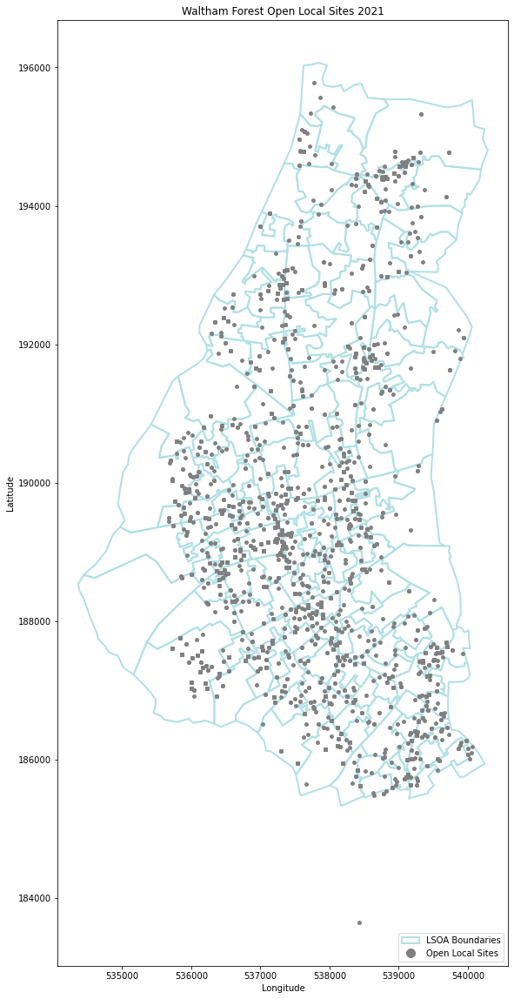

In [102]:
# plot for preview

fig, ax = plt.subplots(figsize=(20, 20))

wf_lsoa.plot(ax=ax, facecolor='none', edgecolor='powderblue', linewidth=2)

geo_openlocal21_wf.plot(ax=ax, color='grey', markersize=15)

ax.set_title('Waltham Forest Open Local Sites 2021')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# add legend
ax.legend(handles=[lsoa_patch, openlocal_patch], loc='lower right', bbox_to_anchor=(1, 0))

plt.show()

In [103]:
# there are points outside the boundary of Waltham Forest
geo_openlocal21_wf_new = gpd.sjoin(geo_openlocal21_wf, wf_lsoa, predicate='within')

geo_openlocal21_wf_new = geo_openlocal21_wf_new.iloc[:, :29]

geo_openlocal21_wf_new.head()

,rates_code,rates_authority_id,rates_authority,region,location_code,address_no,address_street,address_town,pc__pcs,use_category,...,name,rates_paid,status,status_date,status_duration,ratepayers_published,pcds,lat,long,geometry
0,0000000022016166,E09000031,Waltham Forest,Outer London - East and North East,11244514000,BUXTON SCHOOL,CANN HALL ROAD,LONDON,E11 3NN,Local Authority Schools (National Scheme),...,NaN,NaN,True,2017-12-20,NaN,True,E11 3NN,51.557452,0.016529,POINT (539890.978 186212.051)
1,00000009205328,E09000031,Waltham Forest,Outer London - East and North East,12055165000,250,CANN HALL ROAD,LONDON,E11 3NN,Cafes,...,NaN,NaN,True,2019-02-01,NaN,True,E11 3NN,51.557452,0.016529,POINT (539890.978 186212.051)
1186,00000002195741,E09000031,Waltham Forest,Outer London - East and North East,14364057,137,CANN HALL ROAD,LONDON,E11 3NJ,Shops,...,EAST PHARM LTD,2013.1,True,1996-08-09,9001.0,True,E11 3NJ,51.555506,0.012100,POINT (539589.923 185987.196)
1187,0000000219576B,E09000031,Waltham Forest,Outer London - East and North East,186197057,141-143,CANN HALL ROAD,LONDON,E11 3NJ,Shops,...,NaN,NaN,True,2017-04-01,NaN,True,E11 3NJ,51.555506,0.012100,POINT (539589.923 185987.196)
1188,00000002196566,E09000031,Waltham Forest,Outer London - East and North East,14409057,221,CANN HALL ROAD,LONDON,E11 3NJ,Shops,...,NaN,NaN,True,2017-04-01,NaN,True,E11 3NJ,51.555506,0.012100,POINT (539589.923 185987.196)


In [104]:
geo_openlocal21_wf_new.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 6957 entries, 0 to 6626
Data columns (total 29 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   rates_code            6957 non-null   object        
 1   rates_authority_id    6957 non-null   object        
 2   rates_authority       6957 non-null   object        
 3   region                6957 non-null   object        
 4   location_code         6957 non-null   object        
 5   address_no            6957 non-null   object        
 6   address_street        6911 non-null   object        
 7   address_town          6957 non-null   object        
 8   pc__pcs               6957 non-null   object        
 9   use_category          6957 non-null   object        
 10  scat_code             6957 non-null   object        
 11  sub_category          6957 non-null   object        
 12  category              6275 non-null   object        
 13  floor_area

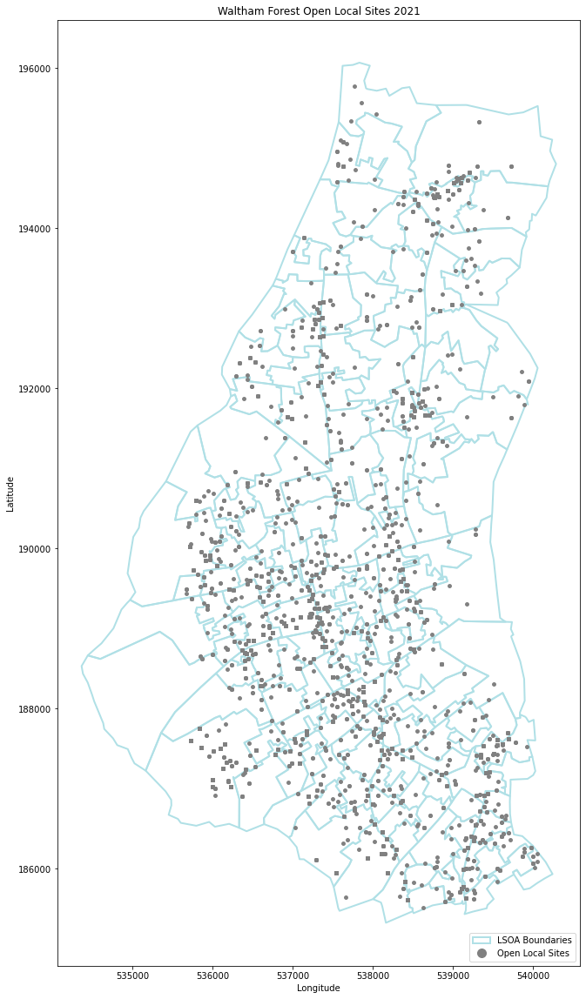

In [105]:
# check again

fig, ax = plt.subplots(figsize=(20, 20))

wf_lsoa.plot(ax=ax, facecolor='none', edgecolor='powderblue', linewidth=2)

geo_openlocal21_wf_new.plot(ax=ax, color='grey', markersize=15)

ax.set_title('Waltham Forest Open Local Sites 2021')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# add legend
ax.legend(handles=[lsoa_patch, openlocal_patch], loc='lower right', bbox_to_anchor=(1, 0))

plt.show()

#### 2. Get the composition of category (overview)

##### Business type composition

In [106]:
# check if there is any 0 or NaN value in the cateogory
check_nan_0 = geo_openlocal11_wf['category'].isnull() | (geo_openlocal11_wf['category'] == 0)
print("rows including 0 or NaN values：")
print(geo_openlocal11_wf[check_nan_0])

rows including 0 or NaN values：
           rates_code rates_authority_id rates_authority  \
35     00000007820009          E09000031  Waltham Forest   
190    0000000790525A          E09000031  Waltham Forest   
240    0000000131912B          E09000031  Waltham Forest   
257    00000001342911          E09000031  Waltham Forest   
259    00000001338051          E09000031  Waltham Forest   
...               ...                ...             ...   
4538   00000008947509          E09000031  Waltham Forest   
4539   00000008947513          E09000031  Waltham Forest   
4551   00000009080189          E09000031  Waltham Forest   
4580   00000248400051          E09000031  Waltham Forest   
4581  N00001776179009          E09000031  Waltham Forest   

                                  region location_code  \
35    Outer London - East and North East     829790000   
190   Outer London - East and North East     234873057   
240   Outer London - East and North East     237557057   
257   Outer Lon

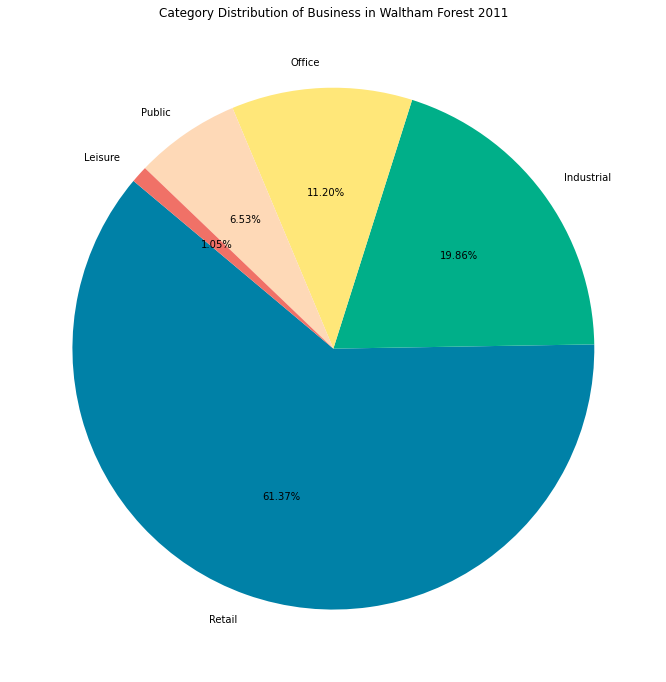

The number of each category: 
Retail        2812
Industrial     910
Office         513
Public         299
Leisure         48
Name: category, dtype: int64
The proportion of each category:
Retail        0.613706
Industrial    0.198603
Office        0.111960
Public        0.065255
Leisure       0.010476
Name: category, dtype: float64


In [107]:
# change category'0' to 'Public'
geo_openlocal11_wf['category'].fillna('Public', inplace=True)

# Count the number of each category
wf11_category_counts = geo_openlocal11_wf['category'].value_counts()

# Calculate the proportion of each category
wf11_category_percentages = wf11_category_counts / wf11_category_counts.sum()

# pie chart
colors = ['#0081A7', '#00AF89', '#FFE779', '#FED9B7', '#F07167']
plt.figure(figsize=(12, 12))
plt.pie(wf11_category_counts, labels=wf11_category_counts.index, autopct='%.2f%%', startangle=140, colors = colors)
plt.title("Category Distribution of Business in Waltham Forest 2011")
plt.show()

print("The number of each category: ")
print(wf11_category_counts)

print("The proportion of each category:")
print(wf11_category_percentages)

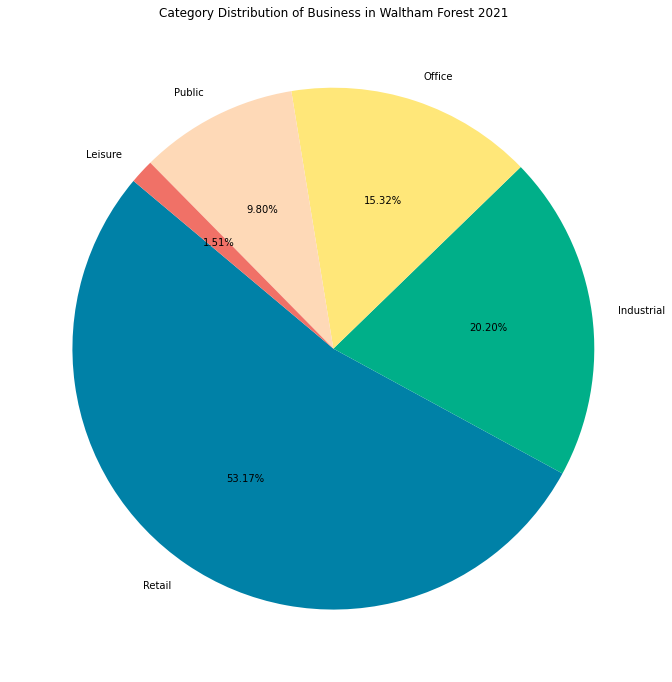

The number of each category: 
Retail        3699
Industrial    1405
Office        1066
Public         682
Leisure        105
Name: category, dtype: int64
The proportion of each category:
Retail        0.531695
Industrial    0.201955
Office        0.153227
Public        0.098031
Leisure       0.015093
Name: category, dtype: float64


In [108]:
# change category'0' to 'Public'
geo_openlocal21_wf_new['category'].fillna('Public', inplace=True)

# Count the number of each category
wf21_category_counts = geo_openlocal21_wf_new['category'].value_counts()

# Calculate the proportion of each category
wf21_category_percentages = wf21_category_counts / wf21_category_counts.sum()

# pie chart
plt.figure(figsize=(12, 12))
plt.pie(wf21_category_counts, labels=wf21_category_counts.index, autopct='%.2f%%', startangle=140, colors = colors)
plt.title("Category Distribution of Business in Waltham Forest 2021")
plt.show()

print("The number of each category: ")
print(wf21_category_counts)

print("The proportion of each category:")
print(wf21_category_percentages)

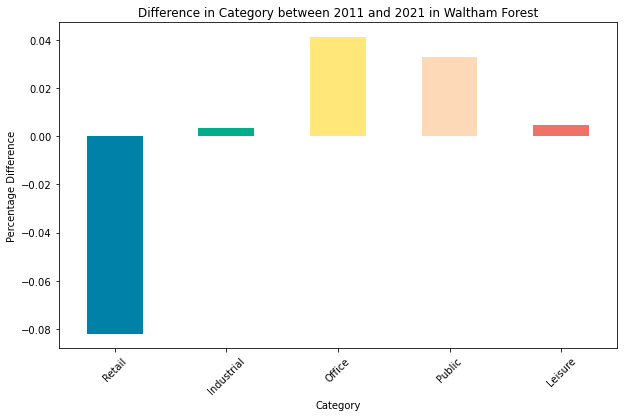

In [109]:
changes_percent_wf = wf21_category_percentages - wf11_category_percentages

plt.figure(figsize=(10, 6))

changes_percent_wf.plot(kind='bar', color = colors)

plt.xlabel('Category')

plt.ylabel('Percentage Difference')

plt.title('Difference in Category between 2011 and 2021 in Waltham Forest')
plt.xticks(rotation=45)
plt.show()

##### Retail Composition

The column'scat_code' is the code for use_category, can used to check the diversity changes of retail use category in High Streets.

In [110]:
retail11_wf = geo_openlocal11_wf[geo_openlocal11_wf['category'] == 'Retail']

retail11_wf.head()

,rates_code,rates_authority_id,rates_authority,region,location_code,address_no,address_street,address_town,pc__pcs,use_category,...,name,rates_paid,status,status_date,status_duration,ratepayers_published,pcds,lat,long,geometry
28,00000001087017,E09000031,Waltham Forest,Outer London - East and North East,185965057,1 & 2,ALBERT CRESCENT,LONDON,E4 6SH,Shops,...,NEXUS FOODS LIMITED,12929.67,True,2009-08-10,599.0,True,E4 6SH,51.617346,-0.018464,POINT (537284.800 192806.151)
29,00000001087036,E09000031,Waltham Forest,Outer London - East and North East,202328057,4,ALBERT CRESCENT,LONDON,E4 6SH,Shops,...,GREGGS OF ENFIELD PLC,5319.17,True,1994-04-01,6209.0,True,E4 6SH,51.617346,-0.018464,POINT (537284.800 192806.151)
30,0000000108704B,E09000031,Waltham Forest,Outer London - East and North East,1126057,5,ALBERT CRESCENT,LONDON,E4 6SH,Shops,...,NaN,NaN,True,2010-04-01,NaN,True,E4 6SH,51.617346,-0.018464,POINT (537284.800 192806.151)
31,00000001087089,E09000031,Waltham Forest,Outer London - East and North East,1122057,10,ALBERT CRESCENT,LONDON,E4 6SH,Shops,...,PERCY INGLE BAKERIES LTD,5892.00,True,2003-04-01,2922.0,True,E4 6SH,51.617346,-0.018464,POINT (537284.800 192806.151)
32,0000000108711B,E09000031,Waltham Forest,Outer London - East and North East,202329057,3,ALBERT CRESCENT,LONDON,E4 6SH,Shops,...,NaN,NaN,True,2010-04-01,NaN,True,E4 6SH,51.617346,-0.018464,POINT (537284.800 192806.151)


In [111]:
retail11_wf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 2812 entries, 28 to 4579
Data columns (total 29 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   rates_code            2812 non-null   object        
 1   rates_authority_id    2812 non-null   object        
 2   rates_authority       2812 non-null   object        
 3   region                2812 non-null   object        
 4   location_code         2812 non-null   object        
 5   address_no            2812 non-null   object        
 6   address_street        2789 non-null   object        
 7   address_town          2812 non-null   object        
 8   pc__pcs               2812 non-null   object        
 9   use_category          2812 non-null   object        
 10  scat_code             2812 non-null   object        
 11  sub_category          2812 non-null   object        
 12  category              2812 non-null   object        
 13  floor_are

In [112]:
retail21_wf = geo_openlocal21_wf_new[geo_openlocal21_wf_new['category'] == 'Retail']

retail21_wf.head()

,rates_code,rates_authority_id,rates_authority,region,location_code,address_no,address_street,address_town,pc__pcs,use_category,...,name,rates_paid,status,status_date,status_duration,ratepayers_published,pcds,lat,long,geometry
1,00000009205328,E09000031,Waltham Forest,Outer London - East and North East,12055165000,250,CANN HALL ROAD,LONDON,E11 3NN,Cafes,...,NaN,NaN,True,2019-02-01,NaN,True,E11 3NN,51.557452,0.016529,POINT (539890.978 186212.051)
1186,00000002195741,E09000031,Waltham Forest,Outer London - East and North East,14364057,137,CANN HALL ROAD,LONDON,E11 3NJ,Shops,...,EAST PHARM LTD,2013.1,True,1996-08-09,9001.0,True,E11 3NJ,51.555506,0.012100,POINT (539589.923 185987.196)
1187,0000000219576B,E09000031,Waltham Forest,Outer London - East and North East,186197057,141-143,CANN HALL ROAD,LONDON,E11 3NJ,Shops,...,NaN,NaN,True,2017-04-01,NaN,True,E11 3NJ,51.555506,0.012100,POINT (539589.923 185987.196)
1188,00000002196566,E09000031,Waltham Forest,Outer London - East and North East,14409057,221,CANN HALL ROAD,LONDON,E11 3NJ,Shops,...,NaN,NaN,True,2017-04-01,NaN,True,E11 3NJ,51.555506,0.012100,POINT (539589.923 185987.196)
1189,00000002196585,E09000031,Waltham Forest,Outer London - East and North East,14411057,225,CANN HALL ROAD,LONDON,E11 3NJ,Shops,...,CANN HALL FRIED CHICKEN LIMITED,0.0,True,2019-04-09,723.0,True,E11 3NJ,51.555506,0.012100,POINT (539589.923 185987.196)


In [113]:
retail21_wf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 3699 entries, 1 to 6625
Data columns (total 29 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   rates_code            3699 non-null   object        
 1   rates_authority_id    3699 non-null   object        
 2   rates_authority       3699 non-null   object        
 3   region                3699 non-null   object        
 4   location_code         3699 non-null   object        
 5   address_no            3699 non-null   object        
 6   address_street        3672 non-null   object        
 7   address_town          3699 non-null   object        
 8   pc__pcs               3699 non-null   object        
 9   use_category          3699 non-null   object        
 10  scat_code             3699 non-null   object        
 11  sub_category          3699 non-null   object        
 12  category              3699 non-null   object        
 13  floor_area

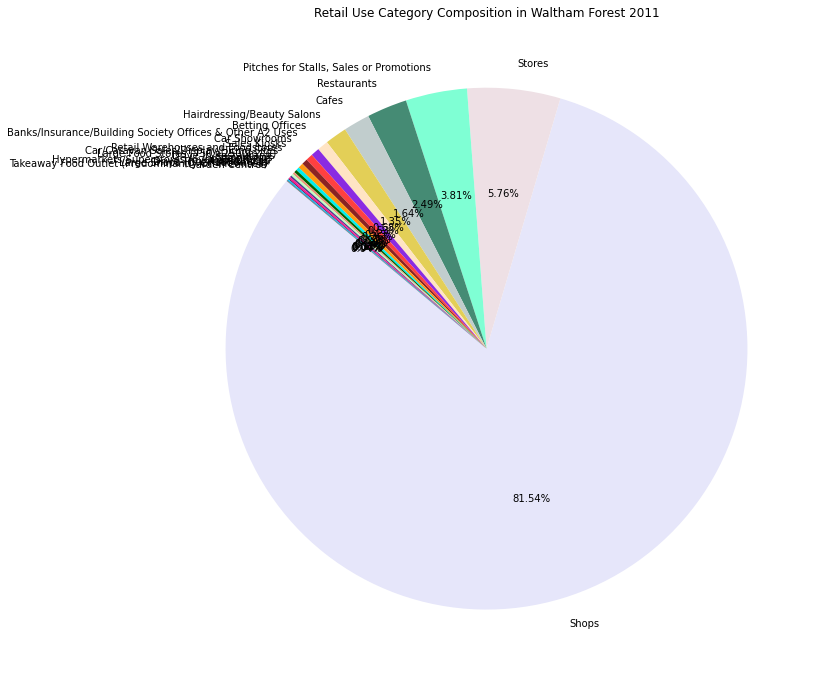

The number of each retail category: 
Shops                                                       2293
Stores                                                       162
Pitches for Stalls, Sales or Promotions                      107
Restaurants                                                   70
Cafes                                                         46
Hairdressing/Beauty Salons                                    38
Betting Offices                                               19
Banks/Insurance/Building Society Offices & Other A2 Uses      15
Car Showrooms                                                 12
Sales Kiosks                                                  10
Retail Warehouses and Foodstores                               9
Car/Caravan Sales/Display/Hiring Sites                         6
Large Food Stores (750 - 2500m^2)                              5
Drive-In Restaurants                                           4
Showrooms                                            

In [114]:
# Count the number of each retail lcategory
wf11_retail_counts = retail11_wf['use_category'].value_counts()

# Calculate the proportion of each category
wf11_retail_percentages = wf11_retail_counts / wf11_retail_counts.sum()

# pie chart
colors28 = ['#E6E6FA', '#EEE0E5', '#7FFFD4', '#458B74', '#C1CDCD', '#E3CF57', '#FFE4C4',
            '#8A2BE2', '#FF4040', '#8B2323', '#FF9912', '#00EEEE', '#006400', '#E9967A',
            '#C1FFC1', '#483D8B', '#FF1493', '#8B0A50', '#00BFFF', '#00688B', '#696969',
            '#104E8B', '#030303', '#B0B0B0', '#838B83', '#CD6090', '#8B3A62', '#F0E68C']
plt.figure(figsize=(12, 12))
plt.pie(wf11_retail_counts, labels=wf11_retail_counts.index, autopct='%.2f%%', startangle=140, colors = colors28)
plt.title('Retail Use Category Composition in Waltham Forest 2011')
plt.show()

print("The number of each retail category: ")
print(wf11_retail_counts)

print("The proportion of each retail category:")
print(wf11_retail_percentages)

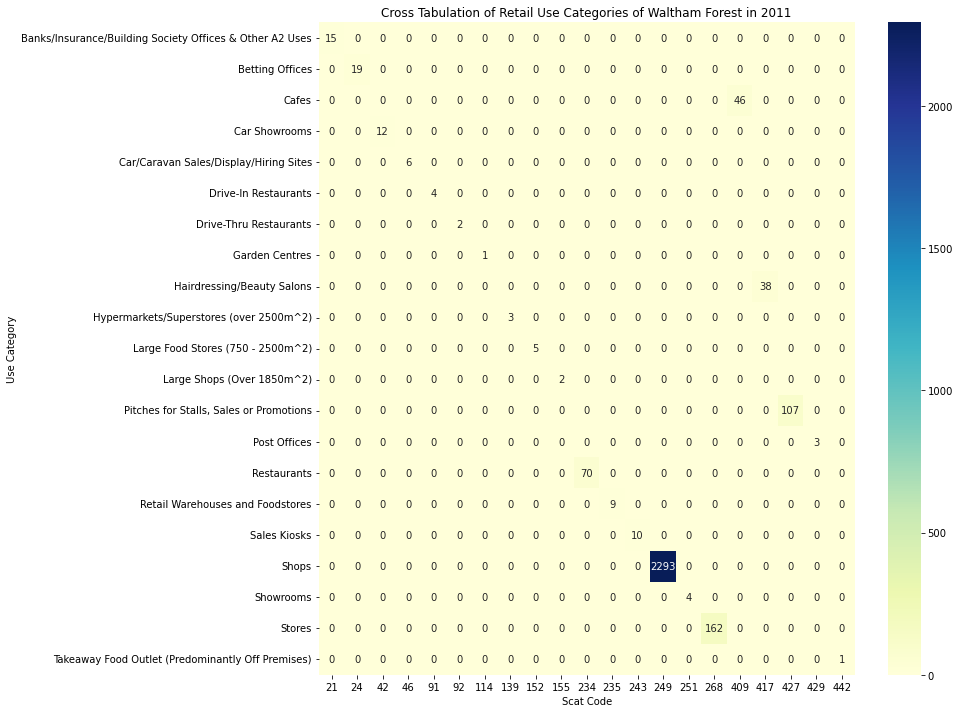

In [115]:
cross_tab_wf11 = pd.crosstab(index=retail11_wf['use_category'], columns=retail11_wf['scat_code'])

# plot
plt.figure(figsize=(12, 12))
sns.heatmap(cross_tab_wf11, annot=True, fmt='d', cmap='YlGnBu') 
plt.title('Cross Tabulation of Retail Use Categories of Waltham Forest in 2011')
plt.xlabel('Scat Code')
plt.ylabel('Use Category')
plt.show()

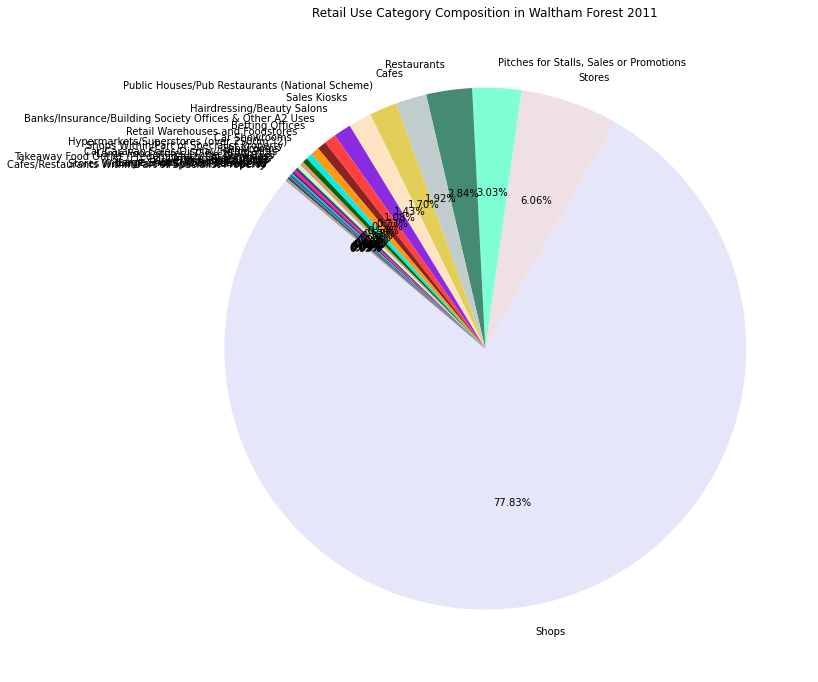

The number of each retail category: 
Shops                                                       2879
Stores                                                       224
Pitches for Stalls, Sales or Promotions                      112
Restaurants                                                  105
Cafes                                                         71
Public Houses/Pub Restaurants (National Scheme)               63
Sales Kiosks                                                  53
Hairdressing/Beauty Salons                                    40
Banks/Insurance/Building Society Offices & Other A2 Uses      27
Betting Offices                                               21
Retail Warehouses and Foodstores                              20
Car Showrooms                                                 14
Hypermarkets/Superstores (over 2500m^2)                       12
Shops Within/Part of Specialist Property                       9
Showrooms                                            

In [116]:
# Count the number of each retail lcategory
wf21_retail_counts = retail21_wf['use_category'].value_counts()

# Calculate the proportion of each category
wf21_retail_percentages = wf21_retail_counts / wf21_retail_counts.sum()

# bar chart
plt.figure(figsize=(12, 12))
plt.pie(wf21_retail_counts, labels=wf21_retail_counts.index, autopct='%.2f%%', startangle=140, colors = colors28)
plt.title('Retail Use Category Composition in Waltham Forest 2011')
plt.show()

print("The number of each retail category: ")
print(wf21_retail_counts)

print("The proportion of each retail category:")
print(wf21_retail_percentages)

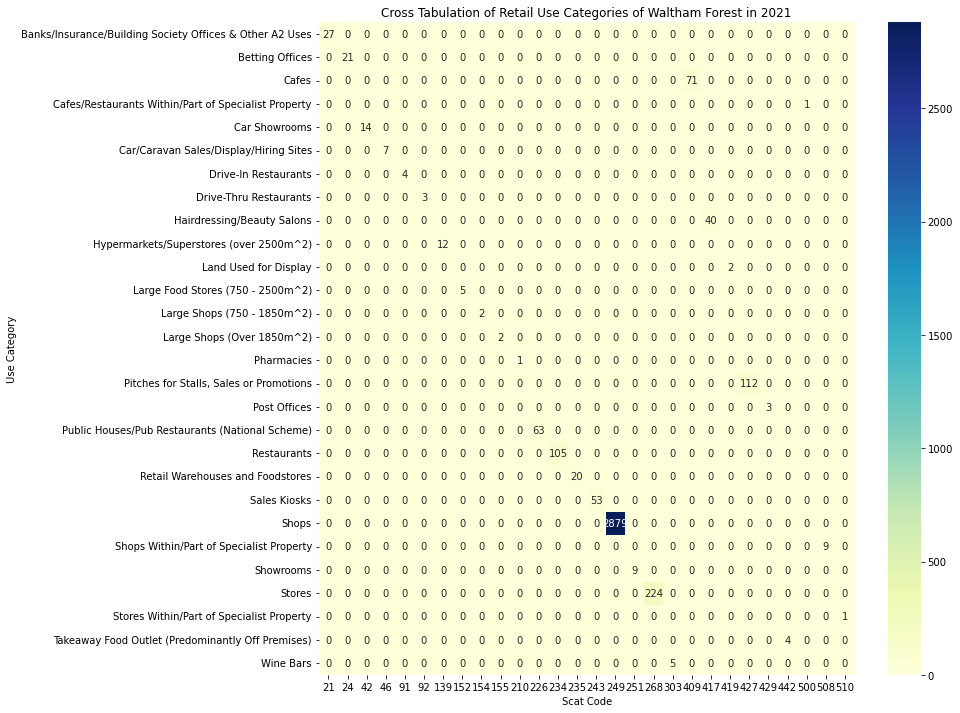

In [117]:
cross_tab_wf21 = pd.crosstab(index=retail21_wf['use_category'], columns=retail21_wf['scat_code'])

# plot
plt.figure(figsize=(12, 12))
sns.heatmap(cross_tab_wf21, annot=True, fmt='d', cmap='YlGnBu') 
plt.title('Cross Tabulation of Retail Use Categories of Waltham Forest in 2021')
plt.xlabel('Scat Code')
plt.ylabel('Use Category')
plt.show()

In [118]:
cross_tab_changes_wf = cross_tab_wf21.copy()
cross_tab_changes_wf.update(cross_tab_wf21 - cross_tab_wf11)

# check if thereare NA value
has_na = cross_tab_changes_wf.isna().any().any()

if has_na:
    print("cross tab has NaN values")
else:
    print("cross tab has no NaN values")

cross tab has no NaN values


In [119]:
cross_tab_changes_wf = cross_tab_changes_wf.astype(int)
cross_tab_changes_wf

scat_code,21,24,42,46,91,92,139,152,154,155,...,303,409,417,419,427,429,442,500,508,510
use_category,,,,,,,,,,,,,,,,,,,,,
Banks/Insurance/Building Society Offices & Other A2 Uses,12,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Betting Offices,0,2,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Cafes,0,0,0,0,0,0,0,0,0,0,...,0,25,0,0,0,0,0,0,0,0
Cafes/Restaurants Within/Part of Specialist Property,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
Car Showrooms,0,0,2,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Car/Caravan Sales/Display/Hiring Sites,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Drive-In Restaurants,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Drive-Thru Restaurants,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Hairdressing/Beauty Salons,0,0,0,0,0,0,0,0,0,0,...,0,0,2,0,0,0,0,0,0,0


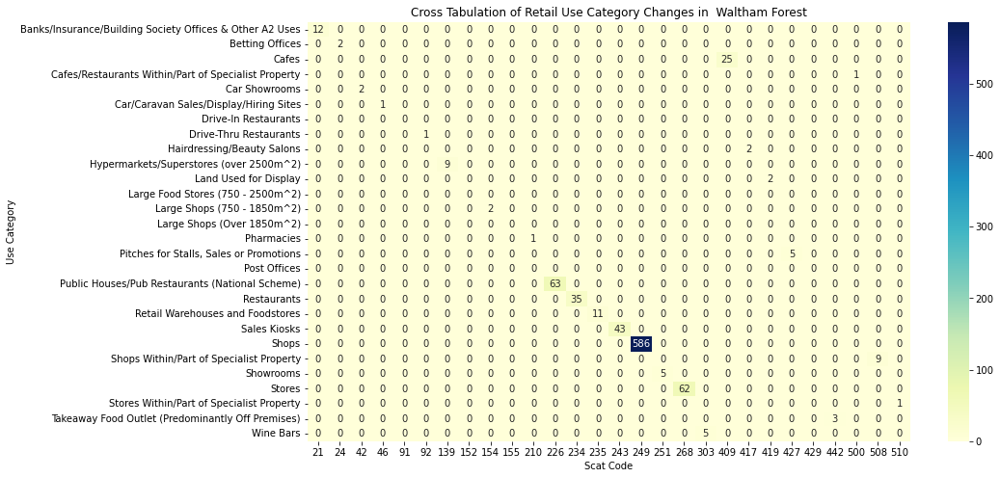

In [120]:
# plot
plt.figure(figsize=(14, 8))
sns.heatmap(cross_tab_changes_wf, annot=True, fmt='d', cmap='YlGnBu') 
plt.title('Cross Tabulation of Retail Use Category Changes in  Waltham Forest')
plt.xlabel('Scat Code')
plt.ylabel('Use Category')
plt.show() 

<Figure size 1440x720 with 0 Axes>

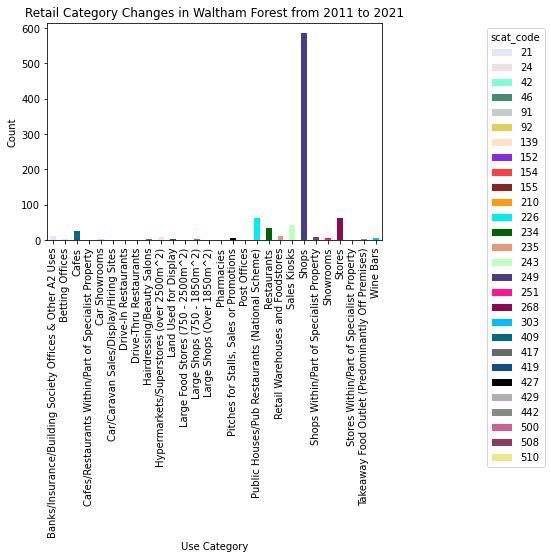

In [121]:
# Extract non-zero items
non_zero_cross_tab_wf = cross_tab_changes_wf[cross_tab_changes_wf != 0]

# plot bar chart
plt.figure(figsize=(20, 10))
non_zero_cross_tab_wf.plot(kind='bar', stacked=True, color=colors28)
plt.title('Retail Category Changes in Waltham Forest from 2011 to 2021')
plt.xlabel('Use Category')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.legend(title='scat_code', loc='upper right', bbox_to_anchor=(1.5, 1))

plt.show()

In [122]:
negative_count = (non_zero_cross_tab_wf < 0).sum().sum()
print("Number of negative values:", negative_count)

Number of negative values: 0


All category counts are increased

In [123]:
top_category_changes = non_zero_cross_tab_wf.stack().nlargest(10)
top_10_values = top_category_changes.values
top_10_index = top_category_changes.index

top_10_index

MultiIndex([(                                                   'Shops', 249),
            (         'Public Houses/Pub Restaurants (National Scheme)', 226),
            (                                                  'Stores', 268),
            (                                            'Sales Kiosks', 243),
            (                                             'Restaurants', 234),
            (                                                   'Cafes', 409),
            ('Banks/Insurance/Building Society Offices & Other A2 Uses',  21),
            (                        'Retail Warehouses and Foodstores', 235),
            (                 'Hypermarkets/Superstores (over 2500m^2)', 139),
            (                'Shops Within/Part of Specialist Property', 508)],
           names=['use_category', 'scat_code'])

In [124]:
top_10_values

array([586.,  63.,  62.,  43.,  35.,  25.,  12.,  11.,   9.,   9.])

There are 28 categories in `use_category`.

Categories:

'Shops', 'Public Houses/Pub Restaurants (National Scheme)', 'Stores', 'Sales Kiosks', 'Restaurants', 'Cafes', 
'Banks/Insurance/Building Society Offices & Other A2 Uses','Retail Warehouses and Foodstores', 
'Hypermarkets/Superstores (over 2500m^2)', 'Shops Within/Part of Specialist Property'

After we extract retails in high streets, check if the top categoties are the same or not.

In [125]:
categories_to_extract = ['Shops', 'Public Houses/Pub Restaurants (National Scheme)', 'Stores', 'Sales Kiosks', 'Restaurants', 'Cafes', 
'Banks/Insurance/Building Society Offices & Other A2 Uses','Retail Warehouses and Foodstores', 
'Hypermarkets/Superstores (over 2500m^2)', 'Shops Within/Part of Specialist Property']

filtered_category = non_zero_cross_tab_wf.loc[categories_to_extract]
# Extract all non-NaN values of cross_tab
filtered_category_no_nan = filtered_category.stack() # series
# Turn series to dataframe
filtered_category_no_nan = filtered_category_no_nan.reset_index()
filtered_category_no_nan = filtered_category_no_nan.rename(columns={0: 'changes_count'})

top10category = pd.DataFrame(filtered_category_no_nan, columns=['index', 'use_category', 'scat_code', 'changes_count'])

<Figure size 1152x576 with 0 Axes>

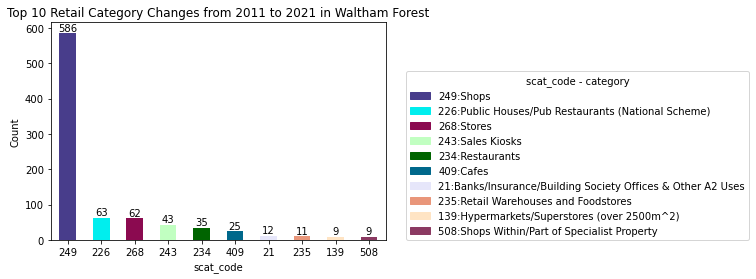

In [126]:
plt.figure(figsize=(16, 8))

# Plot the histogram

# pie chart
colors10 = ['#483D8B', '#00EEEE', '#8B0A50', '#C1FFC1', '#006400', '#00688B', '#E6E6FA', '#E9967A', '#FFE4C4', '#8B3A62']
# Plot the histogram
ax = top10category.plot(x='scat_code', y='changes_count', kind='bar', stacked=True, color=colors10)

# Add labels to the bars
for p in ax.patches:
    ax.annotate(str(int(p.get_height())), (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 5), textcoords='offset points')

plt.title('Top 10 Retail Category Changes from 2011 to 2021 in Waltham Forest')
plt.xlabel('scat_code')
plt.ylabel('Count')
plt.xticks(rotation=0)

# Create legend handles and labels using scat_code values and colors
legend_labels = top10category['scat_code'].unique()
legend_handles = [mpatches.Patch(color=color, label=f"{label}:{category}") for label, color, category in zip(legend_labels, colors10, top10category['use_category'])]

# Add the custom legend to the plot
ax.legend(handles=legend_handles, title='scat_code - category', loc='upper right', bbox_to_anchor=(2.1, 0.8))

plt.show()

### Extract commercial points and LSOAs within the radiation range of the high street (Waltham Forest)

1. Set buffer zones for high streets;

2. Select retail points inside high streets and get the retail composition and duration changes;

3. Get all LSOAs influenced by the high streets.

#### 1. Set buffer zones for high streets

In [127]:
buffer_distance = 100  # unit: metres

wf_highstreet_buffered = wf_highstreet.copy()

wf_highstreet_buffered['geometry'] = wf_highstreet['geometry'].buffer(buffer_distance)

wf_highstreet_buffered = gpd.GeoDataFrame(wf_highstreet_buffered, geometry='geometry')

wf_highstreet_buffered.crs

<Derived Projected CRS: EPSG:27700>
Name: OSGB36 / British National Grid
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: United Kingdom (UK) - offshore to boundary of UKCS within 49°45'N to 61°N and 9°W to 2°E; onshore Great Britain (England, Wales and Scotland). Isle of Man onshore.
- bounds: (-9.0, 49.75, 2.01, 61.01)
Coordinate Operation:
- name: British National Grid
- method: Transverse Mercator
Datum: Ordnance Survey of Great Britain 1936
- Ellipsoid: Airy 1830
- Prime Meridian: Greenwich

In [128]:
wf_highstreet_buffered

,highstreet_id,highstreet_name,area_ha,gdb_geomattr_data,BoroughNM,LAD11CD,geometry
242,237,"Billet Road, Walthamstow.",4.395863,None,Waltham Forest,E09000031,"POLYGON ((536262.513 190811.239, 536262.221 19..."
250,244,"Forest Road (Pembar Avenue), Blackhorse Road",5.781402,None,Waltham Forest,E09000031,"POLYGON ((535926.360 189413.675, 535926.343 18..."
255,249,"Burnside Avenue, Walthamstow.",7.221877,None,Waltham Forest,E09000031,"POLYGON ((536882.654 191727.218, 536882.608 19..."
256,250,"Chingford Mount Road, Walthamstow.",9.698066,None,Waltham Forest,E09000031,"POLYGON ((537134.586 192066.525, 537134.342 19..."
258,252,"Old Church Road, Chingford.",13.973184,None,Waltham Forest,E09000031,"POLYGON ((537073.966 192690.163, 537073.873 19..."
259,253,"Forest Road & Palmerston Road, Walthamstow",10.135427,None,Waltham Forest,E09000031,"POLYGON ((536329.030 189587.358, 536328.884 18..."
263,257,"Grove Green Road, Leytonstone.",4.605851,None,Waltham Forest,E09000031,"POLYGON ((538692.318 187097.746, 538690.880 18..."
403,397,"The Avenue, Highams Park.",9.215191,None,Waltham Forest,E09000031,"POLYGON ((538318.431 191611.184, 538317.498 19..."
474,466,"Francis Road, Leyton",6.813432,None,Waltham Forest,E09000031,"POLYGON ((538000.083 186943.393, 537992.504 18..."
515,503,"Leytonstone High Road, Leytonstone.",37.861426,None,Waltham Forest,E09000031,"POLYGON ((539034.343 186338.825, 539035.232 18..."


In [129]:
wf_highstreet

,highstreet_id,highstreet_name,area_ha,gdb_geomattr_data,BoroughNM,LAD11CD,geometry
242,237,"Billet Road, Walthamstow.",4.395863,None,Waltham Forest,E09000031,"POLYGON ((536538.954 190900.525, 536542.912 19..."
250,244,"Forest Road (Pembar Avenue), Blackhorse Road",5.781402,None,Waltham Forest,E09000031,"POLYGON ((536387.113 189539.524, 536388.069 18..."
255,249,"Burnside Avenue, Walthamstow.",7.221877,None,Waltham Forest,E09000031,"POLYGON ((537128.872 191807.945, 537130.364 19..."
256,250,"Chingford Mount Road, Walthamstow.",9.698066,None,Waltham Forest,E09000031,"POLYGON ((537509.991 191894.780, 537509.035 19..."
258,252,"Old Church Road, Chingford.",13.973184,None,Waltham Forest,E09000031,"POLYGON ((537451.583 192633.269, 537451.715 19..."
259,253,"Forest Road & Palmerston Road, Walthamstow",10.135427,None,Waltham Forest,E09000031,"POLYGON ((536774.219 189748.454, 536776.403 18..."
263,257,"Grove Green Road, Leytonstone.",4.605851,None,Waltham Forest,E09000031,"POLYGON ((538947.848 186917.325, 538938.094 18..."
403,397,"The Avenue, Highams Park.",9.215191,None,Waltham Forest,E09000031,"POLYGON ((538679.256 191889.252, 538684.327 19..."
474,466,"Francis Road, Leyton",6.813432,None,Waltham Forest,E09000031,"POLYGON ((538057.472 187025.286, 538112.679 18..."
515,503,"Leytonstone High Road, Leytonstone.",37.861426,None,Waltham Forest,E09000031,"POLYGON ((539839.361 187616.515, 539842.206 18..."


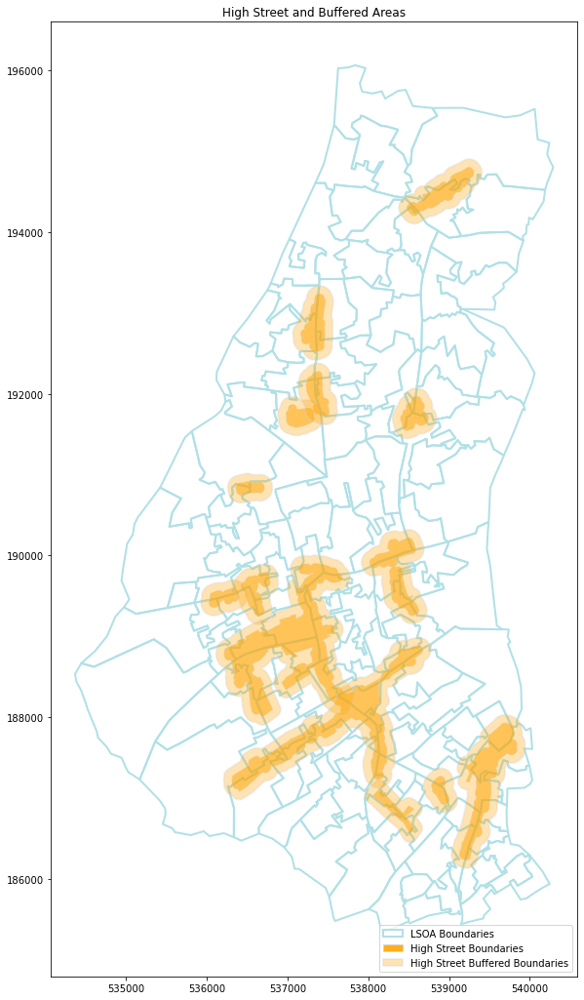

In [130]:
fig, ax = plt.subplots(figsize=(18,18))

wf_lsoa.plot(ax=ax, facecolor='none', edgecolor='powderblue', linewidth=2)

wf_highstreet.plot(ax=ax, linewidth=0.8, facecolor='orange', edgecolor = 'lightgray', alpha=0.5)

wf_highstreet_buffered.plot(ax=ax, linewidth=2, facecolor='orange', edgecolor = 'lightgray', alpha=0.3)


plt.title('LSOA within the high street radius of Waltham Forest')


plt.title('High Street and Buffered Areas')

# create legend
highstreet_line1 = mpatches.Patch(facecolor='none', edgecolor='orange', linewidth=0.8, label='High Street Boundaries')
highstreet_buffered = mpatches.Patch(facecolor='none', edgecolor='orange', linewidth=2, label='High Street Buffered Boundaries')

highstreet_line2 = mpatches.Patch(edgecolor='lightgray', facecolor='orange', alpha=0.9, linewidth=0.8, label='High Street Boundaries')
highstreet_buffered2 = mpatches.Patch(edgecolor='lightgray', facecolor='orange', alpha=0.3, linewidth=2, label='High Street Buffered Boundaries')

# add legend
ax.legend(handles=[lsoa_patch, highstreet_line2, highstreet_buffered2], loc='lower right', bbox_to_anchor=(1, 0))

plt.show()

#### 2. Select retail points inside high streets and get the retail composition and duration changes

##### 2011

In [131]:
wf_hs_retail11 = gpd.sjoin(retail11_wf, wf_highstreet_buffered, predicate='within')

In [132]:
# Check whether there are duplicate records of retails points
# because the radiation range of the high street is coincident

duplicate11 = retail11_wf.duplicated(subset=['rates_code'], keep=False)
duplicate11 = retail11_wf[duplicate11]
print(duplicate11)
print()
# rates_code should be unique for each retail

duplicate_hs11 = wf_hs_retail11.duplicated(subset=['rates_code'], keep=False)
duplicate_hs11 = wf_hs_retail11[duplicate_hs11]
print(duplicate_hs11)

Empty GeoDataFrame
Columns: [rates_code, rates_authority_id, rates_authority, region, location_code, address_no, address_street, address_town, pc__pcs, use_category, scat_code, sub_category, category, floor_area, rental_valuation, valuation_date, revaluation_year, period, rates_expected, name, rates_paid, status, status_date, status_duration, ratepayers_published, pcds, lat, long, geometry]
Index: []

[0 rows x 29 columns]

          rates_code rates_authority_id rates_authority  \
2512  00000004879811          E09000031  Waltham Forest   
2513  00000004893325          E09000031  Waltham Forest   
2514  00000004893359          E09000031  Waltham Forest   
2515  0000000489340A          E09000031  Waltham Forest   
2516  00000004893428          E09000031  Waltham Forest   
...              ...                ...             ...   
1187  00000003931425          E09000031  Waltham Forest   
1188  00000003937455          E09000031  Waltham Forest   
1189  0000000393984B          E09000031  

In [133]:
wf_hs_retail11 = wf_hs_retail11.drop_duplicates(subset=['rates_code'])

wf_hs_retail11.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 2010 entries, 28 to 4565
Data columns (total 36 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   rates_code            2010 non-null   object        
 1   rates_authority_id    2010 non-null   object        
 2   rates_authority       2010 non-null   object        
 3   region                2010 non-null   object        
 4   location_code         2010 non-null   object        
 5   address_no            2010 non-null   object        
 6   address_street        1997 non-null   object        
 7   address_town          2010 non-null   object        
 8   pc__pcs               2010 non-null   object        
 9   use_category          2010 non-null   object        
 10  scat_code             2010 non-null   object        
 11  sub_category          2010 non-null   object        
 12  category              2010 non-null   object        
 13  floor_are

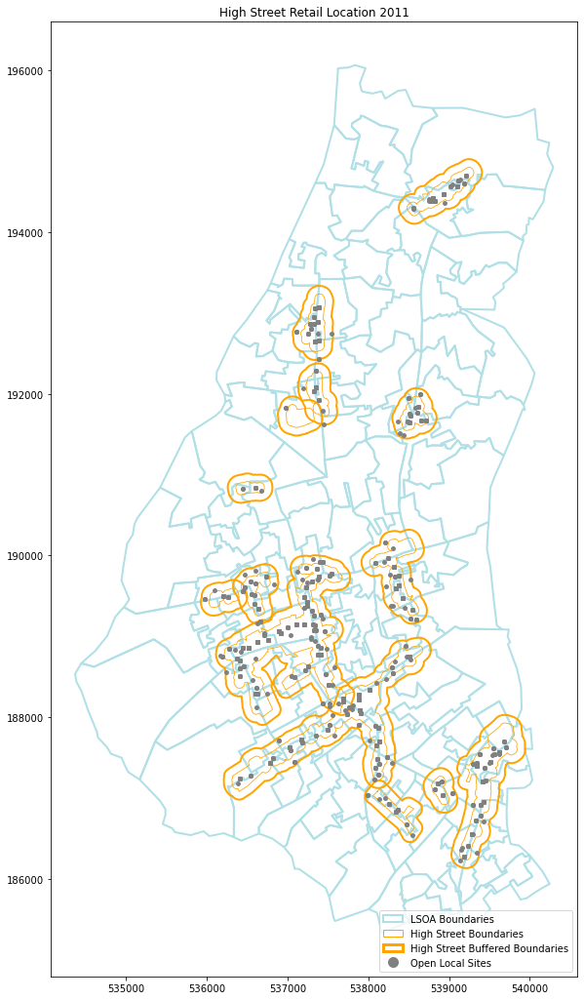

In [134]:
# plot and check 
fig, ax = plt.subplots(figsize=(18,18))

wf_lsoa.plot(ax=ax, facecolor='none', edgecolor='powderblue', linewidth=2)

wf_highstreet.plot(ax=ax, linewidth=0.8, edgecolor='orange', facecolor = 'none')

wf_highstreet_buffered.plot(ax=ax, linewidth=2, edgecolor='orange', facecolor = 'none')

wf_hs_retail11.plot(ax=ax, markersize=15, color = 'grey')

plt.title('High Street Retail Location 2011')


# create legend
highstreet_line1 = mpatches.Patch(facecolor='none', edgecolor='orange', linewidth=1, label='High Street Boundaries')
highstreet_buffered = mpatches.Patch(facecolor='none', edgecolor='orange', linewidth=3, label='High Street Buffered Boundaries')

# add legend
ax.legend(handles=[lsoa_patch, highstreet_line1, highstreet_buffered, openlocal_patch], loc='lower right', bbox_to_anchor=(1, 0))

plt.show()

In [135]:
# create a dataframe to collect High Streets information and open local sites information together
result_df1 = wf_hs_retail11[['highstreet_id', 'rates_code']]

result_df1 = result_df1.merge(wf_highstreet_buffered, on='highstreet_id', how='outer')

wf_highstreet_retail11 = wf_hs_retail11.merge(result_df1, on='rates_code', how='outer', suffixes=('', '*'))
wf_highstreet_retail11 = wf_highstreet_retail11.filter(regex='^[^*]*$')

# change column order
wf_highstreet_retail11.insert(7, 'rates_code', wf_highstreet_retail11.pop('rates_code'))

# drop index_right
wf_highstreet_retail11 = wf_highstreet_retail11.drop(columns=['index_right'])

# drop duplicate retails
wf_highstreet_retail11 = wf_highstreet_retail11.drop_duplicates(subset=['rates_code'])

wf_highstreet_retail11.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 2010 entries, 0 to 2009
Data columns (total 35 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   rates_authority_id    2010 non-null   object        
 1   rates_authority       2010 non-null   object        
 2   region                2010 non-null   object        
 3   location_code         2010 non-null   object        
 4   address_no            2010 non-null   object        
 5   address_street        1997 non-null   object        
 6   address_town          2010 non-null   object        
 7   rates_code            2010 non-null   object        
 8   pc__pcs               2010 non-null   object        
 9   use_category          2010 non-null   object        
 10  scat_code             2010 non-null   object        
 11  sub_category          2010 non-null   object        
 12  category              2010 non-null   object        
 13  floor_area

In [136]:
wf_highstreet_retail11.head()

,rates_authority_id,rates_authority,region,location_code,address_no,address_street,address_town,rates_code,pc__pcs,use_category,...,pcds,lat,long,geometry,highstreet_id,highstreet_name,area_ha,gdb_geomattr_data,BoroughNM,LAD11CD
0,E09000031,Waltham Forest,Outer London - East and North East,185965057,1 & 2,ALBERT CRESCENT,LONDON,00000001087017,E4 6SH,Shops,...,E4 6SH,51.617346,-0.018464,POINT (537284.800 192806.151),252,"Old Church Road, Chingford.",13.973184,None,Waltham Forest,E09000031
1,E09000031,Waltham Forest,Outer London - East and North East,202328057,4,ALBERT CRESCENT,LONDON,00000001087036,E4 6SH,Shops,...,E4 6SH,51.617346,-0.018464,POINT (537284.800 192806.151),252,"Old Church Road, Chingford.",13.973184,None,Waltham Forest,E09000031
2,E09000031,Waltham Forest,Outer London - East and North East,1126057,5,ALBERT CRESCENT,LONDON,0000000108704B,E4 6SH,Shops,...,E4 6SH,51.617346,-0.018464,POINT (537284.800 192806.151),252,"Old Church Road, Chingford.",13.973184,None,Waltham Forest,E09000031
3,E09000031,Waltham Forest,Outer London - East and North East,1122057,10,ALBERT CRESCENT,LONDON,00000001087089,E4 6SH,Shops,...,E4 6SH,51.617346,-0.018464,POINT (537284.800 192806.151),252,"Old Church Road, Chingford.",13.973184,None,Waltham Forest,E09000031
4,E09000031,Waltham Forest,Outer London - East and North East,202329057,3,ALBERT CRESCENT,LONDON,0000000108711B,E4 6SH,Shops,...,E4 6SH,51.617346,-0.018464,POINT (537284.800 192806.151),252,"Old Church Road, Chingford.",13.973184,None,Waltham Forest,E09000031


##### 2021

In [137]:
wf_hs_retail21 = gpd.sjoin(retail21_wf, wf_highstreet_buffered, predicate='within')

# Check whether there are duplicate records of retails points
# because the radiation range of the high street is coincident
duplicate21 = retail21_wf.duplicated(subset=['rates_code'], keep=False)
duplicate21 = retail21_wf[duplicate21]
print(duplicate21)
print()
# rates_code should be unique for each retail

duplicate_hs21 = wf_hs_retail21.duplicated(subset=['rates_code'], keep=False)
duplicate_hs21 = wf_hs_retail21[duplicate_hs21]
print(duplicate_hs21)

Empty GeoDataFrame
Columns: [rates_code, rates_authority_id, rates_authority, region, location_code, address_no, address_street, address_town, pc__pcs, use_category, scat_code, sub_category, category, floor_area, rental_valuation, valuation_date, revaluation_year, period, rates_expected, name, rates_paid, status, status_date, status_duration, ratepayers_published, pcds, lat, long, geometry]
Index: []

[0 rows x 29 columns]

          rates_code rates_authority_id rates_authority  \
4401  00000004879811          E09000031  Waltham Forest   
4402  00000004893325          E09000031  Waltham Forest   
4403  00000004893359          E09000031  Waltham Forest   
4404  00000004893378          E09000031  Waltham Forest   
4405  0000000489340A          E09000031  Waltham Forest   
...              ...                ...             ...   
2143  00000003937455          E09000031  Waltham Forest   
2144  0000000393984B          E09000031  Waltham Forest   
2146  00000003940347          E09000031  

In [138]:
wf_hs_retail21 = wf_hs_retail21.drop_duplicates(subset=['rates_code'])

wf_hs_retail21.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 2660 entries, 13 to 5792
Data columns (total 36 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   rates_code            2660 non-null   object        
 1   rates_authority_id    2660 non-null   object        
 2   rates_authority       2660 non-null   object        
 3   region                2660 non-null   object        
 4   location_code         2660 non-null   object        
 5   address_no            2660 non-null   object        
 6   address_street        2644 non-null   object        
 7   address_town          2660 non-null   object        
 8   pc__pcs               2660 non-null   object        
 9   use_category          2660 non-null   object        
 10  scat_code             2660 non-null   object        
 11  sub_category          2660 non-null   object        
 12  category              2660 non-null   object        
 13  floor_are

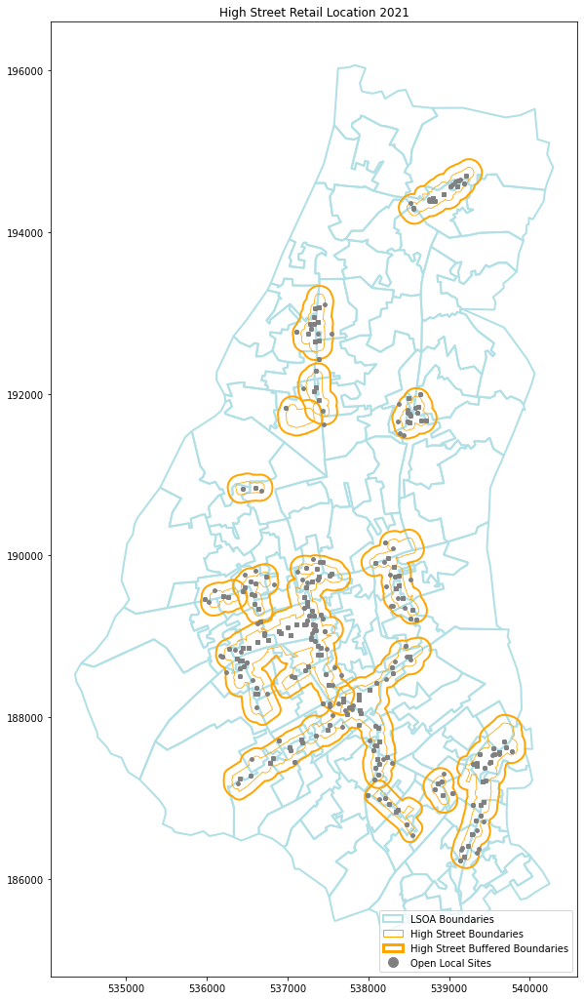

In [139]:
# plot and check 
fig, ax = plt.subplots(figsize=(18,18))

wf_lsoa.plot(ax=ax, facecolor='none', edgecolor='powderblue', linewidth=2)

wf_highstreet.plot(ax=ax, linewidth=0.8, edgecolor='orange', facecolor = 'none')

wf_highstreet_buffered.plot(ax=ax, linewidth=2, edgecolor='orange', facecolor = 'none')

wf_hs_retail21.plot(ax=ax, markersize=15, color = 'grey')

plt.title('High Street Retail Location 2021')

# add legend
ax.legend(handles=[lsoa_patch, highstreet_line1, highstreet_buffered, openlocal_patch], loc='lower right', bbox_to_anchor=(1, 0))

plt.show()

In [140]:
# get the dataframe with High Streets information and open local sites information
result_df2 = wf_hs_retail21[['highstreet_id', 'rates_code']]

result_df2 = result_df2.merge(wf_highstreet, on='highstreet_id', how='outer')

wf_highstreet_retail21 = wf_hs_retail21.merge(result_df2, on='rates_code', how='outer', suffixes=('', '*'))
wf_highstreet_retail21 = wf_highstreet_retail21.filter(regex='^[^*]*$')

# change column order
wf_highstreet_retail21.insert(7, 'rates_code', wf_highstreet_retail21.pop('rates_code'))

# drop index_right
wf_highstreet_retail21 = wf_highstreet_retail21.drop(columns=['index_right'])

wf_highstreet_retail21.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 2660 entries, 0 to 2659
Data columns (total 35 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   rates_authority_id    2660 non-null   object        
 1   rates_authority       2660 non-null   object        
 2   region                2660 non-null   object        
 3   location_code         2660 non-null   object        
 4   address_no            2660 non-null   object        
 5   address_street        2644 non-null   object        
 6   address_town          2660 non-null   object        
 7   rates_code            2660 non-null   object        
 8   pc__pcs               2660 non-null   object        
 9   use_category          2660 non-null   object        
 10  scat_code             2660 non-null   object        
 11  sub_category          2660 non-null   object        
 12  category              2660 non-null   object        
 13  floor_area

In [141]:
wf_highstreet_retail21.head()

,rates_authority_id,rates_authority,region,location_code,address_no,address_street,address_town,rates_code,pc__pcs,use_category,...,pcds,lat,long,geometry,highstreet_id,highstreet_name,area_ha,gdb_geomattr_data,BoroughNM,LAD11CD
0,E09000031,Waltham Forest,Outer London - East and North East,47812057,734,HIGH ROAD LEYTONSTONE,LONDON,00000004803598,E11 3AW,Restaurants,...,E11 3AW,51.570207,0.01435,POINT (539700.864 187626.274),503,"Leytonstone High Road, Leytonstone.",37.861426,None,Waltham Forest,E09000031
1,E09000031,Waltham Forest,Outer London - East and North East,2100693000,O'NEILLS 762,HIGH ROAD LEYTONSTONE,LONDON,00000004803738,E11 3AW,Public Houses/Pub Restaurants (National Scheme),...,E11 3AW,51.570207,0.01435,POINT (539700.864 187626.274),503,"Leytonstone High Road, Leytonstone.",37.861426,None,Waltham Forest,E09000031
2,E09000031,Waltham Forest,Outer London - East and North East,47817057,740,HIGH ROAD LEYTONSTONE,LONDON,00000004808549,E11 3AW,Shops,...,E11 3AW,51.570207,0.01435,POINT (539700.864 187626.274),503,"Leytonstone High Road, Leytonstone.",37.861426,None,Waltham Forest,E09000031
3,E09000031,Waltham Forest,Outer London - East and North East,256471057,748,HIGH ROAD LEYTONSTONE,LONDON,00000004808708,E11 3AW,Restaurants,...,E11 3AW,51.570207,0.01435,POINT (539700.864 187626.274),503,"Leytonstone High Road, Leytonstone.",37.861426,None,Waltham Forest,E09000031
4,E09000031,Waltham Forest,Outer London - East and North East,333579000,740 A AND C,HIGH ROAD LEYTONSTONE,LONDON,00000004808731,E11 3AW,Shops,...,E11 3AW,51.570207,0.01435,POINT (539700.864 187626.274),503,"Leytonstone High Road, Leytonstone.",37.861426,None,Waltham Forest,E09000031


##### Composition Distribution

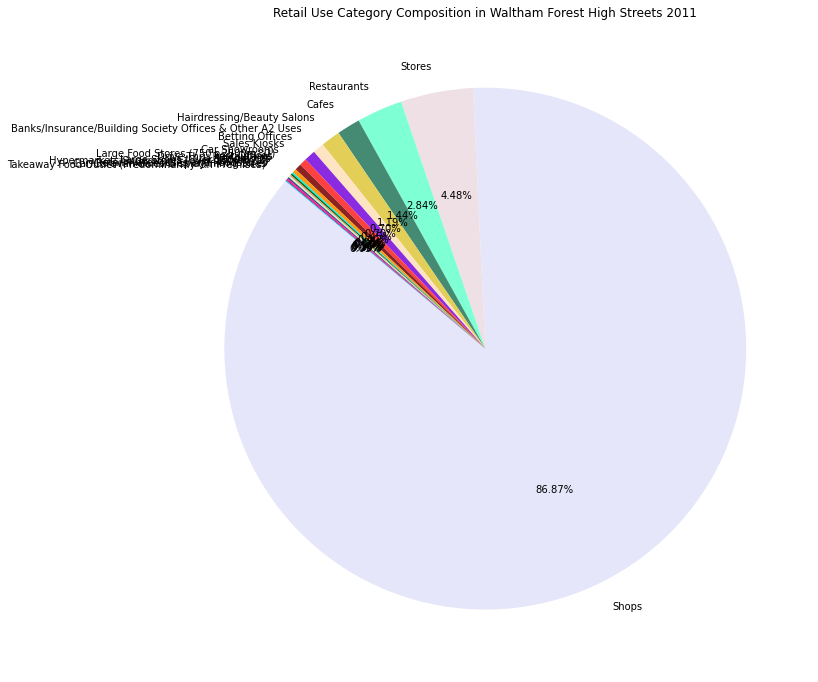

The number of each retail category: 
Shops                                                       1746
Stores                                                        90
Restaurants                                                   57
Cafes                                                         29
Hairdressing/Beauty Salons                                    24
Banks/Insurance/Building Society Offices & Other A2 Uses      14
Betting Offices                                               14
Sales Kiosks                                                   9
Car Showrooms                                                  8
Large Food Stores (750 - 2500m^2)                              5
Post Offices                                                   2
Drive-Thru Restaurants                                         2
Showrooms                                                      2
Large Shops (Over 1850m^2)                                     2
Hypermarkets/Superstores (over 2500m^2)              

In [142]:
# Count the number of each retail lcategory
wf11_hs_retail_counts = wf_hs_retail11['use_category'].value_counts()

# Calculate the proportion of each category
wf11_hs_retail_percentages = wf11_hs_retail_counts / wf11_hs_retail_counts.sum()

# bar chart
plt.figure(figsize=(12, 12))
colors25 = ['#E6E6FA', '#EEE0E5', '#7FFFD4', '#458B74',  '#E3CF57', '#FFE4C4',
            '#8A2BE2', '#FF4040', '#8B2323', '#FF9912', '#00EEEE', '#006400', '#E9967A',
            '#C1FFC1', '#483D8B', '#FF1493', '#8B0A50', '#00BFFF', '#00688B', '#696969',
            '#104E8B', '#030303', '#B0B0B0', '#838B83', '#CD6090', '#8B3A62', '#F0E68C']
plt.pie(wf11_hs_retail_counts, labels=wf11_hs_retail_counts.index, autopct='%.2f%%', startangle=140, colors = colors25)
plt.title('Retail Use Category Composition in Waltham Forest High Streets 2011')
plt.show()

print("The number of each retail category: ")
print(wf11_hs_retail_counts)

print("The proportion of each retail category:")
print(wf11_hs_retail_counts)

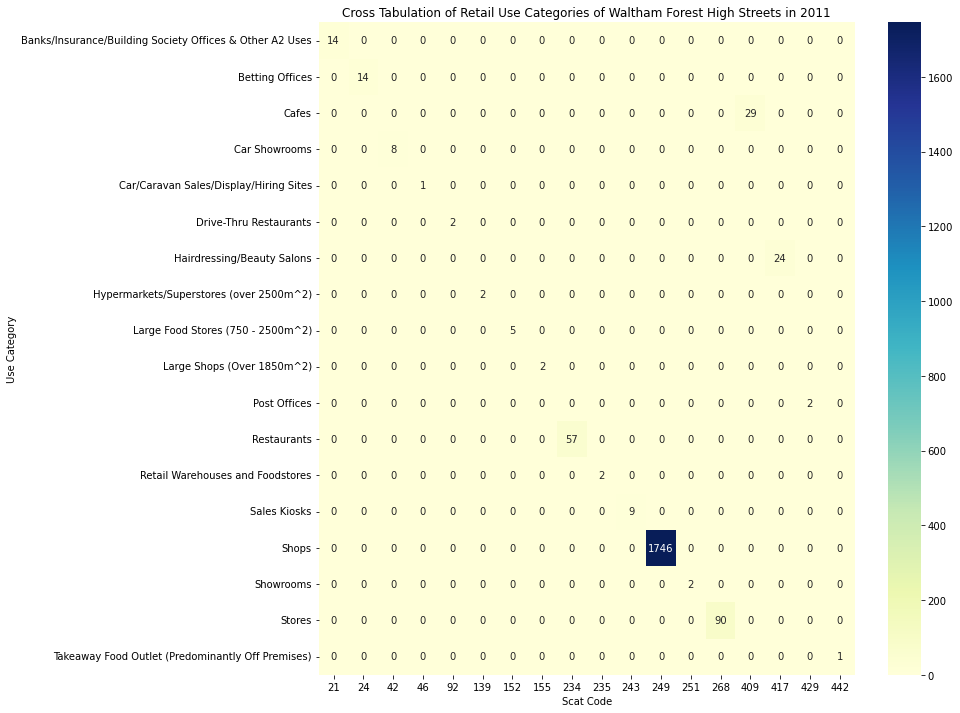

In [143]:
cross_tab_wf_hs11 = pd.crosstab(index=wf_hs_retail11['use_category'], columns=wf_hs_retail11['scat_code'])

# plot
plt.figure(figsize=(12, 12))
sns.heatmap(cross_tab_wf_hs11, annot=True, fmt='d', cmap='YlGnBu') 
plt.title('Cross Tabulation of Retail Use Categories of Waltham Forest High Streets in 2011')
plt.xlabel('Scat Code')
plt.ylabel('Use Category')
plt.show()

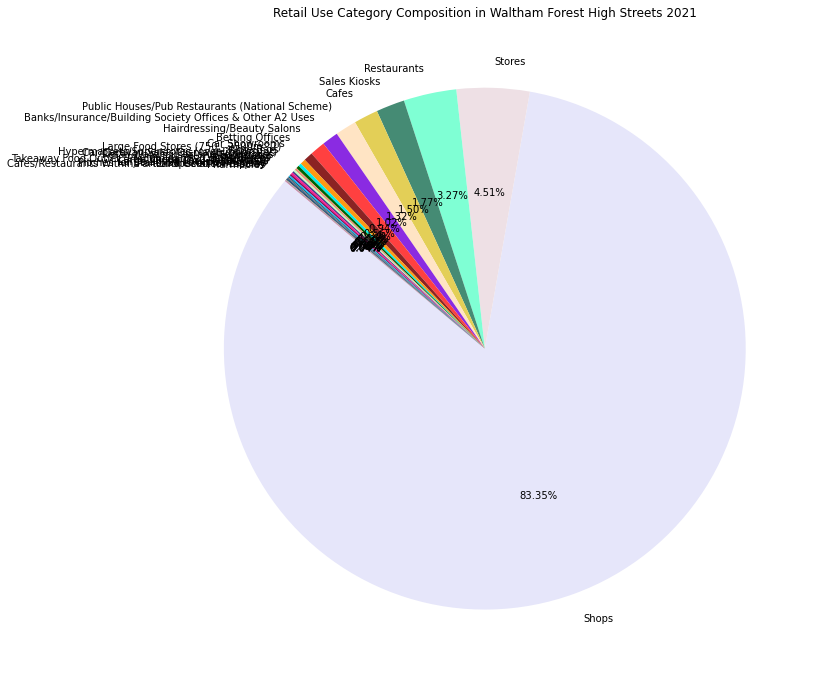

The number of each retail category: 
Shops                                                       2217
Stores                                                       120
Restaurants                                                   87
Sales Kiosks                                                  47
Cafes                                                         40
Public Houses/Pub Restaurants (National Scheme)               35
Banks/Insurance/Building Society Offices & Other A2 Uses      27
Hairdressing/Beauty Salons                                    25
Betting Offices                                               15
Car Showrooms                                                  9
Large Food Stores (750 - 2500m^2)                              5
Wine Bars                                                      5
Hypermarkets/Superstores (over 2500m^2)                        4
Car/Caravan Sales/Display/Hiring Sites                         3
Retail Warehouses and Foodstores                     

In [144]:
# Count the number of each retail lcategory
wf21_hs_retail_counts = wf_hs_retail21['use_category'].value_counts()

# Calculate the proportion of each category
wf21_hs_retail_percentages = wf21_hs_retail_counts / wf21_hs_retail_counts.sum()

# bar chart
plt.figure(figsize=(12, 12))
plt.pie(wf21_hs_retail_counts, labels=wf21_hs_retail_counts.index, autopct='%.2f%%', startangle=140, colors = colors25)
plt.title('Retail Use Category Composition in Waltham Forest High Streets 2021')
plt.show()

print("The number of each retail category: ")
print(wf21_hs_retail_counts)

print("The proportion of each retail category:")
print(wf21_hs_retail_counts)

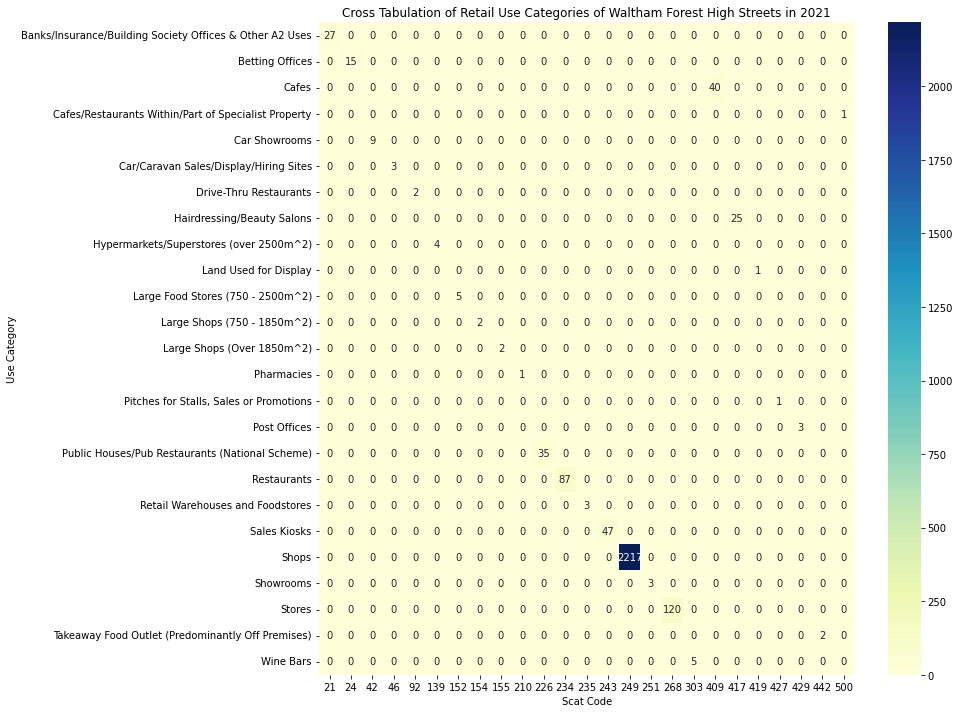

In [145]:
cross_tab_wf_hs21 = pd.crosstab(index=wf_hs_retail21['use_category'], columns=wf_hs_retail21['scat_code'])

# plot
plt.figure(figsize=(12, 12))
sns.heatmap(cross_tab_wf_hs21, annot=True, fmt='d', cmap='YlGnBu') 
plt.title('Cross Tabulation of Retail Use Categories of Waltham Forest High Streets in 2021')
plt.xlabel('Scat Code')
plt.ylabel('Use Category')
plt.show()

In [146]:
cross_tab_changes_wf_hs = cross_tab_wf_hs21.copy()
cross_tab_changes_wf_hs.update(cross_tab_wf_hs21 - cross_tab_wf_hs11)

# check if thereare NA value
has_na = cross_tab_changes_wf_hs.isna().any().any()

if has_na:
    print("cross tab has NaN values")
else:
    print("cross tab has no NaN values")

cross tab has no NaN values


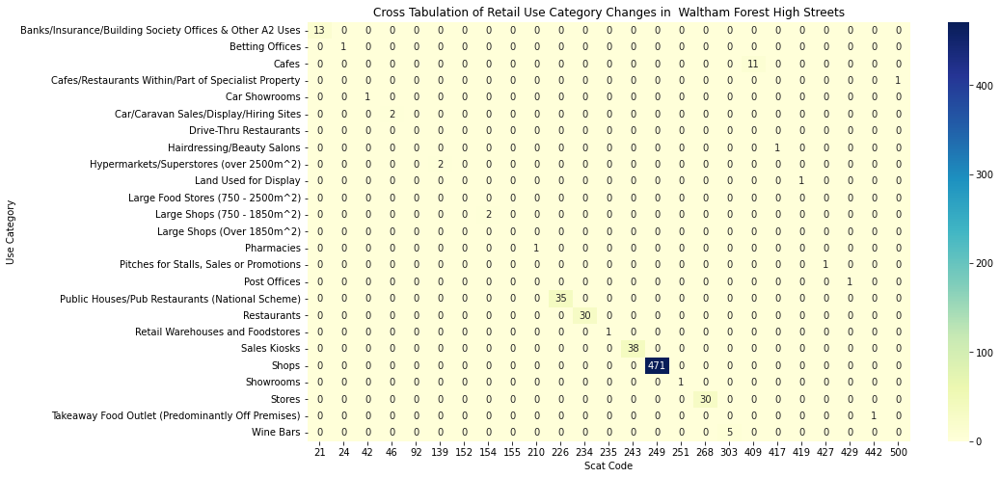

In [147]:
cross_tab_changes_wf_hs = cross_tab_changes_wf_hs.astype(int)

# plot
plt.figure(figsize=(14, 8))
sns.heatmap(cross_tab_changes_wf_hs, annot=True, fmt='d', cmap='YlGnBu') 
plt.title('Cross Tabulation of Retail Use Category Changes in  Waltham Forest High Streets')
plt.xlabel('Scat Code')
plt.ylabel('Use Category')
plt.show() 

In [148]:
negative_count = (cross_tab_changes_wf_hs < 0).sum().sum()
print("Number of negative values:", negative_count)

Number of negative values: 0


<Figure size 1440x720 with 0 Axes>

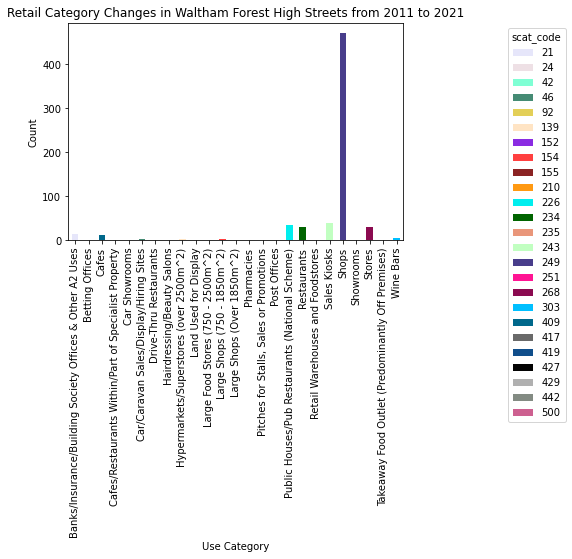

In [149]:
# Extract non-zero items
non_zero_cross_tab_wf_hs = cross_tab_changes_wf_hs[cross_tab_changes_wf_hs != 0]

# plot bar chart
plt.figure(figsize=(20, 10))

non_zero_cross_tab_wf_hs.plot(kind='bar', stacked=True, color=colors25)
plt.title('Retail Category Changes in Waltham Forest High Streets from 2011 to 2021')
plt.xlabel('Use Category')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.legend(title='scat_code', loc='upper right', bbox_to_anchor=(1.5, 1))

plt.show()

In [150]:
top_category_changes_hs = non_zero_cross_tab_wf_hs.stack().nlargest(10)
top_10_values_hs = top_category_changes_hs.values
top_10_index_hs = top_category_changes_hs.index

top_10_index_hs

MultiIndex([(                                                   'Shops', 249),
            (                                            'Sales Kiosks', 243),
            (         'Public Houses/Pub Restaurants (National Scheme)', 226),
            (                                             'Restaurants', 234),
            (                                                  'Stores', 268),
            ('Banks/Insurance/Building Society Offices & Other A2 Uses',  21),
            (                                                   'Cafes', 409),
            (                                               'Wine Bars', 303),
            (                  'Car/Caravan Sales/Display/Hiring Sites',  46),
            (                 'Hypermarkets/Superstores (over 2500m^2)', 139)],
           names=['use_category', 'scat_code'])

In [151]:
top_10_values_hs

array([471.,  38.,  35.,  30.,  30.,  13.,  11.,   5.,   2.,   2.])

Categoties changing ranks are slightly different with the one we analyse before

Here, the top 10 categories are :
'Shops', 'Sales Kiosks', 'Public Public Houses/Pub Restaurants (National Scheme)', 'Restaurants', 'Stores',

'Banks/Insurance/Building Society Offices & Other A2 Uses',  'Cafes', 'Wine Bars', 'Car/Caravan Sales/Display/Hiring Sites', 

'Hypermarkets/Superstores (over 2500m^2)'

In [152]:
categories_extract = ['Shops', 'Sales Kiosks', 'Public Houses/Pub Restaurants (National Scheme)', 'Restaurants', 'Stores',
                      'Banks/Insurance/Building Society Offices & Other A2 Uses', 'Cafes', 'Wine Bars', 'Car/Caravan Sales/Display/Hiring Sites',
                      'Hypermarkets/Superstores (over 2500m^2)']

filtered_category = non_zero_cross_tab_wf_hs.loc[categories_extract]
# Extract all non-NaN values of cross_tab
filtered_category_no_nan = filtered_category.stack() # series
# Turn series to dataframe
filtered_category_no_nan = filtered_category_no_nan.reset_index()
filtered_category_no_nan = filtered_category_no_nan.rename(columns={0: 'changes_count'})

top10category = pd.DataFrame(filtered_category_no_nan, columns=['index', 'use_category', 'scat_code', 'changes_count'])

<Figure size 1152x576 with 0 Axes>

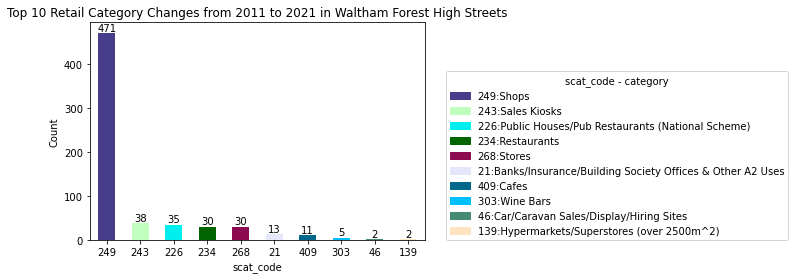

In [153]:
plt.figure(figsize=(16, 8))

# Plot the histogram

# pie chart
colors10 = ['#483D8B', '#C1FFC1', '#00EEEE', '#006400', '#8B0A50', '#E6E6FA', '#00688B', '#00BFFF', '#458B74', '#FFE4C4']
# Plot the histogram
ax = top10category.plot(x='scat_code', y='changes_count', kind='bar', stacked=True, color=colors10)

# Add labels to the bars
for p in ax.patches:
    ax.annotate(str(int(p.get_height())), (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 5), textcoords='offset points')

plt.title('Top 10 Retail Category Changes from 2011 to 2021 in Waltham Forest High Streets')
plt.xlabel('scat_code')
plt.ylabel('Count')
plt.xticks(rotation=0)

# Create legend handles and labels using scat_code values and colors
legend_labels = top10category['scat_code'].unique()
legend_handles = [mpatches.Patch(color=color, label=f"{label}:{category}") for label, color, category in zip(legend_labels, colors10, top10category['use_category'])]

# Add the custom legend to the plot
ax.legend(handles=legend_handles, title='scat_code - category', loc='upper right', bbox_to_anchor=(2.1, 0.8))

plt.show()

##### Duration Changes

'status_duration'

less than 1 year : <365

1 - 3 years: 365, 1095

3 - 5 years: 1095, 1825

5 - 10 years: 1825, 3650

more than 10 years: >=3650

First check the 'status'

In [154]:
status_counts11 = wf_highstreet_retail11.groupby(['highstreet_id', 'status']).size().reset_index(name='counts')
status_counts11

,highstreet_id,status,counts
0,237,True,11
1,244,True,32
2,249,True,3
3,250,True,54
4,252,True,145
5,253,True,60
6,257,False,1
7,257,True,34
8,397,True,87
9,466,False,1


In [155]:
status_counts21 = wf_highstreet_retail21.groupby(['highstreet_id', 'status']).size().reset_index(name='counts')
status_counts21

,highstreet_id,status,counts
0,237,True,14
1,244,False,1
2,244,True,57
3,249,False,1
4,249,True,3
5,250,False,2
6,250,True,64
7,252,False,12
8,252,True,163
9,253,False,1


Check column 'status_duration'

In [156]:
# count the number of NaN values in column 'status_duration'
duration_nan_count11 = wf_highstreet_retail11['status_duration'].isna().sum()

duration_nan_count11

1702

In [157]:
# count the number of NaN values in column 'status_duration'
duration_nan_count21 = wf_highstreet_retail21['status_duration'].isna().sum()

duration_nan_count21

1239

Before processing the column, we calculate date difference and fill in the missing status_duration column

In [158]:
# Calculate date difference and fill in the missing status_duration column
wf_highstreet_retail11['status_duration'] = (wf_highstreet_retail11['period'] - wf_highstreet_retail11['status_date']).dt.days

wf_highstreet_retail11.sample(6)

,rates_authority_id,rates_authority,region,location_code,address_no,address_street,address_town,rates_code,pc__pcs,use_category,...,pcds,lat,long,geometry,highstreet_id,highstreet_name,area_ha,gdb_geomattr_data,BoroughNM,LAD11CD
743,E09000031,Waltham Forest,Outer London - East and North East,8684289000,GND F 384-388,HOE STREET,LONDON,00000004892638,E17 9AA,Shops,...,E17 9AA,51.577666,-0.017043,POINT (537502.880 188396.272),508,"High Street/Hoe Street, Walthamstow",95.428617,None,Waltham Forest,E09000031
1263,E09000031,Waltham Forest,Outer London - East and North East,56538057,618,LEA BRIDGE ROAD,LONDON,00000005379675,E10 6AS,Banks/Insurance/Building Society Offices & Oth...,...,E10 6AS,51.575341,-0.012640,POINT (537814.980 188146.009),609,"Lea Bridge Road/High Road, Leyton",67.408489,None,Waltham Forest,E09000031
1556,E09000031,Waltham Forest,Outer London - East and North East,19352057,64,CHINGFORD MOUNT ROAD,LONDON,00000002565631,E4 9AA,Shops,...,E4 9AA,51.610822,-0.017763,POINT (537353.008 192081.975),250,"Chingford Mount Road, Walthamstow.",9.698066,None,Waltham Forest,E09000031
1641,E09000031,Waltham Forest,Outer London - East and North East,2834953000,243,WOOD STREET,LONDON,00000008947636,E17 3LL,Shops,...,E17 3LL,51.588511,-0.003937,POINT (538378.031 189626.977),507,"Wood Street, Wood Street.",21.766876,None,Waltham Forest,E09000031
10,E09000031,Waltham Forest,Outer London - East and North East,17779057,2,CHERRYDOWN AVENUE,LONDON,00000002477093,E4 8DP,Shops,...,E4 8DP,51.617904,-0.018596,POINT (537273.980 192867.955),252,"Old Church Road, Chingford.",13.973184,None,Waltham Forest,E09000031
543,E09000031,Waltham Forest,Outer London - East and North East,49870057,478,HOE STREET,LONDON,00000004893522,E17 9AH,Shops,...,E17 9AH,51.575797,-0.014454,POINT (537687.909 188193.302),508,"High Street/Hoe Street, Walthamstow",95.428617,None,Waltham Forest,E09000031


In [159]:
# Classify open local retail location data according to the duration
duration_bins = [0, 365, 1095, 1825, 3650, float('inf')]
duration_labels = ['less_than_1year', '1_to_3yrs', '3_to_5yrs', '5_to_10yrs', 'more_than_10yrs']

# create new column for this category
wf_highstreet_retail11['duration_category'] = pd.cut(wf_highstreet_retail11['status_duration'], bins=duration_bins, labels=duration_labels)

wf_highstreet_retail11.head()

,rates_authority_id,rates_authority,region,location_code,address_no,address_street,address_town,rates_code,pc__pcs,use_category,...,lat,long,geometry,highstreet_id,highstreet_name,area_ha,gdb_geomattr_data,BoroughNM,LAD11CD,duration_category
0,E09000031,Waltham Forest,Outer London - East and North East,185965057,1 & 2,ALBERT CRESCENT,LONDON,00000001087017,E4 6SH,Shops,...,51.617346,-0.018464,POINT (537284.800 192806.151),252,"Old Church Road, Chingford.",13.973184,None,Waltham Forest,E09000031,1_to_3yrs
1,E09000031,Waltham Forest,Outer London - East and North East,202328057,4,ALBERT CRESCENT,LONDON,00000001087036,E4 6SH,Shops,...,51.617346,-0.018464,POINT (537284.800 192806.151),252,"Old Church Road, Chingford.",13.973184,None,Waltham Forest,E09000031,more_than_10yrs
2,E09000031,Waltham Forest,Outer London - East and North East,1126057,5,ALBERT CRESCENT,LONDON,0000000108704B,E4 6SH,Shops,...,51.617346,-0.018464,POINT (537284.800 192806.151),252,"Old Church Road, Chingford.",13.973184,None,Waltham Forest,E09000031,less_than_1year
3,E09000031,Waltham Forest,Outer London - East and North East,1122057,10,ALBERT CRESCENT,LONDON,00000001087089,E4 6SH,Shops,...,51.617346,-0.018464,POINT (537284.800 192806.151),252,"Old Church Road, Chingford.",13.973184,None,Waltham Forest,E09000031,5_to_10yrs
4,E09000031,Waltham Forest,Outer London - East and North East,202329057,3,ALBERT CRESCENT,LONDON,0000000108711B,E4 6SH,Shops,...,51.617346,-0.018464,POINT (537284.800 192806.151),252,"Old Church Road, Chingford.",13.973184,None,Waltham Forest,E09000031,less_than_1year


In [160]:
# Convert date column to datetime type
wf_highstreet_retail21['status_date'] = pd.to_datetime(wf_highstreet_retail21['status_date'])
wf_highstreet_retail21['period'] = pd.to_datetime(wf_highstreet_retail21['period'])

# Calculate date difference and fill in the missing status_duration column
wf_highstreet_retail21['status_duration'] = (wf_highstreet_retail21['period'] - wf_highstreet_retail21['status_date']).dt.days

# Classify open local retail location data according to the duration
# duration_bins = [0, 365, 1095, 1825, 3650, float('inf')]
# duration_labels = ['less_than_1year', '1_to_3yrs', '3_to_5yrs', '5_to_1oyrs', 'more_than_10yrs']

# create new column for this category
wf_highstreet_retail21['duration_category'] = pd.cut(wf_highstreet_retail21['status_duration'], bins=duration_bins, labels=duration_labels)

wf_highstreet_retail21.head()

,rates_authority_id,rates_authority,region,location_code,address_no,address_street,address_town,rates_code,pc__pcs,use_category,...,lat,long,geometry,highstreet_id,highstreet_name,area_ha,gdb_geomattr_data,BoroughNM,LAD11CD,duration_category
0,E09000031,Waltham Forest,Outer London - East and North East,47812057,734,HIGH ROAD LEYTONSTONE,LONDON,00000004803598,E11 3AW,Restaurants,...,51.570207,0.01435,POINT (539700.864 187626.274),503,"Leytonstone High Road, Leytonstone.",37.861426,None,Waltham Forest,E09000031,3_to_5yrs
1,E09000031,Waltham Forest,Outer London - East and North East,2100693000,O'NEILLS 762,HIGH ROAD LEYTONSTONE,LONDON,00000004803738,E11 3AW,Public Houses/Pub Restaurants (National Scheme),...,51.570207,0.01435,POINT (539700.864 187626.274),503,"Leytonstone High Road, Leytonstone.",37.861426,None,Waltham Forest,E09000031,more_than_10yrs
2,E09000031,Waltham Forest,Outer London - East and North East,47817057,740,HIGH ROAD LEYTONSTONE,LONDON,00000004808549,E11 3AW,Shops,...,51.570207,0.01435,POINT (539700.864 187626.274),503,"Leytonstone High Road, Leytonstone.",37.861426,None,Waltham Forest,E09000031,more_than_10yrs
3,E09000031,Waltham Forest,Outer London - East and North East,256471057,748,HIGH ROAD LEYTONSTONE,LONDON,00000004808708,E11 3AW,Restaurants,...,51.570207,0.01435,POINT (539700.864 187626.274),503,"Leytonstone High Road, Leytonstone.",37.861426,None,Waltham Forest,E09000031,3_to_5yrs
4,E09000031,Waltham Forest,Outer London - East and North East,333579000,740 A AND C,HIGH ROAD LEYTONSTONE,LONDON,00000004808731,E11 3AW,Shops,...,51.570207,0.01435,POINT (539700.864 187626.274),503,"Leytonstone High Road, Leytonstone.",37.861426,None,Waltham Forest,E09000031,3_to_5yrs


In [161]:
duration11 = wf_highstreet_retail11.groupby(['highstreet_id', 'duration_category']).size().reset_index(name='count')
duration11.head(10)

,highstreet_id,duration_category,count
0,237,less_than_1year,8
1,237,1_to_3yrs,0
2,237,3_to_5yrs,1
3,237,5_to_10yrs,2
4,237,more_than_10yrs,0
5,244,less_than_1year,27
6,244,1_to_3yrs,3
7,244,3_to_5yrs,0
8,244,5_to_10yrs,1
9,244,more_than_10yrs,0


In [162]:
duration11.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70 entries, 0 to 69
Data columns (total 3 columns):
 #   Column             Non-Null Count  Dtype   
---  ------             --------------  -----   
 0   highstreet_id      70 non-null     int64   
 1   duration_category  70 non-null     category
 2   count              70 non-null     int64   
dtypes: category(1), int64(2)
memory usage: 1.5 KB


In [163]:
duration21 = wf_highstreet_retail21.groupby(['highstreet_id', 'duration_category']).size().reset_index(name='count')

duration21.head(10)

,highstreet_id,duration_category,count
0,237,less_than_1year,0
1,237,1_to_3yrs,1
2,237,3_to_5yrs,8
3,237,5_to_10yrs,2
4,237,more_than_10yrs,3
5,244,less_than_1year,1
6,244,1_to_3yrs,5
7,244,3_to_5yrs,38
8,244,5_to_10yrs,8
9,244,more_than_10yrs,6


In [164]:
duration = duration21.copy()
duration['count'].update(duration21['count'] - duration11['count'])
duration

,highstreet_id,duration_category,count
0,237,less_than_1year,-8
1,237,1_to_3yrs,1
2,237,3_to_5yrs,7
3,237,5_to_10yrs,0
4,237,more_than_10yrs,3
...,...,...,...
65,609,less_than_1year,-273
66,609,1_to_3yrs,55
67,609,3_to_5yrs,310
68,609,5_to_10yrs,45


In [165]:
duration_changes = duration.pivot_table(values='count', index='highstreet_id', columns='duration_category', aggfunc='sum')
duration_changes = duration_changes.reset_index()
duration_changes = duration_changes.rename_axis('index', axis=1)
duration_changes

index,highstreet_id,less_than_1year,1_to_3yrs,3_to_5yrs,5_to_10yrs,more_than_10yrs
0,237,-8,1,7,0,3
1,244,-26,2,38,7,6
2,249,-1,0,1,0,1
3,250,-43,8,35,6,6
4,252,-101,17,74,19,21
5,253,-50,2,43,3,3
6,257,-27,7,19,2,3
7,397,-65,12,69,14,6
8,466,-40,5,37,5,0
9,503,-174,31,166,16,31


In [166]:
#duration_changes['highstreet_id'] = duration_changes['highstreet_id'].astype('object')
duration_changes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14 entries, 0 to 13
Data columns (total 6 columns):
 #   Column           Non-Null Count  Dtype
---  ------           --------------  -----
 0   highstreet_id    14 non-null     int64
 1   less_than_1year  14 non-null     int64
 2   1_to_3yrs        14 non-null     int64
 3   3_to_5yrs        14 non-null     int64
 4   5_to_10yrs       14 non-null     int64
 5   more_than_10yrs  14 non-null     int64
dtypes: int64(6)
memory usage: 800.0 bytes


##### Composition Change

Select out the top 10 changed cateogries lists for retail 2011 and 2021 in the HIGH STREETS

scat_code = 249, 243, 226, 234, 268, 21, 409, 303, 46, 139

In [167]:
selected_scat_codes = [249, 243, 226, 234, 268, 21, 409, 303, 46, 139]

wf_hs_topretail11 = wf_highstreet_retail11[wf_highstreet_retail11['scat_code'].isin(selected_scat_codes)]

wf_hs_topretail11.head()

,rates_authority_id,rates_authority,region,location_code,address_no,address_street,address_town,rates_code,pc__pcs,use_category,...,lat,long,geometry,highstreet_id,highstreet_name,area_ha,gdb_geomattr_data,BoroughNM,LAD11CD,duration_category
0,E09000031,Waltham Forest,Outer London - East and North East,185965057,1 & 2,ALBERT CRESCENT,LONDON,00000001087017,E4 6SH,Shops,...,51.617346,-0.018464,POINT (537284.800 192806.151),252,"Old Church Road, Chingford.",13.973184,None,Waltham Forest,E09000031,1_to_3yrs
1,E09000031,Waltham Forest,Outer London - East and North East,202328057,4,ALBERT CRESCENT,LONDON,00000001087036,E4 6SH,Shops,...,51.617346,-0.018464,POINT (537284.800 192806.151),252,"Old Church Road, Chingford.",13.973184,None,Waltham Forest,E09000031,more_than_10yrs
2,E09000031,Waltham Forest,Outer London - East and North East,1126057,5,ALBERT CRESCENT,LONDON,0000000108704B,E4 6SH,Shops,...,51.617346,-0.018464,POINT (537284.800 192806.151),252,"Old Church Road, Chingford.",13.973184,None,Waltham Forest,E09000031,less_than_1year
3,E09000031,Waltham Forest,Outer London - East and North East,1122057,10,ALBERT CRESCENT,LONDON,00000001087089,E4 6SH,Shops,...,51.617346,-0.018464,POINT (537284.800 192806.151),252,"Old Church Road, Chingford.",13.973184,None,Waltham Forest,E09000031,5_to_10yrs
4,E09000031,Waltham Forest,Outer London - East and North East,202329057,3,ALBERT CRESCENT,LONDON,0000000108711B,E4 6SH,Shops,...,51.617346,-0.018464,POINT (537284.800 192806.151),252,"Old Church Road, Chingford.",13.973184,None,Waltham Forest,E09000031,less_than_1year


In [168]:
wf_hs_topretail21 = wf_highstreet_retail21[wf_highstreet_retail21['scat_code'].isin(selected_scat_codes)]

wf_hs_topretail21.head()

,rates_authority_id,rates_authority,region,location_code,address_no,address_street,address_town,rates_code,pc__pcs,use_category,...,lat,long,geometry,highstreet_id,highstreet_name,area_ha,gdb_geomattr_data,BoroughNM,LAD11CD,duration_category
0,E09000031,Waltham Forest,Outer London - East and North East,47812057,734,HIGH ROAD LEYTONSTONE,LONDON,00000004803598,E11 3AW,Restaurants,...,51.570207,0.01435,POINT (539700.864 187626.274),503,"Leytonstone High Road, Leytonstone.",37.861426,None,Waltham Forest,E09000031,3_to_5yrs
1,E09000031,Waltham Forest,Outer London - East and North East,2100693000,O'NEILLS 762,HIGH ROAD LEYTONSTONE,LONDON,00000004803738,E11 3AW,Public Houses/Pub Restaurants (National Scheme),...,51.570207,0.01435,POINT (539700.864 187626.274),503,"Leytonstone High Road, Leytonstone.",37.861426,None,Waltham Forest,E09000031,more_than_10yrs
2,E09000031,Waltham Forest,Outer London - East and North East,47817057,740,HIGH ROAD LEYTONSTONE,LONDON,00000004808549,E11 3AW,Shops,...,51.570207,0.01435,POINT (539700.864 187626.274),503,"Leytonstone High Road, Leytonstone.",37.861426,None,Waltham Forest,E09000031,more_than_10yrs
3,E09000031,Waltham Forest,Outer London - East and North East,256471057,748,HIGH ROAD LEYTONSTONE,LONDON,00000004808708,E11 3AW,Restaurants,...,51.570207,0.01435,POINT (539700.864 187626.274),503,"Leytonstone High Road, Leytonstone.",37.861426,None,Waltham Forest,E09000031,3_to_5yrs
4,E09000031,Waltham Forest,Outer London - East and North East,333579000,740 A AND C,HIGH ROAD LEYTONSTONE,LONDON,00000004808731,E11 3AW,Shops,...,51.570207,0.01435,POINT (539700.864 187626.274),503,"Leytonstone High Road, Leytonstone.",37.861426,None,Waltham Forest,E09000031,3_to_5yrs


In [169]:
composition11 = wf_hs_topretail11.groupby(['highstreet_id', 'scat_code']).size().reset_index(name='count')
composition11.head(10)

,highstreet_id,scat_code,count
0,237,249,9
1,237,409,1
2,244,249,29
3,244,268,1
4,244,409,1
5,249,249,3
6,250,234,1
7,250,249,45
8,250,268,2
9,250,409,2


In [170]:
#composition11['highstreet_id'] = composition11['highstreet_id'].astype('object')
composition11['scat_code'] = composition11['scat_code'].astype('object')

composition11.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52 entries, 0 to 51
Data columns (total 3 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   highstreet_id  52 non-null     int64 
 1   scat_code      52 non-null     object
 2   count          52 non-null     int64 
dtypes: int64(2), object(1)
memory usage: 1.3+ KB


In [171]:
composition21 = wf_hs_topretail21.groupby(['highstreet_id', 'scat_code']).size().reset_index(name='count')
#composition21['highstreet_id'] = composition21['highstreet_id'].astype('object')
composition21['scat_code'] = composition21['scat_code'].astype('object')

composition21.head(10)

,highstreet_id,scat_code,count
0,237,249,12
1,244,249,49
2,244,268,5
3,244,409,2
4,249,226,1
5,249,249,3
6,250,249,58
7,250,268,2
8,250,409,2
9,252,21,4


In [172]:
composition = composition21.copy()
composition['count'].update(composition21['count'] - composition11['count'])
composition.head(10)

,highstreet_id,scat_code,count
0,237,249,3
1,244,249,48
2,244,268,-24
3,244,409,1
4,249,226,0
5,249,249,0
6,250,249,57
7,250,268,-43
8,250,409,0
9,252,21,2


In [173]:
# Pivot the table
composition_changes = composition.pivot_table(index='highstreet_id', columns='scat_code', values='count', aggfunc='first')
# replace NaN with 0
composition_changes.fillna(0, inplace=True)

# Flatten the multi-level index of DataFrame 2
composition_changes.columns = composition_changes.columns.astype(str)
#composition_changes.index = composition_changes.index.astype(str)
# Convert .columns from Index objects with names to plain Index objects
composition_changes.columns.name = None
composition_changes.columns = composition_changes.columns.tolist()
composition_changes.reset_index(inplace=True)

composition_changes

,highstreet_id,21,46,139,226,234,243,249,268,303,409
0,237,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0
1,244,0.0,0.0,0.0,0.0,0.0,0.0,48.0,-24.0,0.0,1.0
2,249,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,250,0.0,0.0,0.0,0.0,0.0,0.0,57.0,-43.0,0.0,0.0
4,252,2.0,0.0,-2.0,-4.0,-118.0,0.0,145.0,-51.0,0.0,0.0
5,253,0.0,0.0,0.0,0.0,-14.0,0.0,37.0,-1.0,0.0,0.0
6,257,0.0,0.0,0.0,-79.0,0.0,0.0,16.0,18.0,0.0,0.0
7,397,-33.0,0.0,0.0,1.0,0.0,-6.0,101.0,-189.0,-11.0,-2.0
8,466,0.0,-146.0,0.0,0.0,0.0,0.0,39.0,-4.0,-3.0,0.0
9,503,0.0,-17.0,0.0,4.0,-560.0,-20.0,232.0,11.0,-9.0,-1.0


In [174]:
#composition_changes['highstreet_id'] = composition_changes['highstreet_id'].astype('object')
composition_changes.iloc[:, 1:10] = composition_changes.iloc[:, 1:10].astype(int)

composition_changes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14 entries, 0 to 13
Data columns (total 11 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   highstreet_id  14 non-null     int64  
 1   21             14 non-null     int64  
 2   46             14 non-null     int64  
 3   139            14 non-null     int64  
 4   226            14 non-null     int64  
 5   234            14 non-null     int64  
 6   243            14 non-null     int64  
 7   249            14 non-null     int64  
 8   268            14 non-null     int64  
 9   303            14 non-null     int64  
 10  409            14 non-null     float64
dtypes: float64(1), int64(10)
memory usage: 1.3 KB


In [175]:
duration_changes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14 entries, 0 to 13
Data columns (total 6 columns):
 #   Column           Non-Null Count  Dtype
---  ------           --------------  -----
 0   highstreet_id    14 non-null     int64
 1   less_than_1year  14 non-null     int64
 2   1_to_3yrs        14 non-null     int64
 3   3_to_5yrs        14 non-null     int64
 4   5_to_10yrs       14 non-null     int64
 5   more_than_10yrs  14 non-null     int64
dtypes: int64(6)
memory usage: 800.0 bytes


In [176]:
are_equal = (composition_changes['highstreet_id'] == duration_changes['highstreet_id']).all()

# print
if are_equal:
    print("The A columns are equal.")
else:
    print("The A columns are not equal.")

The A columns are equal.


In [177]:
composition_duration = duration_changes.merge(composition_changes, on='highstreet_id', how='outer')

composition_duration

,highstreet_id,less_than_1year,1_to_3yrs,3_to_5yrs,5_to_10yrs,more_than_10yrs,21,46,139,226,234,243,249,268,303,409
0,237,-8,1,7,0,3,0,0,0,0,0,0,3,0,0,0.0
1,244,-26,2,38,7,6,0,0,0,0,0,0,48,-24,0,1.0
2,249,-1,0,1,0,1,0,0,0,0,0,0,0,0,0,0.0
3,250,-43,8,35,6,6,0,0,0,0,0,0,57,-43,0,0.0
4,252,-101,17,74,19,21,2,0,-2,-4,-118,0,145,-51,0,0.0
5,253,-50,2,43,3,3,0,0,0,0,-14,0,37,-1,0,0.0
6,257,-27,7,19,2,3,0,0,0,-79,0,0,16,18,0,0.0
7,397,-65,12,69,14,6,-33,0,0,1,0,-6,101,-189,-11,-2.0
8,466,-40,5,37,5,0,0,-146,0,0,0,0,39,-4,-3,0.0
9,503,-174,31,166,16,31,0,-17,0,4,-560,-20,232,11,-9,-1.0


In [178]:
# convert highstreet_id dtype to object at last
composition_duration['highstreet_id'] = composition_duration['highstreet_id'].astype('object')

composition_duration.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 14 entries, 0 to 13
Data columns (total 16 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   highstreet_id    14 non-null     object 
 1   less_than_1year  14 non-null     int64  
 2   1_to_3yrs        14 non-null     int64  
 3   3_to_5yrs        14 non-null     int64  
 4   5_to_10yrs       14 non-null     int64  
 5   more_than_10yrs  14 non-null     int64  
 6   21               14 non-null     int64  
 7   46               14 non-null     int64  
 8   139              14 non-null     int64  
 9   226              14 non-null     int64  
 10  234              14 non-null     int64  
 11  243              14 non-null     int64  
 12  249              14 non-null     int64  
 13  268              14 non-null     int64  
 14  303              14 non-null     int64  
 15  409              14 non-null     float64
dtypes: float64(1), int64(14), object(1)
memory usage: 1.9+ KB


##### Plot retail points with the top category changes & duration

In [179]:
category_counts11 = wf_hs_topretail11['duration_category'].value_counts()

print(category_counts11)

less_than_1year    1593
1_to_3yrs           135
more_than_10yrs     106
5_to_10yrs           76
3_to_5yrs            34
Name: duration_category, dtype: int64


In [180]:
category_counts21 = wf_hs_topretail21['duration_category'].value_counts()

print(category_counts21)

3_to_5yrs          1510
1_to_3yrs           391
more_than_10yrs     307
5_to_10yrs          298
less_than_1year      79
Name: duration_category, dtype: int64


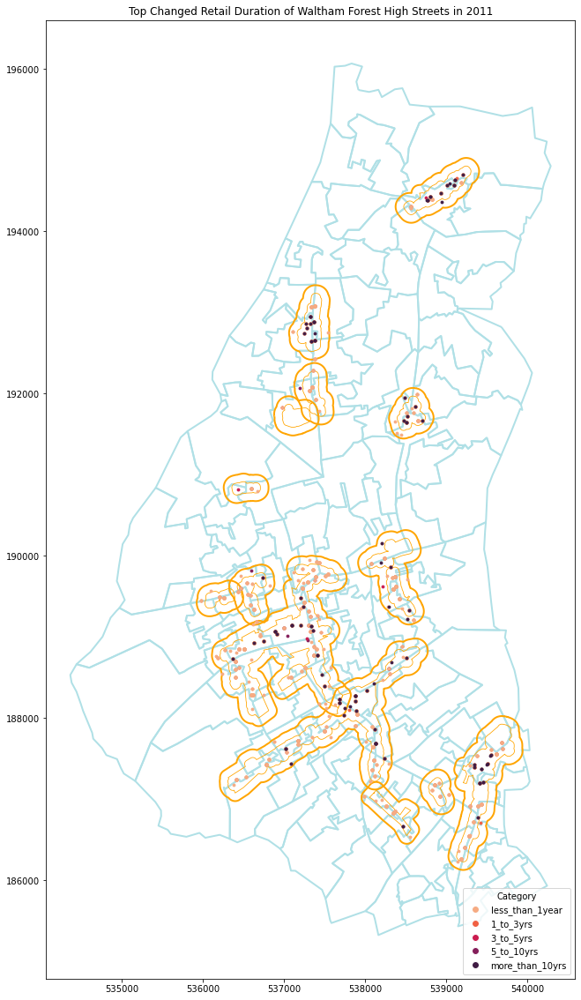

In [181]:
categories1 = set(category_counts11.index) | set(category_counts21.index)

# color and legend setting
color_palette = sns.color_palette(palette='rocket', n_colors=5)
color_mapping = {'less_than_1year': color_palette[4], '1_to_3yrs': color_palette[3], '3_to_5yrs': color_palette[2], 
                 '5_to_10yrs': color_palette[1], 'more_than_10yrs': color_palette[0]}

#legend_labels = list(color_mapping.keys())
legend_handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=8, label=label) for label, color in color_mapping.items()]


# plot and check - 2011
fig, ax = plt.subplots(figsize=(20,20))

wf_lsoa.plot(ax=ax, facecolor='none', edgecolor='powderblue', linewidth=2)

wf_highstreet.plot(ax=ax, linewidth=0.8, edgecolor='orange', facecolor = 'none')

wf_highstreet_buffered.plot(ax=ax, linewidth=2, edgecolor='orange', facecolor = 'none')

for category in categories1:
    color =color_mapping.get(category, 'gray') # default as gray 
    wf_hs_topretail11[wf_hs_topretail11['duration_category'] == category].plot(ax=ax, color=color, markersize=8, label=category)

plt.title('Top Changed Retail Duration of Waltham Forest High Streets in 2011')

# add legend
ax.legend(title='Category', loc='lower right', handles=legend_handles, bbox_to_anchor=(1, 0))

plt.show()

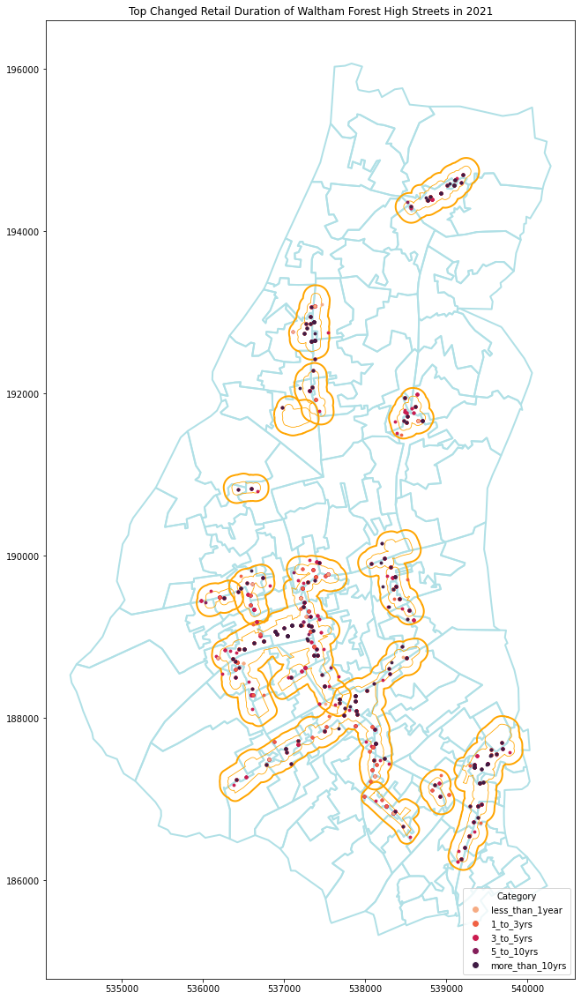

In [182]:
# plot and check - 2021
fig, ax = plt.subplots(figsize=(20,20))

wf_lsoa.plot(ax=ax, facecolor='none', edgecolor='powderblue', linewidth=2)

wf_highstreet.plot(ax=ax, linewidth=0.8, edgecolor='orange', facecolor = 'none')

wf_highstreet_buffered.plot(ax=ax, linewidth=2, edgecolor='orange', facecolor = 'none')

for category in categories1:
    color =color_mapping.get(category, 'gray') # default as gray 
    wf_hs_topretail21[wf_hs_topretail21['duration_category'] == category].plot(ax=ax, color=color, markersize=8, label=category)

plt.title('Top Changed Retail Duration of Waltham Forest High Streets in 2021')

# add legend
ax.legend(title='Category', loc='lower right', handles=legend_handles, bbox_to_anchor=(1, 0))

plt.show()

In [183]:
# wf_hs_topretail11['scat_code'] = wf_hs_topretail11['scat_code'].astype('category')
# wf_hs_topretail11['use_category'] = wf_hs_topretail11['use_category'].astype('category')

scat_counts11 = wf_hs_topretail11['scat_code'].value_counts()

print(scat_counts11)

249    1746
268      90
234      57
409      29
21       14
243       9
139       2
46        1
Name: scat_code, dtype: int64


In [184]:
# wf_hs_topretail21['scat_code'] = wf_hs_topretail21['scat_code'].astype('category')
# wf_hs_topretail21['use_category'] = wf_hs_topretail21['use_category'].astype('category')

scat_counts21 = wf_hs_topretail21['scat_code'].value_counts()

print(scat_counts21)

249    2217
268     120
234      87
243      47
409      40
226      35
21       27
303       5
139       4
46        3
Name: scat_code, dtype: int64


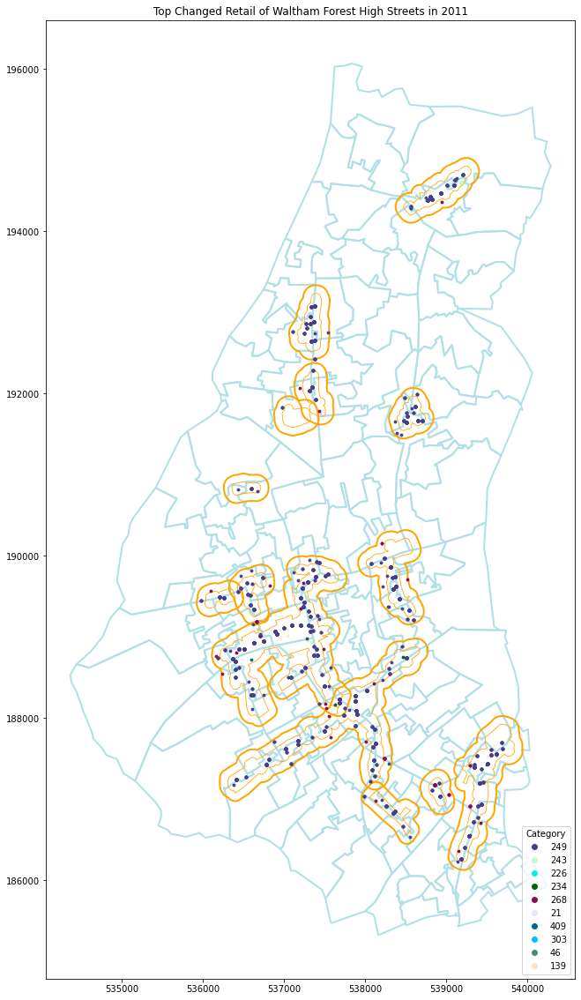

In [185]:
categories2 = set(scat_counts11.index) | set(scat_counts21.index)

# color and legend setting
color_mapping2 = {249: colors10[0], 243: colors10[1], 226: colors10[2], 234: colors10[3], 268: colors10[4],
                 21: colors10[5], 409: colors10[6], 303:colors10[7], 46:colors10[8], 139:colors10[9]}
legend_handles2 = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=8, label=label) for label, color in color_mapping2.items()]


# plot and check - 2011
fig, ax = plt.subplots(figsize=(20,20))

wf_lsoa.plot(ax=ax, facecolor='none', edgecolor='powderblue', linewidth=2)

wf_highstreet.plot(ax=ax, linewidth=0.8, edgecolor='orange', facecolor = 'none')

wf_highstreet_buffered.plot(ax=ax, linewidth=2, edgecolor='orange', facecolor = 'none')

for category in categories2:
    if category in color_mapping2:
        color = color_mapping2[category]
        wf_hs_category11 = wf_hs_topretail11[wf_hs_topretail11['scat_code'] == category]
        if not wf_hs_category11.empty:
            wf_hs_category11.plot(ax=ax, color=color, markersize=8, label=category)


plt.title('Top Changed Retail of Waltham Forest High Streets in 2011')

# add legend
ax.legend(title='Category', loc='lower right', handles=legend_handles2, bbox_to_anchor=(1, 0))

plt.show()

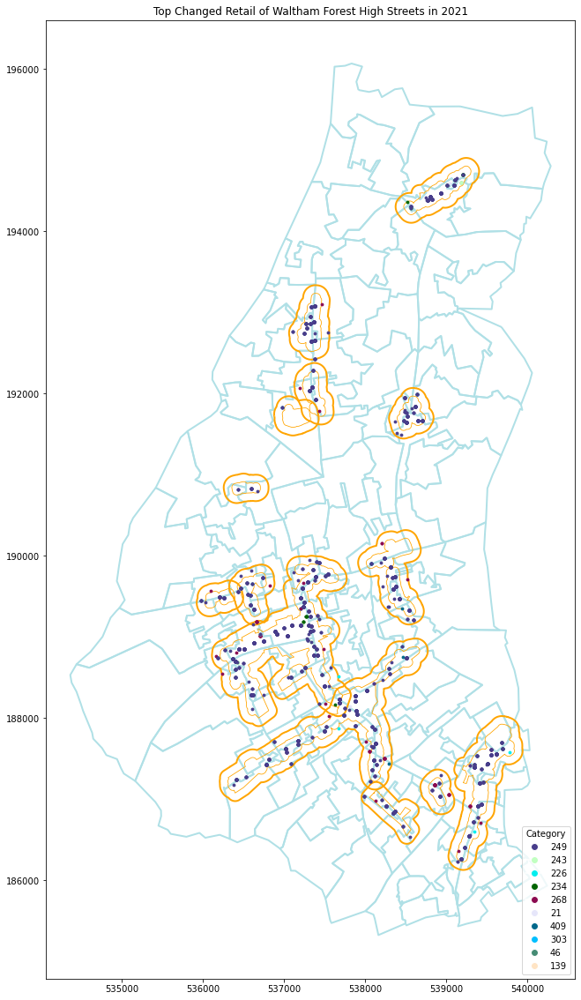

In [186]:
# plot and check - 2021
fig, ax = plt.subplots(figsize=(20,20))

wf_lsoa.plot(ax=ax, facecolor='none', edgecolor='powderblue', linewidth=2)

wf_highstreet.plot(ax=ax, linewidth=0.8, edgecolor='orange', facecolor = 'none')

wf_highstreet_buffered.plot(ax=ax, linewidth=2, edgecolor='orange', facecolor = 'none')

for category in categories2:
    if category in color_mapping2:
        color = color_mapping2[category]
        wf_hs_category21 = wf_hs_topretail21[wf_hs_topretail21['scat_code'] == category]
        if not wf_hs_category21.empty:
            wf_hs_category21.plot(ax=ax, color=color, markersize=8, label=category)


plt.title('Top Changed Retail of Waltham Forest High Streets in 2021')

# add legend
ax.legend(title='Category', loc='lower right', handles=legend_handles2, bbox_to_anchor=(1, 0))

plt.show()

#### 3. Get all LSOAs influenced by the high streets

wf_highstreet_buffered

In [187]:
# Filter out the intersecting LSOAs with high streets
radiated_lsoa = gpd.sjoin(wf_lsoa, wf_highstreet_buffered, how="inner", predicate='intersects')

radiated_lsoa.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 132 entries, 4540 to 4665
Data columns (total 23 columns):
 #   Column                                             Non-Null Count  Dtype   
---  ------                                             --------------  -----   
 0   LSOA21CD                                           132 non-null    object  
 1   LSOA21NM                                           132 non-null    object  
 2   local authority name                               132 non-null    object  
 3   local authority code                               132 non-null    object  
 4   All Households                                     132 non-null    int64   
 5   All usual residents                                132 non-null    int64   
 6   All usual residents aged 16 -74/16+ in employment  132 non-null    float64 
 7   deprivation                                        132 non-null    int64   
 8   professions                                        132 non-null    f

In [188]:
# drop index_right
radiated_lsoa = radiated_lsoa.drop(columns=['index_right'])
radiated_lsoa.head()

,LSOA21CD,LSOA21NM,local authority name,local authority code,All Households,All usual residents,All usual residents aged 16 -74/16+ in employment,deprivation,professions,youth,...,mature_adults,seniors,houseprice,geometry,highstreet_id,highstreet_name,area_ha,gdb_geomattr_data,BoroughNM,LAD11CD
4540,E01004328,Waltham Forest 028B,Waltham Forest,E09000031,-13,26,39.0,-65,106.0,32,...,70,31,317144.8,"POLYGON ((539425.622 186339.169, 539416.149 18...",503,"Leytonstone High Road, Leytonstone.",37.861426,None,Waltham Forest,E09000031
4542,E01004330,Waltham Forest 028D,Waltham Forest,E09000031,-17,-154,-3.0,-77,147.0,-63,...,31,35,332356.2,"POLYGON ((539455.978 186230.423, 539496.056 18...",503,"Leytonstone High Road, Leytonstone.",37.861426,None,Waltham Forest,E09000031
4545,E01004333,Waltham Forest 024A,Waltham Forest,E09000031,-23,-69,19.0,-50,30.0,-35,...,43,17,267375.0,"POLYGON ((539712.298 186839.140, 539715.176 18...",503,"Leytonstone High Road, Leytonstone.",37.861426,None,Waltham Forest,E09000031
4546,E01004334,Waltham Forest 024B,Waltham Forest,E09000031,-20,380,364.0,-63,107.0,37,...,75,-1,NaN,"POLYGON ((539356.338 186727.361, 539432.599 18...",503,"Leytonstone High Road, Leytonstone.",37.861426,None,Waltham Forest,E09000031
4551,E01004339,Waltham Forest 027D,Waltham Forest,E09000031,37,67,173.0,-91,228.0,-28,...,71,35,208000.0,"POLYGON ((539356.338 186727.361, 539337.348 18...",503,"Leytonstone High Road, Leytonstone.",37.861426,None,Waltham Forest,E09000031


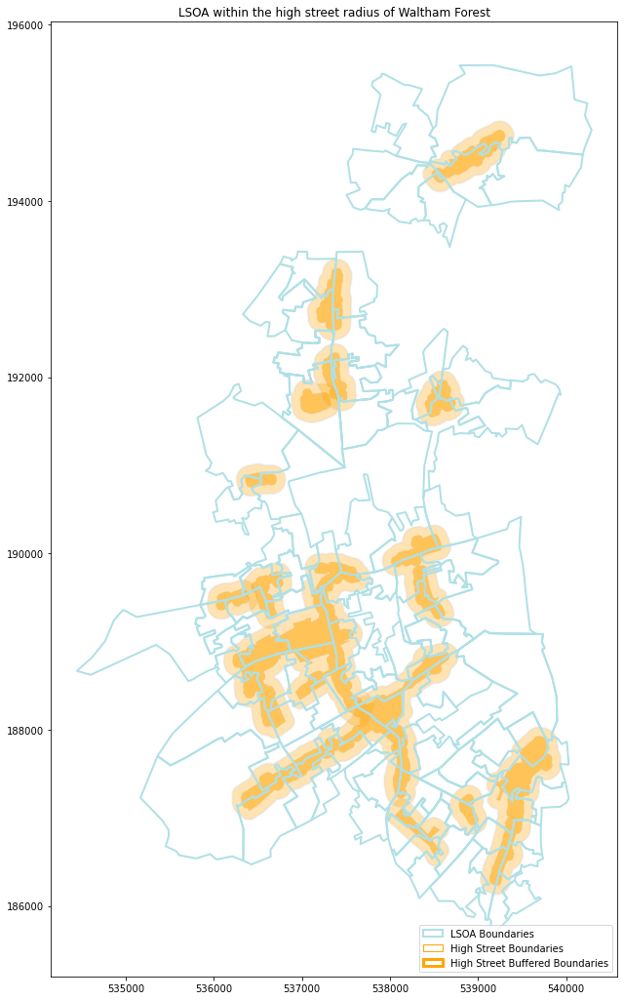

In [189]:
# plot to check
fig, ax = plt.subplots(figsize=(18,18))

wf_highstreet.plot(ax=ax, linewidth=0.8, facecolor='orange', edgecolor = 'lightgray', alpha=0.5)

wf_highstreet_buffered.plot(ax=ax, linewidth=2, facecolor='orange', edgecolor = 'lightgray', alpha=0.3)

radiated_lsoa.plot(ax=ax, facecolor='none', edgecolor='powderblue', linewidth=2)

plt.title('LSOA within the high street radius of Waltham Forest')

# add legend
ax.legend(handles=[lsoa_patch, highstreet_line1, highstreet_buffered], loc='lower right', bbox_to_anchor=(1, 0))

plt.show()

In [190]:
# get the dataframe with High Streets information and their radiated LSOAs information
result_df3 = radiated_lsoa[['highstreet_id', 'LSOA21CD']]

wf_highstreet_new = result_df3.merge(wf_highstreet, on='highstreet_id', how='outer')

wf_highstreet_lsoa = wf_highstreet_new.merge(radiated_lsoa, on='LSOA21CD', how='outer', suffixes=('', '*'))
wf_highstreet_lsoa = wf_highstreet_lsoa.filter(regex='^[^*]*$')

# change column order
wf_highstreet_lsoa.insert(21, 'geometry', wf_highstreet_lsoa.pop('geometry'))

wf_highstreet_lsoa.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 194 entries, 0 to 193
Data columns (total 22 columns):
 #   Column                                             Non-Null Count  Dtype   
---  ------                                             --------------  -----   
 0   highstreet_id                                      194 non-null    object  
 1   LSOA21CD                                           194 non-null    object  
 2   highstreet_name                                    194 non-null    object  
 3   area_ha                                            194 non-null    float64 
 4   gdb_geomattr_data                                  0 non-null      object  
 5   BoroughNM                                          194 non-null    object  
 6   LAD11CD                                            194 non-null    object  
 7   LSOA21NM                                           194 non-null    object  
 8   local authority name                               194 non-null    object  
 9  

In [191]:
wf_highstreet_lsoa.sample(5)

,highstreet_id,LSOA21CD,highstreet_name,area_ha,gdb_geomattr_data,BoroughNM,LAD11CD,LSOA21NM,local authority name,local authority code,...,All usual residents aged 16 -74/16+ in employment,deprivation,professions,youth,young_adults,middle_aged_adults,mature_adults,seniors,houseprice,geometry
72,508,E01004412,"High Street/Hoe Street, Walthamstow",95.428617,None,Waltham Forest,E09000031,Waltham Forest 015A,Waltham Forest,E09000031,...,97.0,-84,213.0,-42,1,-9,69,29,415356.2,"POLYGON ((537725.781 188284.363, 537670.049 18..."
118,609,E01004367,"Lea Bridge Road/High Road, Leyton",67.408489,None,Waltham Forest,E09000031,Waltham Forest 019D,Waltham Forest,E09000031,...,58.0,-50,98.0,-41,-72,42,48,-12,319666.7,"POLYGON ((537670.049 188125.077, 537725.781 18..."
102,507,E01004467,"Wood Street, Wood Street.",21.766876,None,Waltham Forest,E09000031,Waltham Forest 015D,Waltham Forest,E09000031,...,124.0,-99,163.0,69,-94,120,111,-14,202875.0,"POLYGON ((538548.242 190188.508, 538559.398 19..."
87,253,E01004457,"Forest Road & Palmerston Road, Walthamstow",10.135427,None,Waltham Forest,E09000031,Waltham Forest 012B,Waltham Forest,E09000031,...,137.0,-81,244.0,-54,-8,-29,120,-15,281625.0,"POLYGON ((536774.219 189748.454, 536776.403 18..."
98,507,E01004465,"Wood Street, Wood Street.",21.766876,None,Waltham Forest,E09000031,Waltham Forest 015B,Waltham Forest,E09000031,...,96.0,-32,139.0,0,-48,73,65,28,360125.0,"POLYGON ((538548.242 190188.508, 538559.398 19..."


##### Calculate the averages for each high street

In [192]:
columns_to_average = wf_highstreet_lsoa.columns[10:]

averaged_wf_highstreet_lsoa = wf_highstreet_lsoa.groupby('highstreet_id')[columns_to_average].mean().round(4).reset_index()

averaged_wf_highstreet_lsoa = pd.merge(wf_highstreet, averaged_wf_highstreet_lsoa, on='highstreet_id', how='left', suffixes=('', '*'))
averaged_wf_highstreet_lsoa = averaged_wf_highstreet_lsoa.filter(regex='^[^*]*$')
averaged_wf_highstreet_lsoa

,highstreet_id,highstreet_name,area_ha,gdb_geomattr_data,BoroughNM,LAD11CD,geometry,All Households,All usual residents,All usual residents aged 16 -74/16+ in employment,deprivation,professions,youth,young_adults,middle_aged_adults,mature_adults,seniors,houseprice
0,237,"Billet Road, Walthamstow.",4.395863,None,Waltham Forest,E09000031,"POLYGON ((536538.954 190900.525, 536542.912 19...",103.3333,373.6667,288.3333,-24.3333,248.0000,55.3333,110.3333,104.6667,81.6667,21.6667,265718.7333
1,244,"Forest Road (Pembar Avenue), Blackhorse Road",5.781402,None,Waltham Forest,E09000031,"POLYGON ((536387.113 189539.524, 536388.069 18...",-7.1429,-35.4286,34.5714,-91.7143,169.4286,-24.7143,-174.7143,83.2857,63.8571,16.8571,335455.4800
2,249,"Burnside Avenue, Walthamstow.",7.221877,None,Waltham Forest,E09000031,"POLYGON ((537128.872 191807.945, 537130.364 19...",120.7778,458.3333,250.2222,-9.5556,162.0000,145.6667,75.2222,138.4444,77.7778,21.2222,235678.3000
3,250,"Chingford Mount Road, Walthamstow.",9.698066,None,Waltham Forest,E09000031,"POLYGON ((537509.991 191894.780, 537509.035 19...",108.2727,415.5455,219.4545,-14.9091,158.5455,130.2727,63.1818,128.5455,65.2727,28.2727,235577.7000
4,252,"Old Church Road, Chingford.",13.973184,None,Waltham Forest,E09000031,"POLYGON ((537451.583 192633.269, 537451.715 19...",37.4444,202.2222,106.0000,-41.3333,97.6667,62.3333,17.4444,48.7778,63.0000,10.6667,226417.0333
5,253,"Forest Road & Palmerston Road, Walthamstow",10.135427,None,Waltham Forest,E09000031,"POLYGON ((536774.219 189748.454, 536776.403 18...",93.0000,223.0000,193.4667,-38.6667,236.9333,25.6000,-56.0667,130.2667,94.7333,28.4667,295472.1308
6,257,"Grove Green Road, Leytonstone.",4.605851,None,Waltham Forest,E09000031,"POLYGON ((538947.848 186917.325, 538938.094 18...",5.0000,-47.8571,49.0000,-82.0000,127.5714,-44.2857,-141.1429,69.0000,44.7143,23.8571,252616.2429
7,397,"The Avenue, Highams Park.",9.215191,None,Waltham Forest,E09000031,"POLYGON ((538679.256 191889.252, 538684.327 19...",61.2000,253.4000,140.6000,-20.2000,141.8000,44.8000,64.4000,54.8000,70.4000,19.0000,283512.5000
8,466,"Francis Road, Leyton",6.813432,None,Waltham Forest,E09000031,"POLYGON ((538057.472 187025.286, 538112.679 18...",33.4286,30.7857,92.8571,-67.8571,181.8571,-37.2143,-102.0714,103.4286,54.9286,11.7143,294492.4500
9,503,"Leytonstone High Road, Leytonstone.",37.861426,None,Waltham Forest,E09000031,"POLYGON ((539839.361 187616.515, 539842.206 18...",7.0500,-17.7000,55.0000,-67.7500,98.2500,-32.5500,-136.6000,66.3000,49.3500,35.8000,251072.8789


### Merge LSOA and open local data according to the id of highstreets

In [193]:
wf_hs_lsoa_retail = averaged_wf_highstreet_lsoa.merge(composition_duration, on = 'highstreet_id', how='outer')

wf_hs_lsoa_retail

,highstreet_id,highstreet_name,area_ha,gdb_geomattr_data,BoroughNM,LAD11CD,geometry,All Households,All usual residents,All usual residents aged 16 -74/16+ in employment,...,21,46,139,226,234,243,249,268,303,409
0,237,"Billet Road, Walthamstow.",4.395863,None,Waltham Forest,E09000031,"POLYGON ((536538.954 190900.525, 536542.912 19...",103.3333,373.6667,288.3333,...,0,0,0,0,0,0,3,0,0,0.0
1,244,"Forest Road (Pembar Avenue), Blackhorse Road",5.781402,None,Waltham Forest,E09000031,"POLYGON ((536387.113 189539.524, 536388.069 18...",-7.1429,-35.4286,34.5714,...,0,0,0,0,0,0,48,-24,0,1.0
2,249,"Burnside Avenue, Walthamstow.",7.221877,None,Waltham Forest,E09000031,"POLYGON ((537128.872 191807.945, 537130.364 19...",120.7778,458.3333,250.2222,...,0,0,0,0,0,0,0,0,0,0.0
3,250,"Chingford Mount Road, Walthamstow.",9.698066,None,Waltham Forest,E09000031,"POLYGON ((537509.991 191894.780, 537509.035 19...",108.2727,415.5455,219.4545,...,0,0,0,0,0,0,57,-43,0,0.0
4,252,"Old Church Road, Chingford.",13.973184,None,Waltham Forest,E09000031,"POLYGON ((537451.583 192633.269, 537451.715 19...",37.4444,202.2222,106.0000,...,2,0,-2,-4,-118,0,145,-51,0,0.0
5,253,"Forest Road & Palmerston Road, Walthamstow",10.135427,None,Waltham Forest,E09000031,"POLYGON ((536774.219 189748.454, 536776.403 18...",93.0000,223.0000,193.4667,...,0,0,0,0,-14,0,37,-1,0,0.0
6,257,"Grove Green Road, Leytonstone.",4.605851,None,Waltham Forest,E09000031,"POLYGON ((538947.848 186917.325, 538938.094 18...",5.0000,-47.8571,49.0000,...,0,0,0,-79,0,0,16,18,0,0.0
7,397,"The Avenue, Highams Park.",9.215191,None,Waltham Forest,E09000031,"POLYGON ((538679.256 191889.252, 538684.327 19...",61.2000,253.4000,140.6000,...,-33,0,0,1,0,-6,101,-189,-11,-2.0
8,466,"Francis Road, Leyton",6.813432,None,Waltham Forest,E09000031,"POLYGON ((538057.472 187025.286, 538112.679 18...",33.4286,30.7857,92.8571,...,0,-146,0,0,0,0,39,-4,-3,0.0
9,503,"Leytonstone High Road, Leytonstone.",37.861426,None,Waltham Forest,E09000031,"POLYGON ((539839.361 187616.515, 539842.206 18...",7.0500,-17.7000,55.0000,...,0,-17,0,4,-560,-20,232,11,-9,-1.0


In [194]:
# change the last afew columns from float to int
wf_hs_lsoa_retail.iloc[:, 23:37] = wf_hs_lsoa_retail.iloc[:, 23:37].astype(int)

wf_hs_lsoa_retail.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 14 entries, 0 to 13
Data columns (total 33 columns):
 #   Column                                             Non-Null Count  Dtype   
---  ------                                             --------------  -----   
 0   highstreet_id                                      14 non-null     object  
 1   highstreet_name                                    14 non-null     object  
 2   area_ha                                            14 non-null     float64 
 3   gdb_geomattr_data                                  0 non-null      object  
 4   BoroughNM                                          14 non-null     object  
 5   LAD11CD                                            14 non-null     object  
 6   geometry                                           14 non-null     geometry
 7   All Households                                     14 non-null     float64 
 8   All usual residents                                14 non-null     float64

## Analysis

In [204]:
df_num = wf_hs_lsoa_retail.iloc[:, 10:33]

df_num

,deprivation,professions,youth,young_adults,middle_aged_adults,mature_adults,seniors,houseprice,less_than_1year,1_to_3yrs,...,21,46,139,226,234,243,249,268,303,409
0,-24.3333,248.0000,55.3333,110.3333,104.6667,81.6667,21.6667,265718.7333,-8,1,...,0,0,0,0,0,0,3,0,0,0
1,-91.7143,169.4286,-24.7143,-174.7143,83.2857,63.8571,16.8571,335455.4800,-26,2,...,0,0,0,0,0,0,48,-24,0,1
2,-9.5556,162.0000,145.6667,75.2222,138.4444,77.7778,21.2222,235678.3000,-1,0,...,0,0,0,0,0,0,0,0,0,0
3,-14.9091,158.5455,130.2727,63.1818,128.5455,65.2727,28.2727,235577.7000,-43,8,...,0,0,0,0,0,0,57,-43,0,0
4,-41.3333,97.6667,62.3333,17.4444,48.7778,63.0000,10.6667,226417.0333,-101,17,...,2,0,-2,-4,-118,0,145,-51,0,0
5,-38.6667,236.9333,25.6000,-56.0667,130.2667,94.7333,28.4667,295472.1308,-50,2,...,0,0,0,0,-14,0,37,-1,0,0
6,-82.0000,127.5714,-44.2857,-141.1429,69.0000,44.7143,23.8571,252616.2429,-27,7,...,0,0,0,-79,0,0,16,18,0,0
7,-20.2000,141.8000,44.8000,64.4000,54.8000,70.4000,19.0000,283512.5000,-65,12,...,-33,0,0,1,0,-6,101,-189,-11,-2
8,-67.8571,181.8571,-37.2143,-102.0714,103.4286,54.9286,11.7143,294492.4500,-40,5,...,0,-146,0,0,0,0,39,-4,-3,0
9,-67.7500,98.2500,-32.5500,-136.6000,66.3000,49.3500,35.8000,251072.8789,-174,31,...,0,-17,0,4,-560,-20,232,11,-9,-1


In [261]:
df_num2 = averaged_wf_highstreet_lsoa.iloc[:, 10:33]

df_num2

,deprivation,professions,youth,young_adults,middle_aged_adults,mature_adults,seniors,houseprice
0,-24.3333,248.0000,55.3333,110.3333,104.6667,81.6667,21.6667,265718.7333
1,-91.7143,169.4286,-24.7143,-174.7143,83.2857,63.8571,16.8571,335455.4800
2,-9.5556,162.0000,145.6667,75.2222,138.4444,77.7778,21.2222,235678.3000
3,-14.9091,158.5455,130.2727,63.1818,128.5455,65.2727,28.2727,235577.7000
4,-41.3333,97.6667,62.3333,17.4444,48.7778,63.0000,10.6667,226417.0333
5,-38.6667,236.9333,25.6000,-56.0667,130.2667,94.7333,28.4667,295472.1308
6,-82.0000,127.5714,-44.2857,-141.1429,69.0000,44.7143,23.8571,252616.2429
7,-20.2000,141.8000,44.8000,64.4000,54.8000,70.4000,19.0000,283512.5000
8,-67.8571,181.8571,-37.2143,-102.0714,103.4286,54.9286,11.7143,294492.4500
9,-67.7500,98.2500,-32.5500,-136.6000,66.3000,49.3500,35.8000,251072.8789


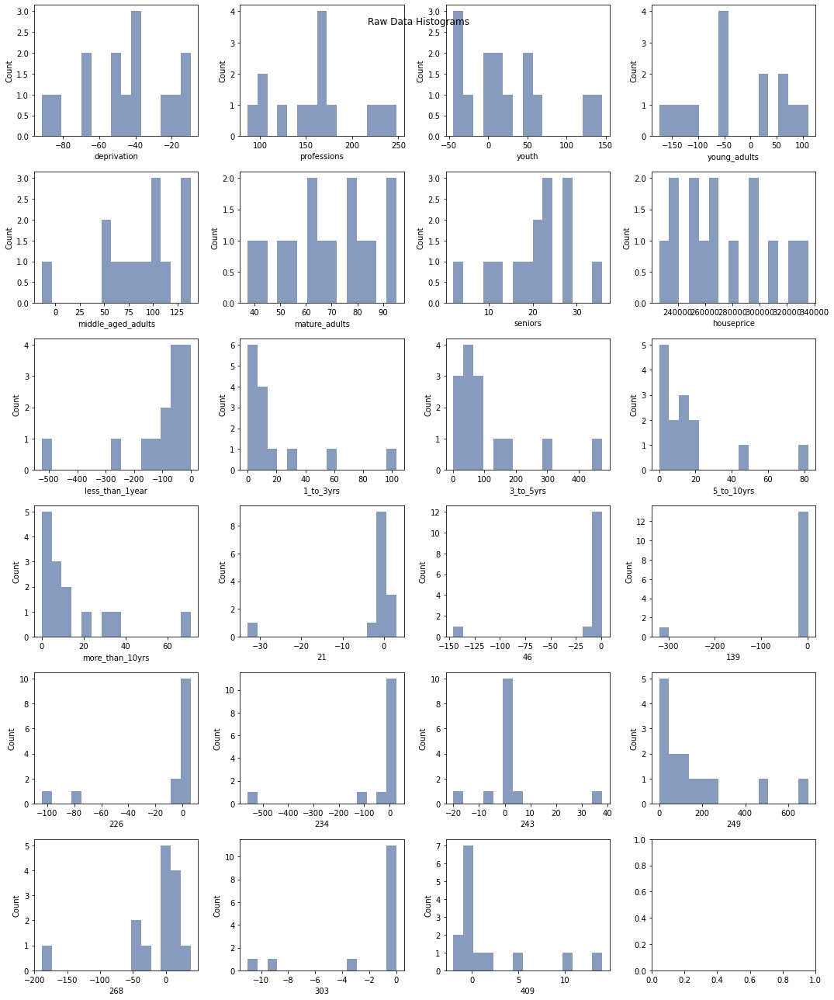

In [208]:
import matplotlib.pyplot as plt

# Calculate the number of rows and columns for subplots
num_cols = df_num.shape[1]
num_rows = (num_cols + 3) // 4  # Divide and round up

# Create subplots
fig, axs = plt.subplots(num_rows, 4, figsize=(15, 3 * num_rows))
axs = axs.ravel()  # Flatten the 2D array of axes

for i, col in enumerate(df_num.columns):
    axs[i].hist(df_num[col], bins=15, color="#869bbd")
    axs[i].set_xlabel(col)
    axs[i].set_ylabel("Count")

# Adjust layout and spacing
plt.tight_layout()

# Add a title
plt.suptitle("Raw Data Histograms")
plt.show()


In [209]:
# plt.suptitle(f"Figure 4 - Raw Data Histograms", x=0.025, size=18, **tfont)

### Standardisation

In [210]:
# Using the `RobustScaler` class from the `sklearn` package for standardising the dataset

rs = RobustScaler(quantile_range=(10.0, 90.0))

Standardised = df_num.copy()
for r in df_num.columns.values:
    Standardised[r] = rs.fit_transform(df_num[r].values.reshape(-1,1))
    print("The range of {} is [{}, {}]".format(r, Standardised[r].min(), Standardised[r].max()))
Standardised.head()

The range of deprivation is [-0.8025210591576075, 0.5386098703313507]
The range of professions is [-0.5823966202849876, 0.6324281482073485]
The range of youth is [-0.38742119484668724, 0.9162488215129803]
The range of young_adults is [-0.595685157183823, 0.7504310276230279]
The range of middle_aged_adults is [-1.4221467632267843, 0.5016807745963288]
The range of mature_adults is [-0.6727988055047205, 0.6027433310650251]
The range of seniors is [-1.185059606874644, 0.7588142202677143]
The range of houseprice is [-0.48040194900810257, 0.8056890584964825]
The range of less_than_1year is [-2.033492822966507, 0.24575902566333185]
The range of 1_to_3yrs is [-0.16129032258064507, 2.0537634408602137]
The range of 3_to_5yrs is [-0.21467603434816537, 1.6354410616705688]
The range of 5_to_10yrs is [-0.2732240437158468, 1.9672131147540968]
The range of more_than_10yrs is [-0.18237082066869298, 1.9756838905775072]
The range of 21 is [-6.875, 0.625]
The range of 46 is [-12.268907563025211, 0.0840336

,deprivation,professions,youth,young_adults,middle_aged_adults,mature_adults,seniors,houseprice,less_than_1year,1_to_3yrs,...,21,46,139,226,234,243,249,268,303,409
0,0.297384,0.632428,0.296278,0.750431,0.075011,0.304578,-0.052162,-0.016845,0.215311,-0.139785,...,0.000000,0.0,0.000000,0.000000,0.000000,0.0,-0.194722,0.000000,0.0,0.000000
1,-0.802521,0.041142,-0.253100,-0.595685,-0.195068,-0.087633,-0.328139,0.805689,0.137016,-0.118280,...,0.000000,0.0,0.000000,0.000000,0.000000,0.0,-0.079426,-0.345821,0.0,0.108696
2,0.538610,-0.014762,0.916249,0.584621,0.501681,0.218935,-0.077667,-0.371167,0.245759,-0.161290,...,0.000000,0.0,0.000000,0.000000,0.000000,0.0,-0.202408,0.000000,0.0,0.000000
3,0.451221,-0.040758,0.810598,0.527762,0.376641,-0.056458,0.326894,-0.372353,0.063071,0.010753,...,0.000000,0.0,0.000000,0.000000,0.000000,0.0,-0.056367,-0.619597,0.0,0.000000
4,0.019881,-0.498899,0.344320,0.311770,-0.630961,-0.106508,-0.683347,-0.480402,-0.189213,0.204301,...,0.416667,0.0,-1.428571,-0.066445,-1.177645,0.0,0.169101,-0.734870,0.0,0.000000


Text(0.5, 1.0, 'Scatter Plot: Sales Kiosks ~ Middle_aged_adults (Standardised)')

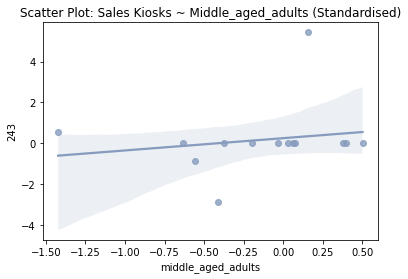

In [221]:
sns.regplot(x="middle_aged_adults", y="243", data=Standardised, color='#869bbd')
plt.title('Scatter Plot: Sales Kiosks ~ Middle_aged_adults (Standardised)')

In [262]:
# Using the `RobustScaler` class from the `sklearn` package for standardising the dataset

rs = RobustScaler(quantile_range=(10.0, 90.0))

Standardised2 = df_num2.copy()
for r in df_num2.columns.values:
    Standardised2[r] = rs.fit_transform(df_num2[r].values.reshape(-1,1))
    print("The range of {} is [{}, {}]".format(r, Standardised2[r].min(), Standardised2[r].max()))
Standardised2.head()

The range of deprivation is [-0.8025210591576075, 0.5386098703313507]
The range of professions is [-0.5823966202849876, 0.6324281482073485]
The range of youth is [-0.38742119484668724, 0.9162488215129803]
The range of young_adults is [-0.595685157183823, 0.7504310276230279]
The range of middle_aged_adults is [-1.4221467632267843, 0.5016807745963288]
The range of mature_adults is [-0.6727988055047205, 0.6027433310650251]
The range of seniors is [-1.185059606874644, 0.7588142202677143]
The range of houseprice is [-0.48040194900810257, 0.8056890584964825]


,deprivation,professions,youth,young_adults,middle_aged_adults,mature_adults,seniors,houseprice
0,0.297384,0.632428,0.296278,0.750431,0.075011,0.304578,-0.052162,-0.016845
1,-0.802521,0.041142,-0.253100,-0.595685,-0.195068,-0.087633,-0.328139,0.805689
2,0.538610,-0.014762,0.916249,0.584621,0.501681,0.218935,-0.077667,-0.371167
3,0.451221,-0.040758,0.810598,0.527762,0.376641,-0.056458,0.326894,-0.372353
4,0.019881,-0.498899,0.344320,0.311770,-0.630961,-0.106508,-0.683347,-0.480402


In [244]:
# Function1: Radar plots of the cluster centroids
def radar_plot_centroids(df_cluster_centroid):
    """
    To visually represent one or more groups of values over multiple variables.
    
    Parameters
    ----------
    df_cluster_centroid: a dataframe with rows representing a cluster centroid and columns representing variables
    
    """
    
    # Add an additional element to categories that’s identical to the first item
    # Manually 'close' the line
    categories = df_cluster_centroid.columns.values.tolist()
    categories = [*categories, categories[0]]
    
    label_loc = np.linspace(start=0, stop=2 * np.pi, num=len(categories))
    
    plt.figure(figsize=(6, 6))
    plt.subplot(polar=True)
    for index, row in df_cluster_centroid.iterrows():
        centroid = row.tolist()
        centroid = [*centroid, centroid[0]]
        label = "Cluster {}".format(index)
        plt.plot(label_loc, centroid, label=label)
    lines, labels = plt.thetagrids(np.degrees(label_loc), labels=categories)
    plt.legend()
    plt.show()
    
    
# Function 2: Dendrograms for hierarchical clustering
def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, leaf_rotation=90., **kwargs)

### DBSCAN

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


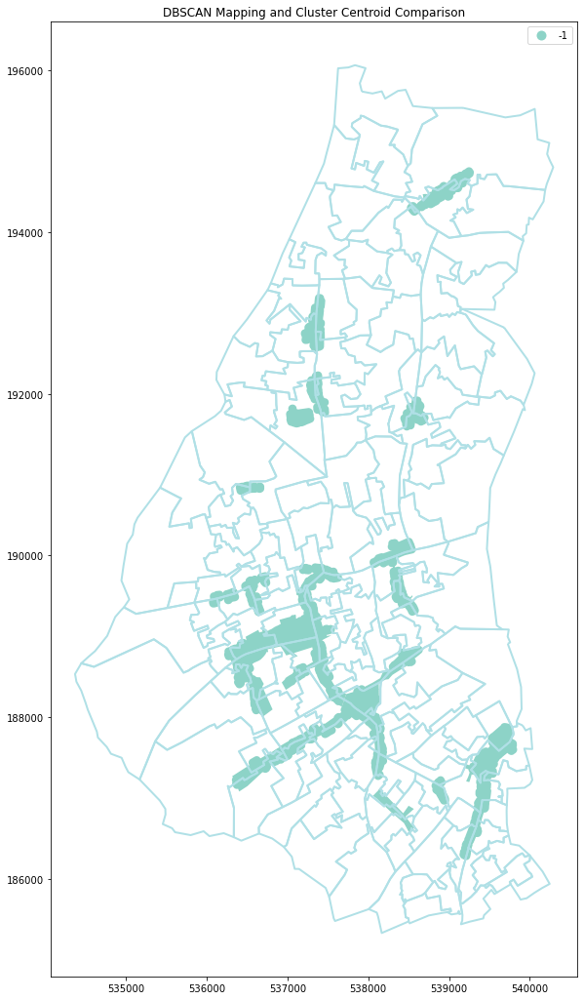

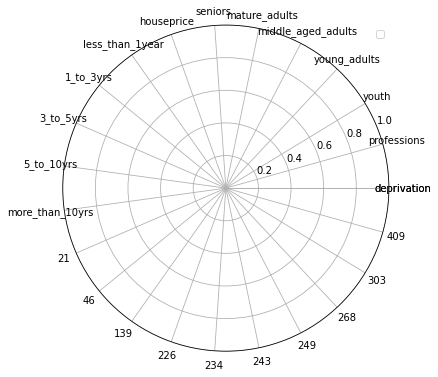

In [295]:
# The two parameters `eps` and `min_samples` can be edited. Set initial values first.
minPts = Standardised.shape[1]
epsilon = 5 # The maximum distance between two samples defalut = 5
dbsc = DBSCAN(eps=epsilon, min_samples=minPts)
dbsc.fit(Standardised)

# We now have our DBSCAN object created, and we can extract the groups it has identified. We do this using the `.labels_` method.
cluster_nm = dbsc.labels_



df_geo = wf_hs_lsoa_retail.copy()

def mapping(num_of_cluster):
    fig, ax = plt.subplots(figsize=(18,18))
    df_geo['cluster_nm'] = num_of_cluster
    df_geo.plot(ax = ax,column='cluster_nm', categorical=True, legend=True,  cmap='Set3')
    wf_lsoa.plot(ax=ax, facecolor='none', edgecolor='powderblue', linewidth=2)
    plt.title('DBSCAN Mapping and Cluster Centroid Comparison')

mapping(cluster_nm)

df_dbscan = Standardised.copy()
df_dbscan['cluster'] = dbsc.labels_
df_dbscan_centroid = df_dbscan.groupby('cluster').mean()

# drop the outlier
df_dbscan_centroid.drop(-1, inplace=True)
# df_dbscan_centroid.reset_index()
radar_plot_centroids(df_dbscan_centroid)

### K-Means

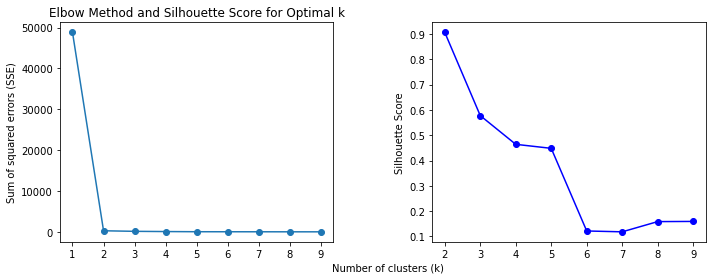

In [227]:
# 1. plot the variation curve of Sum of Squared Errors (SSE) using the Elbow method to find the k corresponding to the inflection point;

# 2. check the silhouette score for different k values to confirm the most appropriate number of clusters.


# Setting the range of k
k_range1 = range(1, 10) 

# 1. Elbow method SSE ~ K
# initialise SSE list
SSE = []
# calculate the K-means model for each K value and calculate the SSE
for k in k_range1:
    km = KMeans(n_clusters=k, random_state=0)
    km.fit(Standardised)
    SSE.append(km.inertia_)

# 2. Silhoutte score SS ~ K
k_range2 = range(2, 10) # sihoutte score start from 2
Silhouette_scores = []
for k in k_range2:
    n_clusters = k
    clusterer = sklc.KMeans(n_clusters=n_clusters, random_state=0).fit(Standardised)
    cluster_labels = clusterer.labels_
    silhouette_avg = sklm.silhouette_score(Standardised, cluster_labels)
    Silhouette_scores.append(silhouette_avg)

    
# Plotting
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(10, 4))

# 1.elbow
ax1.plot(k_range1, SSE, marker='o')
ax1.set_xlabel('Number of clusters (k)', x=1.2)
ax1.set_ylabel('Sum of squared errors (SSE)')
ax1.set_title('Elbow Method and Silhouette Score for Optimal k')

# 2. silhoutte
ax2.plot(k_range2, Silhouette_scores, 'bo-', label='Silhouette Score')
ax2.set_ylabel('Silhouette Score')

plt.tight_layout()
plt.show()

number of cluste 2-5

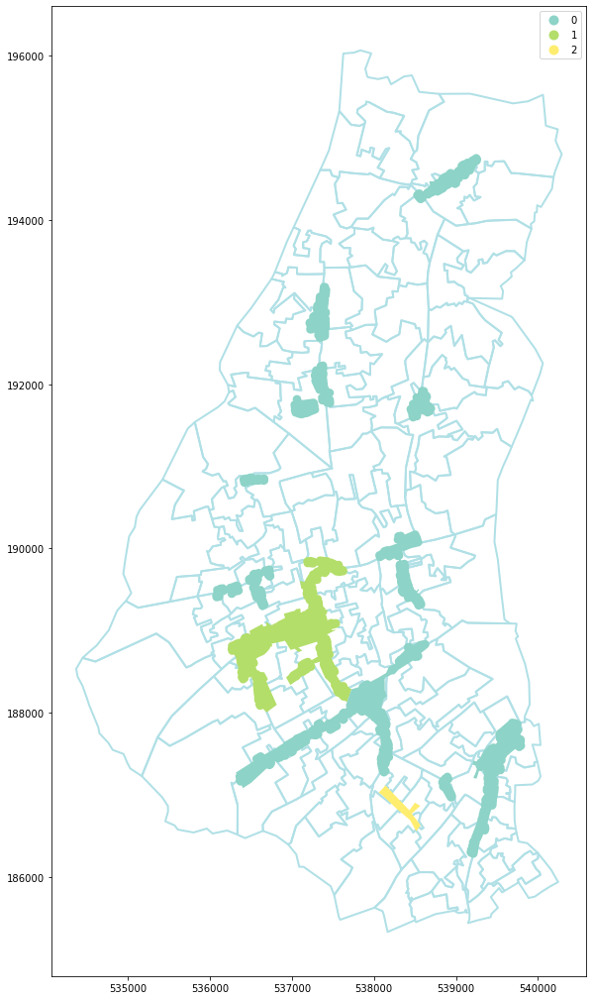

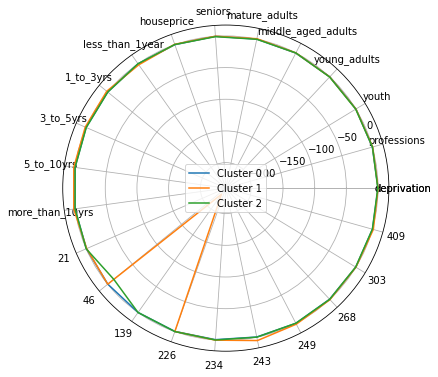

In [242]:
def mapping(num_of_cluster):
    fig, ax = plt.subplots(figsize=(18,18))
    df_geo['cluster_nm'] = num_of_cluster
    wf_lsoa.plot(ax=ax, facecolor='none', edgecolor='powderblue', linewidth=2)
    df_geo.plot(ax = ax, column='cluster_nm', categorical=True, legend=True, cmap='Set3')
    
    #plt.title('K-Means Clustering Mapping and Cluster Centroid Comparison')
    
k_cluster = 3
random_seed = 1
kmeans = KMeans(n_clusters=k_cluster,random_state=random_seed)
kmeans.fit(Standardised)

# plotting
mapping(kmeans.labels_)

df_cluster_centroid = pd.DataFrame(kmeans.cluster_centers_, columns=Standardised.columns)
radar_plot_centroids(df_cluster_centroid)

### Hierarchical clustering

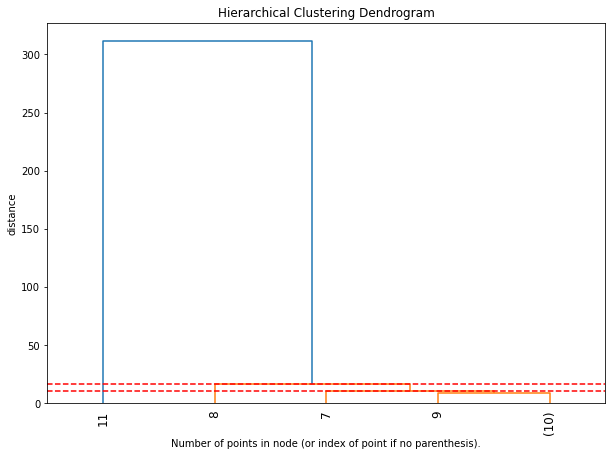

In [255]:
# generate and draw a tree diagram from the clustering process to show the hierarchy of clusters.
agg_cluster = AgglomerativeClustering(distance_threshold=0, n_clusters=None).fit(Standardised)
fig, ax = plt.subplots(figsize=(10,7))
plt.title("Hierarchical Clustering Dendrogram")
# plot the top three levels of the dendrogram

plot_dendrogram(agg_cluster, truncate_mode="level", p=3)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.ylabel('distance')
plt.hlines(17, ax.get_xlim()[0], ax.get_xlim()[1], linestyle='dashed', color='r')
plt.hlines(11, ax.get_xlim()[0], ax.get_xlim()[1], linestyle='dashed', color='r')
plt.show()

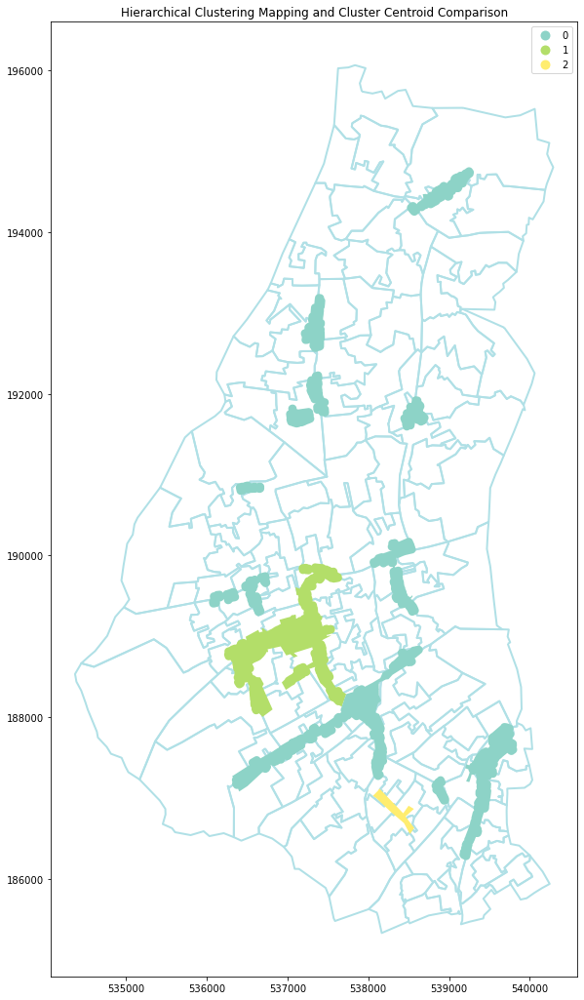

In [265]:
agg_cluster = AgglomerativeClustering(distance_threshold=None, n_clusters=3).fit(Standardised)

def mapping(num_of_cluster):
    fig, ax = plt.subplots(figsize=(18,18))
    df_geo['cluster_nm'] = num_of_cluster
    wf_lsoa.plot(ax=ax, facecolor='none', edgecolor='powderblue', linewidth=2)
    df_geo.plot(ax = ax, column='cluster_nm', categorical=True, legend=True, cmap='Set3')
    plt.title('Hierarchical Clustering Mapping and Cluster Centroid Comparison')

mapping(agg_cluster.labels_)


### CorrelatedMatrix

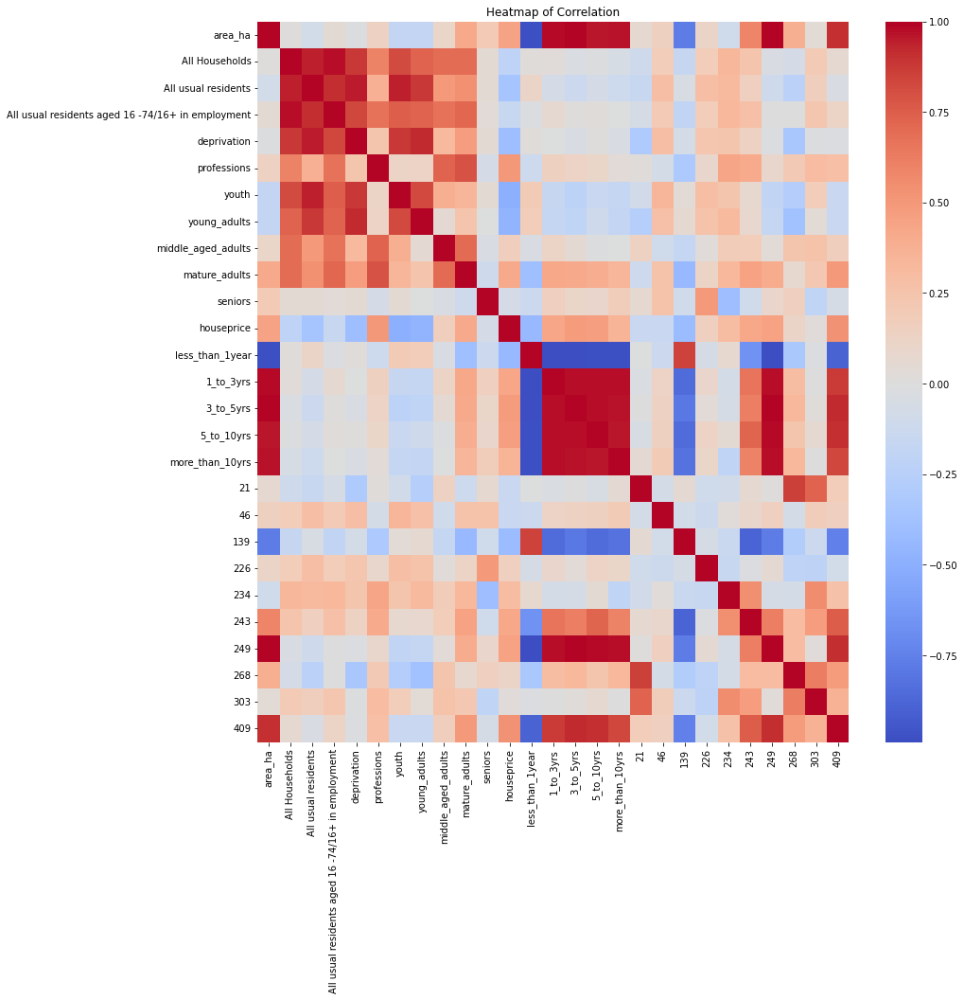

In [260]:
df = wf_hs_lsoa_retail.copy()

df = df.drop(columns=['geometry'])

# Calculate the correlation matrix
correlation_matrix = df.corr()

# Create a heatmap
plt.figure(figsize=(14, 14))
sns.heatmap(correlation_matrix, cmap='coolwarm', center=0, annot=False)
plt.title('Heatmap of Correlation')
plt.show()